# Coursework 2: Robotic behavioural cloning from images and actuator data

## Description
For this coursework, you are required to develop a behaviour cloning model. Behaviour cloning is a technique for training robotic agents using a dataset of sequences of actions. Consider the supervised learning definition where we have a dataset of observatios $d=\{(x_{1},y_{1}),...,(x_{n},y_{n})\}$ and the aim is to learn a function: $f:\mathcal{X}\rightarrow\mathcal{Y}$. In this case, $\mathcal{X}$ is the set of "observations" that the robot makes and $\mathcal{Y}$ is the set of actions that the robot takes.

The dataset you have been provided with contains examples of robot arms being required to pickup objects or drop objects (given it has already picked the object up) in a specific place. The observation space ($\mathcal{X}$) consists of:
- "front_cam_ob": A 3rd person image of the scene 
- "mount_cam_ob": An image of the scene taken from a camera mounted on top of the robotic arm, looking down
- "ee_cartesian_pos_ob": The positional and orientation co-ordinates of the robotic arm
- "ee_cartesian_vel_ob": The velocity of position and orientation of the robotic arm
- "joint_pos_ob": The position of the gripper which opens and closes

The action space ($\mathcal{Y}$) consists of:
- Three co-ordinates defining how much to move the robotic arm
- An action defining whether to open, not to move or close the gripper

The dataset is split into "trajectories" i.e., sequences of:
- $x_{i}$: The front_cam_ob, mount_cam_ob, ee_cartesian_pos_ob, ee_cartesian_vel_ob, joint_pos_ob __at time point i__ 
- $y_{i}$: The action taken i.e., how to move the arm and the gripper __given the observations__ in $x_{i}$

More information on the dataset can be found at: https://github.com/clvrai/clvr_jaco_play_dataset?tab=readme-ov-file

### Task
Your task has been split into several questions, each exploring how to develop an appropriate model for learning $f:\mathcal{X}\rightarrow\mathcal{Y}$. The task will require you to:
- Question 1: Tune an end-to-end supervised learning model taking in the full set of observations and predicting actions: You will be required to evaluate a proposed deep learning architecture (which takes as input all of front_cam_ob, mount_cam_ob, ee_cartesian_pos_ob, ee_cartesian_vel_ob and joint_pos_ob and predict the two actions) and propose a new model which outperforms the existing model;
- Question 2: Define and evaluate a VAE model for performing self-supervised learning and tune it as best you can, to learn a latent representation that can be used as input to a downstream supervised model for behaviour cloning
- Question 3: Evaluate the performance of your model proposed in question 1 against your self-supervised VAE representations from question 2 (plus a supervised head) on the test set

### Pointers
Some helper functions have been provided for you including the following functionality:
- A training and validation loop capabale of:
  - Handling "half-precision" modelling;
  - Logging results to weights and biases;
- An eda template to help you visualise the data
- An evaluation template to help you load saved model checkpoints from weights and biases
- A preprocessing script to help you convert the data into train/validation and test splits;
  - In this preprocessing script, trajectories longer than 75 timesteps have been removed to ease the computational requirements of the task;
- A torch Dataset class capable of handling the multi-model nature of the data;
- A example collate_fn to use in Dataloaders

Additionally, it is strongly suggested to call ```torch.manual_seed(1)``` whenever you initialise your model (i.e., when you first create the model or call model.reset()). This will ensure the parameters are initialised at the same value each time.

### IMPORTANT
- You are __not__ allowed to use pre-trained models, developed outside of this coursework i.e., you could __not__ use a pre-trained YOLO model
- Questions have been marked under the title "Task", ensure that you answer/address all of the bullet points under these headings


## Data download
Download the data for the project from here: https://drive.usercontent.google.com/download?id=1tVSilmXhyQd8gxZAEhvKMnynw0qzRFSZ&authuser=0

Save the data locally at: ../data/all_play_data_diverse or in Google Collab at: /content/drive/MyDrive/comp0188_2425/cw2. Saving the data in these locations will ensure the proprocessing script provided runs correctly. If you would like to alter these locations, you can alter them in the config.py file of the provided comp0188_cw2 package via the ROOT_PATH global variable.

### transition_df.csv
You have additionally been provided with a csv called "transition_df.csv". This contains a row for each observation/action pair in the dataset and is used to generate the train/validation and test datasets for this task. Note that this csv contains all trajectories (even those over 75 timesteps). This csv might also be useful for EDA. The transition_df.csv should be placed in the same folder that you placed the raw data in (discussed above).

## Imports

The comp0188_cw2 contains some config functionality so that you can run the code in collab and locally (to test models)! When you first import the package, import the project_options and set the appropriate configs.
- project_options.collab = True will set the dataset directories for google collab whilst false will set suitable local directories
- project_options.debug = True will load a subset of data whilst False will load all of the data. 

__IMPORTANT__: Alterting these options __once you have loaded other functionality__ from comp0188_cw2 may result in unintended outcomes.

## **IMPORTANT NOTICE** 

If the marker is willing to re-run some of the experiments on a Colab notebook, please ensure:

1. COLAB = True
2. MAC = False
3. Before each training procedure, set run_new_eval to True. Else, the saved models in the `trained_models` folder will be loaded for the corresponding anaylisis - always indicated-.

In [2]:
COLLAB = True
if COLLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    !pip install --force-reinstall git+https://github.com/joshuaspear/pymlrf.git
    !pip install wandb
    !pip install torchinfo
    !pip install jaxtyping
    !pip install git+https://github.com/GonzaloPlaaza/comp0188_cw2_public.git
    !pip install typeguard==2.13.3

    # Clone the repository
    !git clone https://github.com/GonzaloPlaaza/comp0188_cw2_public.git

    # Move to the desired folder
    !cp -r comp0188_cw2_public/trained_models ./trained_models

    # Clean up if needed
    !rm -rf comp0188_cw2_modified

    # Verify
    !ls trained_models  

Ignore the error: 
```ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.inflect 7.4.0 requires typeguard>=4.0.1, but you have typeguard 2.13.3 which is incompatible.```

In [3]:
from comp0188_cw2 import project_options
project_options.collab = COLLAB
print(project_options.collab) 
project_options.debug = False
print(project_options.debug)
MAC = False

False
False


In [4]:
import torch
import numpy as np
np.seterr(divide='ignore', invalid='ignore')
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
import datetime
from pymlrf.Structs.torch import DatasetOutput
import copy
import matplotlib
matplotlib.rcParams['text.usetex'] = True
matplotlib.rcParams['figure.dpi'] = 125 #high resolution
import matplotlib.pyplot as plt
import seaborn as sns
import os

from comp0188_cw2.utils import load_all_files
from torchvision import transforms
from torchsummary import summary    
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import datetime
from typing import List
from pymlrf.Structs.torch import DatasetOutput

from comp0188_cw2.config import (
    train_dh, val_dh, test_dh, WANDB_PROJECT
    )
from comp0188_cw2.models.CNNConfig import ConvolutionLayersConfig
from comp0188_cw2.models.base import BaseModel
from comp0188_cw2.models.JointCNNEncoder import JointCNNEncoder
from comp0188_cw2.models.CNN import CNN
from comp0188_cw2.models.MLP import MLP
from comp0188_cw2.Metric.WandBMetricOrchestrator import WandBMetricOrchestrator
from comp0188_cw2.Dataset.NpDictDataset import NpDictDataset
from comp0188_cw2.Loss.BalancedLoss import TrackerBalancedLoss
from comp0188_cw2 import logger
from comp0188_cw2.training.TrainingLoop import TorchTrainingLoop
from comp0188_cw2.training.validate_single_epoch import ValidateSingleEpoch 

2024-12-31 11:38:05,632 - pymlrf - WARNING - pymlrf environment variable not set. Logging to file will not be performed (__init__.py:47)


In [5]:
print(train_dh.loc)

data/all_play_data_diverse/train


## Build the dataset
You will only need to perform this step __once__ for the full dataset and __once__ for the debug dataset for the entire coursework, both locally and in Google collab. In Google Collab, the data will be saved in your Google Drive.

In [6]:
from comp0188_cw2.Preprocessing import main
RUN_PREPROCESSING = False
if RUN_PREPROCESSING:
  main()

## Question 1: Tune an end-to-end supervised learning model taking in the full set of observations and predicting actions

In [7]:
_keys = [
    "actions","front_cam_ob",
    "mount_cam_ob","terminals",
    "ee_cartesian_pos_ob",
    "ee_cartesian_vel_ob",
    "joint_pos_ob"
    ]
train_nps = load_all_files(train_dh.loc,"train_[0-9]+.h5",keys=_keys)
val_nps = load_all_files(val_dh.loc,"val_[0-9]+.h5",keys=_keys)

100%|██████████| 5/5 [00:00<00:00, 36.17it/s]


### Question 1.a Preprocessing
Most likely in machine learning pipelines, input data needs to be preprocessed before passing it to the model. This question requires you to specify the preprocessing that you will perform for the different types of data i.e., front_cam_ob, mount_cam_ob, ee_cartesian_pos_ob, ee_cartesian_vel_ob and joint_pos_ob. The dataset class provided in the associated "comp0188_cw2" package enables you to pass a dictionary of functions to preprocess each element of the observations and actions. The class expects a dictionary of transformations to apply to each input/output. 

#### Question 1.a.i Preprocessing steps (5 marks)

##### Task
- Complete the dictionaries below, specifying the type of transformations you wish to perform. For each element (of the observations and actions), you should __at least__ convert the output to a tensor thus, these transformations have been implemented for you. You may alter __any__ part of the code between the "INSERT YOUR CODE HERE" comments

In [6]:
c = 0.99*(1 - 10**(-6)) + 0.9999*10**(-6)
d = 0.0001*(1-10**(-6)) + 0.99*10**(-6)
0.01*c/(0.01*c + 0.99*d)

0.9900019800039402

##### Exploratory Data Analysis

In [9]:
front_cam_ob_train, front_cam_ob_val = train_nps["front_cam_ob"], val_nps["front_cam_ob"]
mount_cam_ob_train, mount_cam_ob_val = train_nps["mount_cam_ob"], val_nps["mount_cam_ob"]

------ front_cam_ob ------
The shape of the front_cam_ob_train is: (25469, 224, 224)
The shape of the front_cam_ob_val is: (2901, 224, 224)
The range of values is:  0.2988 250.4


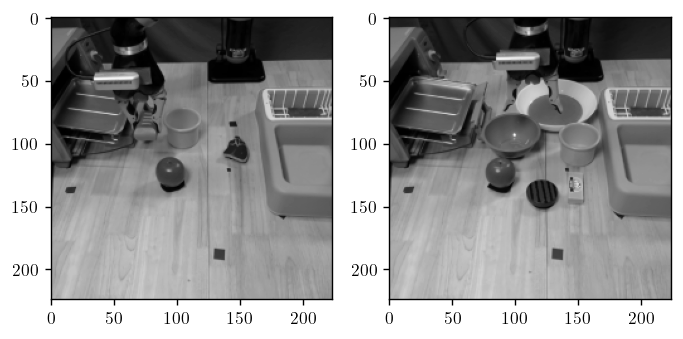

------ mount_cam_ob ------
The shape of the mount_cam_ob_train is: (25469, 224, 224)
The shape of the mount_cam_ob_val is: (2901, 224, 224)
The range of values is:  0.2988 250.4


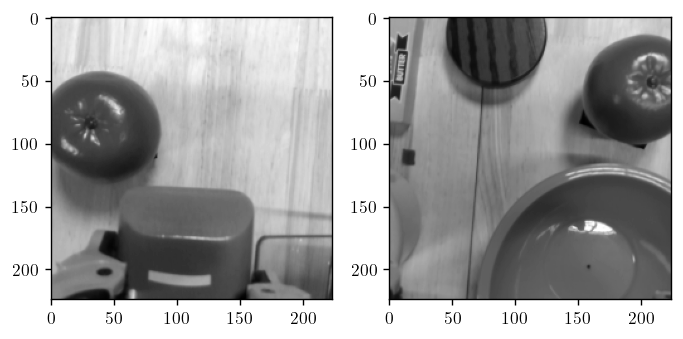

In [9]:
#A.For two sample observations in the training set, display the front_cam_ob and mount_cam_ob images.
print('------ front_cam_ob ------')
print('The shape of the front_cam_ob_train is:', front_cam_ob_train.shape)
print('The shape of the front_cam_ob_val is:', front_cam_ob_val.shape)
print('The range of values is: ', np.min(front_cam_ob_train), np.max(front_cam_ob_train))

#Display two sample images
fig, ax = plt.subplots(1,2)
ax[0].imshow(front_cam_ob_train[212], cmap=plt.get_cmap('gray'))
ax[1].imshow(front_cam_ob_train[324], cmap=plt.get_cmap('gray'))
plt.show()

#B. mount_cam_ob
print('------ mount_cam_ob ------')
print('The shape of the mount_cam_ob_train is:', mount_cam_ob_train.shape)
print('The shape of the mount_cam_ob_val is:', mount_cam_ob_val.shape)
print('The range of values is: ', np.min(front_cam_ob_train), np.max(front_cam_ob_train))

#Display two sample images
fig, ax = plt.subplots(1,2)
ax[0].imshow(mount_cam_ob_train[212], cmap=plt.get_cmap('gray'))
ax[1].imshow(mount_cam_ob_train[324], cmap=plt.get_cmap('gray'))
plt.show()


**Figure 1.** Two exemplary samples from the front_cam_ob (top) and mount_cam_ob (bottom) images in the training dataset, accompanied by the shapes of the training and testing datasets (all images are 224x224) and the pixel intensity ranges ([0.2988, 250.4]).

In [10]:
#B. Compute mean and standard deviation in the training set
front_cam_ob_train_array = front_cam_ob_train.astype(np.float32)
all_pixels = front_cam_ob_train_array.flatten()/255.0 #images are in the [0, 255] range
mean_front_cam_ob = np.mean(all_pixels)
std_front_cam_ob = np.std(all_pixels)
print(f"Mean front_cam_ob: {mean_front_cam_ob:.4f}, Std front_cam_ob: {std_front_cam_ob:.4f}")

mount_cam_ob_train_array = mount_cam_ob_train.astype(np.float32)
all_pixels = mount_cam_ob_train_array.flatten()/255.0
mean_mount_cam_ob = np.mean(all_pixels) 
std_mount_cam_ob = np.std(all_pixels)
print(f"Mean mount_cam_ob: {mean_mount_cam_ob:.4f}, Std mount_cam_ob: {std_mount_cam_ob:.4f}")

Mean front_cam_ob: 0.4506, Std front_cam_ob: 0.2188
Mean mount_cam_ob: 0.4943, Std mount_cam_ob: 0.1971


In [10]:
def visualize_distributions(data, figsize, save_stats=False, fontsize=15):
    #Function that allows the subplot visualization of the distributions of the data

    if save_stats:
        mean = []
        std = []

    if data.shape[1] > 3:
        #Create 2 different rows of plots
        n_rows = 2
        n_cols = data.shape[1] // 2
        if n_cols % 2 != 0:
            n_cols += 1
        
        fig, ax = plt.subplots(n_rows, n_cols, figsize=figsize)

        for i in range(data.shape[1]):
            row = i // n_cols
            col = i % n_cols

            mean_i = np.mean(data[:, i])
            std_i = np.std(data[:, i])
            if save_stats:
                mean.append(mean_i)
                std.append(std_i)
            sns.histplot(data[:, i], ax=ax[row, col], kde=True)
            ax[row, col].text(0.2, 0.8, f"Mean: {mean_i:.3f}\nStd: {std_i:.3f}", horizontalalignment='center', verticalalignment='center', transform=ax[row, col].transAxes, fontsize = fontsize)
            ax[row, col].set_title(f"Dimension {i}")

    else:
        fig, ax = plt.subplots(1, data.shape[1], figsize=figsize)
        
        for i in range(data.shape[1]):
            
            mean_i = np.mean(data[:, i])
            std_i = np.std(data[:, i])
            if save_stats:
                mean.append(mean_i)
                std.append(std_i)
            sns.histplot(data[:, i], ax=ax[i], kde=True)
            ax[i].text(0.2, 0.8, f"Mean: {mean_i:.3f}\nStd: {std_i:.3f}", horizontalalignment='center', verticalalignment='center', transform=ax[i].transAxes, fontsize = fontsize)
            ax[i].set_title(f"Dimension {i}")
        plt.show()

    if save_stats:
        return np.array(mean), np.array(std)


-- ee_cartesian_pos_ob --


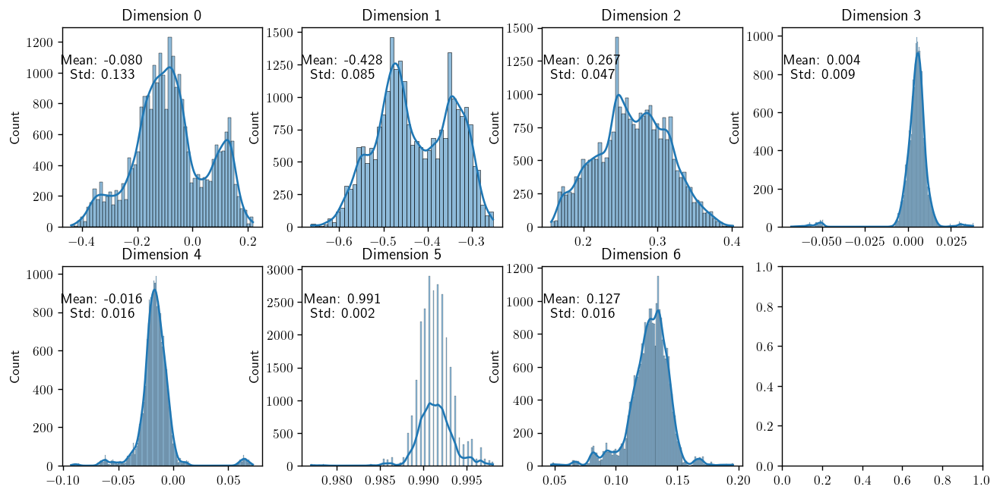

In [11]:
#C. Position, velocity and joint position observations
ee_cartesian_pos_ob_train = train_nps["ee_cartesian_pos_ob"]
ee_cartesian_vel_ob_train = train_nps["ee_cartesian_vel_ob"]
joint_pos_ob_train = train_nps["joint_pos_ob"]

#For each feature, plot the distribution of each dimension
#C.1. ee_cartesian_pos_ob; 7D
print('-- ee_cartesian_pos_ob --')
mean_cartesian_pos_ob, std_cartesian_pos_ob = visualize_distributions(ee_cartesian_pos_ob_train, (12.5, 6), save_stats=True, fontsize=11)
min_cartesian_pos_ob = np.min(ee_cartesian_pos_ob_train, axis=0)    
max_cartesian_pos_ob = np.max(ee_cartesian_pos_ob_train, axis=0)

**Figure 2.** Histogram of the different dimensions for the `ee_cartesian_pos_ob` variables, with the kernel density estimations (KDE) plot on top. Mean and standard deviation for each feature is shown in each histogram.

-- ee_cartesian_vel_ob --


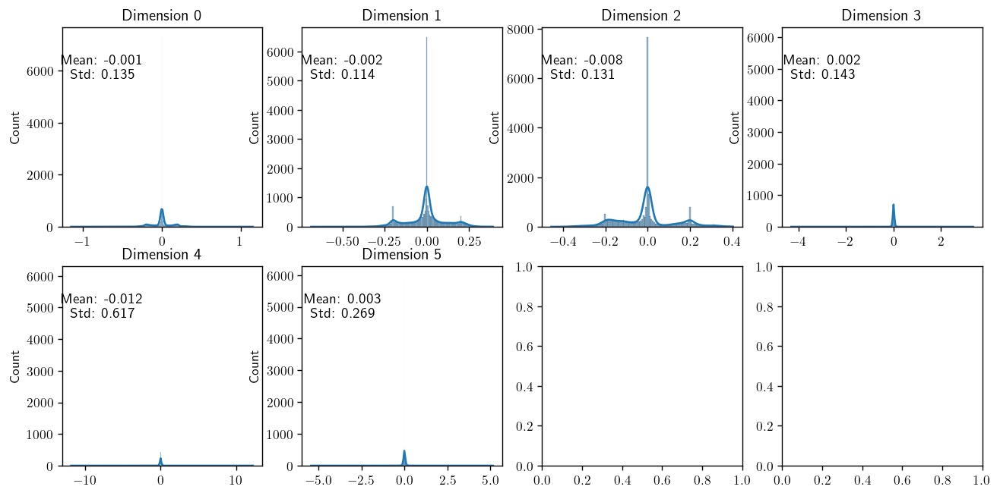

In [12]:
#C.2. ee_cartesian_vel_ob; 6D
print('-- ee_cartesian_vel_ob --')
mean_cartesian_vel_ob, std_cartesian_vel_ob = visualize_distributions(ee_cartesian_vel_ob_train, (12.5, 6), save_stats=True, fontsize=11)
min_cartesian_vel_ob = np.min(ee_cartesian_vel_ob_train, axis=0)
max_cartesian_vel_ob = np.max(ee_cartesian_vel_ob_train, axis=0)

**Figure 3.** Histogram of the different dimensions for the `ee_cartesian_vel_ob` variable, with the kernel density estimations (KDE) plot on top. Mean and standard deviation for each feature is shown in each histogram.

-- joint_pos_ob --


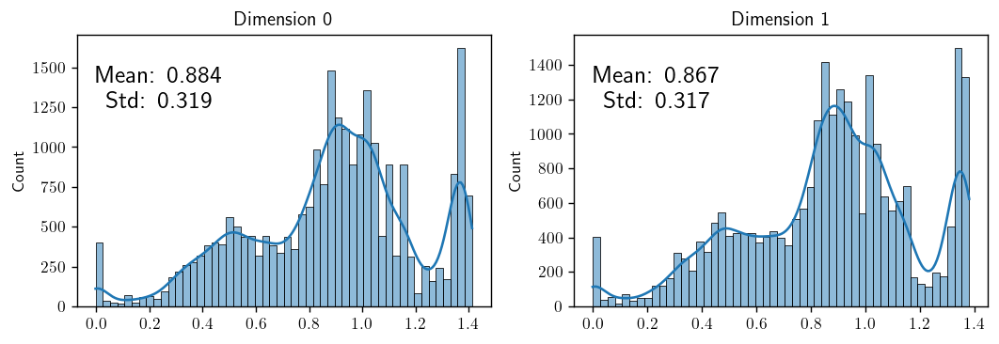

In [13]:
#C.3. joint_pos_ob; 2D
print('-- joint_pos_ob --')
mean_joint_pos_ob, std_joint_pos_ob = visualize_distributions(joint_pos_ob_train, (10, 3), save_stats=True)
min_joint_pos_ob = np.min(joint_pos_ob_train, axis=0)
max_joint_pos_ob = np.max(joint_pos_ob_train, axis=0)

**Figure 4.** Histogram of the different dimensions for the `joint_pos_ob` variables, with the kernel density estimations (KDE) plot on top. Mean and standard deviation for each feature is shown in each histogram.

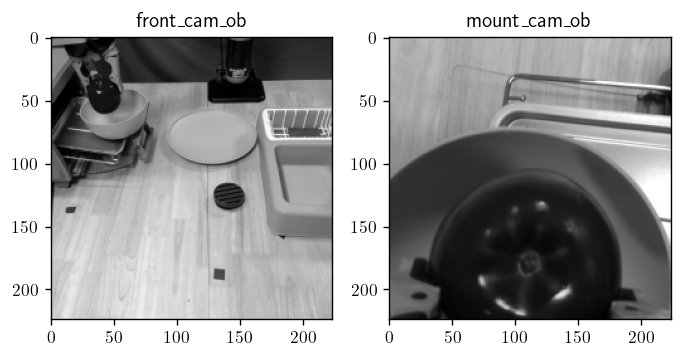

The Cartesian deltas are: [ 0.  0. -0.]
The gripper action is: 0.0


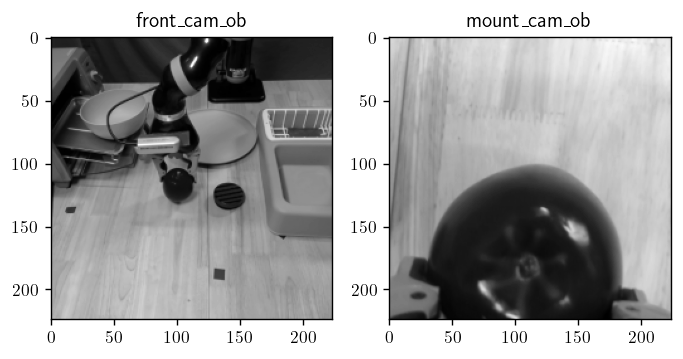

The Cartesian deltas are: [-0.2      0.11755  0.1371 ]
The gripper action is: 1.0


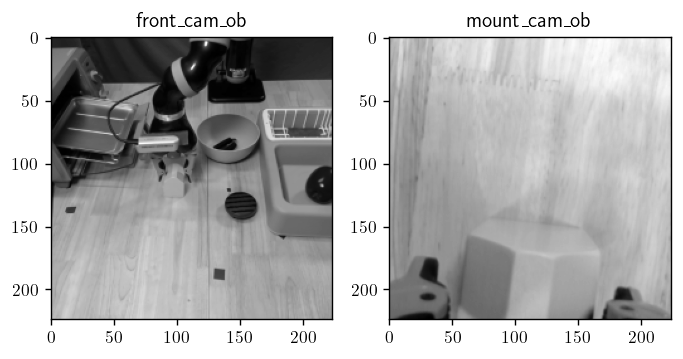

The Cartesian deltas are: [ 0.  0. -0.]
The gripper action is: 2.0


In [14]:
#D. Actions: For each image, actions[0:3] are cartesian deltas and 4th element is the gripper action {0, 1, 2}
#Here we first show an image corresponding to each action 
actions_train = train_nps["actions"]

#Action = 0
fig, axs = plt.subplots(1, 2)
index_0 = np.where(actions_train[:, 3] == 0)[0][0]
axs[0].imshow(front_cam_ob_train[index_0], cmap = plt.get_cmap('gray'))
axs[0].set_title('front_cam_ob')
axs[1].imshow(mount_cam_ob_train[index_0], cmap = plt.get_cmap('gray'))
axs[1].set_title('mount_cam_ob')
plt.show()

print('The Cartesian deltas are:', actions_train[index_0][:3])
print('The gripper action is:', actions_train[index_0][3])

#Action = 1
fig, axs = plt.subplots(1, 2)
index_1 = np.where(actions_train[:, 3] == 1)[0][0]
axs[0].imshow(front_cam_ob_train[index_1], cmap = plt.get_cmap('gray'))
axs[0].set_title('front_cam_ob')    
axs[1].imshow(mount_cam_ob_train[index_1], cmap = plt.get_cmap('gray'))
axs[1].set_title('mount_cam_ob')
plt.show()

print('The Cartesian deltas are:', actions_train[index_1][:3])
print('The gripper action is:', actions_train[index_1][3])

#Action = 2
fig, axs = plt.subplots(1, 2)
index_2 = np.where(actions_train[:, 3] == 2)[0][0]  
axs[0].imshow(front_cam_ob_train[index_2], cmap = plt.get_cmap('gray'))
axs[0].set_title('front_cam_ob')
axs[1].imshow(mount_cam_ob_train[index_2], cmap = plt.get_cmap('gray'))
axs[1].set_title('mount_cam_ob')
plt.show()

print('The Cartesian deltas are:', actions_train[index_2][:3])
print('The gripper action is:', actions_train[index_2][3])

**Figure 5.** Images from front_cam_ob and mount_cam_ob for samples corresponding to each of the possible actions (0, top; 1, middle; 2, bottom). After examination (data not shown), each sequence of opening/closing the gripper was found to have between 10 to 25 frames. When the gripper is on position, the Cartesian deltas are set to 0. Before that, slight movements are needed to adjust its picking-up/dropping motion.

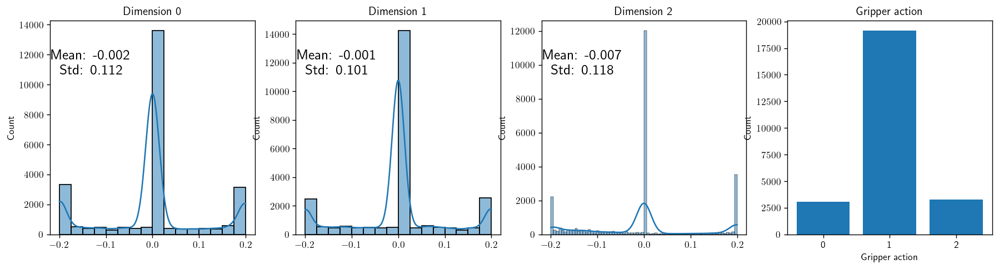

In [15]:
#Show distribution of actions 
fig, ax = plt.subplots(1, 4, figsize=(17.5, 4))
for i in range(4):
    if i < 3:
        sns.histplot(actions_train[:, i], ax=ax[i], kde=True)
        ax[i].set_title(f"Dimension {i}")
        ax[i].text(0.2, 0.8, f"Mean: {np.mean(actions_train[:, i]):.3f}\nStd: {np.std(actions_train[:, i]):.3f}", horizontalalignment='center', verticalalignment='center', transform=ax[i].transAxes, fontsize = 15)
    
    else:
        #bar chart for the actions
        value_counts = np.unique(actions_train[:, i], return_counts=True)
        ax[i].bar(value_counts[0], value_counts[1])
        ax[i].set_title(f"Gripper action")
        ax[i].set_xticks(value_counts[0])
        ax[i].set_xticklabels(['0', '1', '2'])
        ax[i].set_xlabel('Gripper action')
        ax[i].set_ylabel('Count')
plt.show()

**Figure 6.** Histogram and kernel density estimations of each gripper movement (first three plots), and bar chart of the possible actions (left-most). Most of the defined movements are found either at 0 or at the extremes ${-0.2, 0.2}. Action 1 (do not move) is the most predominant one in the training dataset.

-- ee_cartesian_pos_ob --


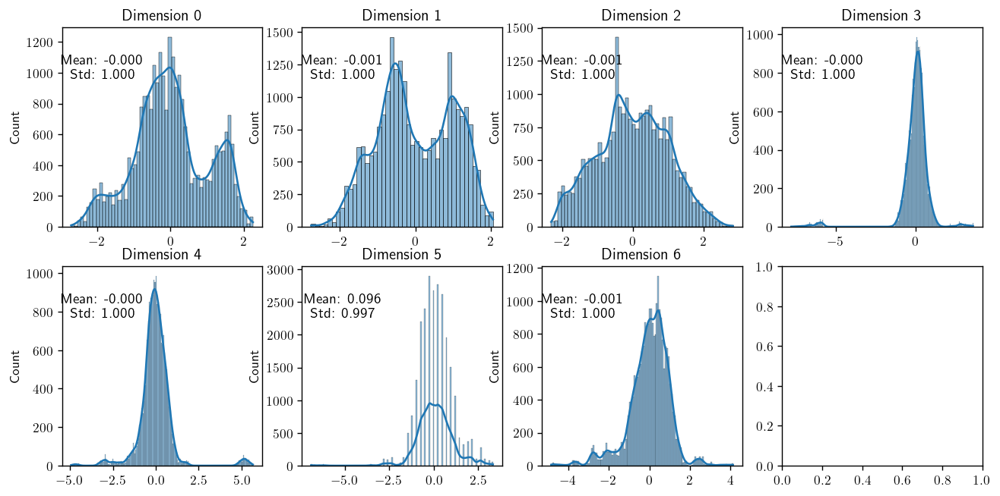

In [16]:
#E. Distributions after transformations
#E.1 Show new distributions of ee_cartesian_pos_ob
print('-- ee_cartesian_pos_ob --')
ee_cartesian_pos_ob_train_copy = copy.deepcopy(ee_cartesian_pos_ob_train)
ee_cartesian_pos_ob_train_copy = (ee_cartesian_pos_ob_train_copy - mean_cartesian_pos_ob) / std_cartesian_pos_ob
visualize_distributions(ee_cartesian_pos_ob_train_copy, (12.5, 6), save_stats=False, fontsize=11)

**Figure 7.** After standardization, histogram of the different dimensions for the `ee_cartesian_pos_ob` variables, with the kernel density estimations (KDE) plot on top. Mean and standard deviation for each feature is shown in each histogram. Both were correctly set to 0 and 1, respectively.

-- ee_cartesian_vel_ob --


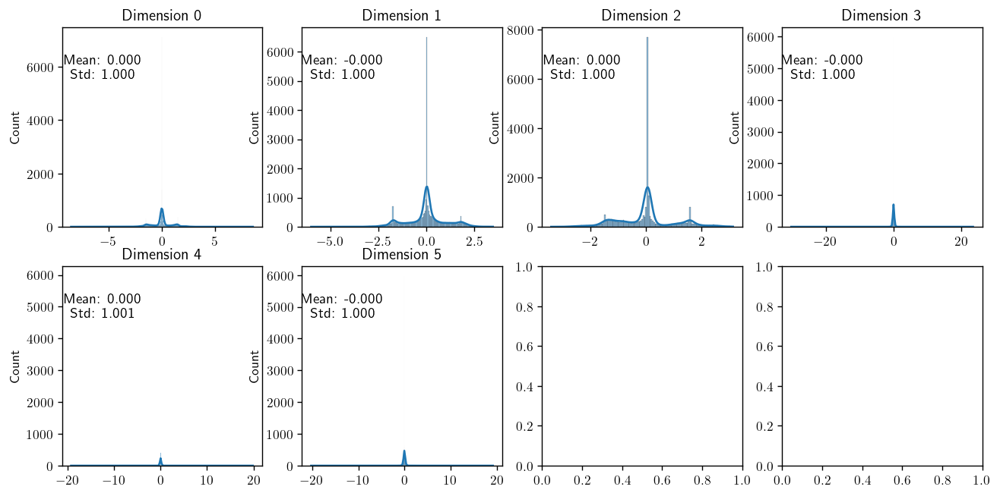

In [17]:
#E.2 Show new distributions of ee_cartesian_vel_ob
print('-- ee_cartesian_vel_ob --')
ee_cartesian_vel_ob_train_copy = copy.deepcopy(ee_cartesian_vel_ob_train)
ee_cartesian_vel_ob_train_copy = (ee_cartesian_vel_ob_train_copy - mean_cartesian_vel_ob) / std_cartesian_vel_ob
visualize_distributions(ee_cartesian_vel_ob_train_copy, (12.5, 6), save_stats=False, fontsize=11)

**Figure 8.** After standardization, histogram of the different dimensions for the `ee_cartesian_vel_ob` variable, with the kernel density estimations (KDE) plot on top. Mean and standard deviation for each feature is shown in each histogram. Both were correctly set to 0 and 1, respectively.

-- joint_pos_ob --


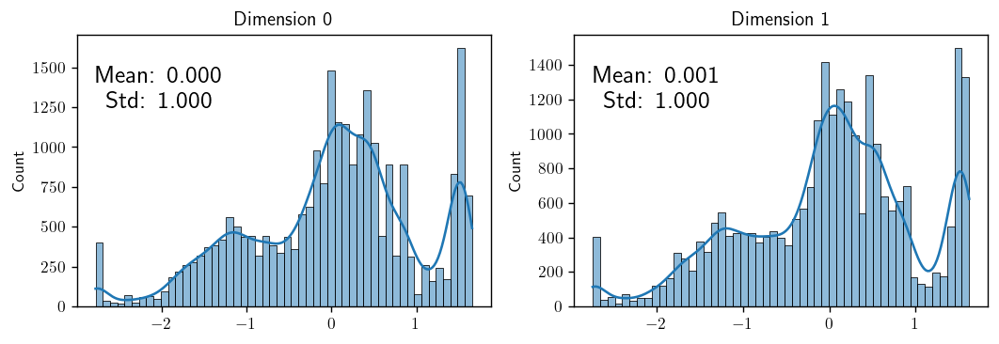

In [18]:
#E.3 Show new distributions of joint_pos_ob
print('-- joint_pos_ob --')
joint_pos_ob_train_copy = copy.deepcopy(joint_pos_ob_train)
joint_pos_ob_train_copy = (joint_pos_ob_train_copy - mean_joint_pos_ob) / std_joint_pos_ob
visualize_distributions(joint_pos_ob_train_copy, (10, 3))

**Figure 9.** After standardization, histogram of the different dimensions for the `joint_pos_ob` variables, with the kernel density estimations (KDE) plot on top. Mean and standard deviation for each feature is shown in each histogram. Both were correctly set to 0 and 1, respectively.

In [19]:
def image_transform(mean, std):
    #Function to transform images in the CLVR Jaco Dataset
    #Inputs: mean and std of the images
    #Outputs: transformation object:
        #A. Add channel dimension
        #B. Convert to tensor and normalize
        #C. Standardize
    return transforms.Compose([
        lambda x : np.expand_dims(x, 2),
        lambda x: np.transpose(x, (2, 0, 1)),
        lambda x: torch.tensor(x)/255.0,
        lambda x: (x - mean) / std
        ])

global_transforms = {
    #Add channel dimension, normalize and standardize
    "front_cam_ob": image_transform(0.4506, 0.2188),
    "mount_cam_ob": image_transform(0.4943, 0.1971),
    
    #No transformation for actions
    "actions": lambda x: torch.tensor(x),

    #Standardize across every dimension
    "ee_cartesian_pos_ob": lambda x: torch.tensor((x - mean_cartesian_pos_ob) / std_cartesian_pos_ob),
    "ee_cartesian_vel_ob": lambda x: torch.tensor((x - mean_cartesian_vel_ob) / std_cartesian_vel_ob),
    "joint_pos_ob": lambda x: torch.tensor((x - mean_joint_pos_ob) / std_joint_pos_ob)     
}

#### Question 1.a.ii Justification (5 marks)
##### Task
- In the markdown cell below, justify your decisions for preprocessing including where you have decided __not__ to apply preprocessing. You should include empirical evidence from your EDA analysis to support your decisions. Justfication __without__ evidence will be rewarded 0 marks.

_front_cam_ob_ & _mount_cam_ob_:

-   Images are provided with a single channel (greyscale) in batches of size equal to the training/test subset sizes. Single image sizes are $\text{(H, W)} = (224, 224)$. This size is adequate for the upcoming end-to-end training. 
-   The `ToTensor` transform normalizes the pixel intensity values from $[0, 255]$ to $[0, 1]$. This function takes an np.array of shape $(H, W, C)$ and outputs a $(C, H, W)$ tensor, so a third dimension must be added to the original vectors.
-   Finally, the input data to deep neural networks is generally pre-processed to have a 0 mean ($\mu$) and unit standard deviation ($\sigma$) to avoid biases updates and saturation [[1]](http://vision.stanford.edu/cs598_spring07/papers/Lecun98.pdf), and to ensure weights learn at the same rate (avoid exploding/vanishing gradients) [[2]](https://udlbook.github.io/udlbook/), respectively. This is done by standardizing  all the images according to the training set's mean and standard deviation - $x \leftarrow \frac{x - \mu}{\sigma}$ -, thus avoiding data leakage from the test set. The former have been computed in the EDA above, and will be used in the upcoming data transformations.

_ee_cartesian_pos_ob_, _ee_cartesian_vel_ob_m, _joint_pos_ob_: 

- These variables are multi-dimensional each (7D, 6D, and 2D; respectively). Therefore, each dimension will be interpreted by a subsequent DL model as a different feature. As explained above, it is advisable to standardize the features which are input to deep neural networks. For that reason, standardization will be performed across all dimensions for all features. From the EDA (Figs. 2-4), it was observed that the cartesian velocities were distributed around 0, while that was not the case for the other predictors. Moreover, standard deviations were generally low for all features except for the _joint_pos_ob_ ones. Therefore, standardization will widen the distributions (Figs. 7-9), which is likely to allow the model to better distinguish inputs from each other while maintaining their internal relationships. These values are computed on the training set and stored in convenient `np.arrays` for further application.

_actions_: While scaling the features affects the training procedure, scaling the target (here referring to the Cartesian deltas) is not useful as it doesn't affect the shape of the mapping from $\mathcal{X}$ to $\mathcal{Y}$. Moreover, the gripper action does not need to be changed, as each of the possible values (0, 1, 2) will correspond to a class to be predicted by the model.


### Question 1.b End-to-end supervised model evaluation
The code below defines an end to end supervised model which: 
- Jointly encodes the two images ("front_cam_ob", "mount_cam_ob") using a CNN architecture (image_encoder);
- Seperately encoding the positional and velocity observations using an MLP;
- Combines the two embeddings by adding them together and;
- Passes the combined embedding into a final MLP layer (dense)
  
This question requires you to define sutable loss functions for the model and then evaluate the performance.

In [20]:
cnn2_config = ConvolutionLayersConfig(
   # 2x224x224 --> 8x112x112 --> 16x56x56 --> 32x28x28 
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=8,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=8,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
        ]
    )

_cnn_output_dim = cnn2_config.get_output_dims() #28x28
_cnn_output_channels = cnn2_config.get_output_channels() #32
_mlp_input_dim = int(
            (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1] #28x28x32
            )


image_encoder = JointCNNEncoder(
   #Takes in the encoded images (28x28x32) and outputs a 128D vector
    cnn=CNN(cnn2_config),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[256],
        output_dim=128
        )
)

obs_encoder = MLP(
   #Takes in the 15D observations from ee_cartesian_pos_ob, ee_cartesian_vel_ob and joint_pos_ob and outputs a 128D vector
    input_dim = 15,
    hidden_dims = [256,256],
    output_dim = 128
)

dense = MLP(
   #Takes in the sum of the encoded images and observations and outputs a 6D vector
    input_dim = 128,
    hidden_dims = [64,32],
    output_dim = 6
)

class Baseline1(BaseModel):

  def __init__(
      self,
      image_encoder:JointCNNEncoder,
      obs_encoder:MLP,
      dense:MLP
      ) -> None:
      super().__init__()
      self.image_encoder = image_encoder
      self.obs_encoder = obs_encoder
      self.dense = dense

  def forward(self, images, obs):
    _img_enc = self.image_encoder(images)
    _obs_enc = self.obs_encoder(obs)
    _dense_enc = self.dense(_img_enc+_obs_enc) #why are they summed and not concatenated?
    pos = _dense_enc[:,0:3] #first 3 elements which correspond to cartesian deltas
    grp = _dense_enc[:,3:] #last 3 elements which correspond to gripper actions class probabilities
    return {
        "pos": pos,
        "grp":grp
        } #dictionary with the outputs
  
  def reset(
      self,
      image_encoder_kwargs,
      obs_encoder_kwargs,
      dense_kwargs
      ):
    #Generates new weights for the model through xavier_uniform initialization
    self.image_encoder.reset(**image_encoder_kwargs)
    self.obs_encoder.reset(**obs_encoder_kwargs)
    self.dense.reset(**dense_kwargs)

#Instantiate the model
torch.manual_seed(1)
model = Baseline1(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    dense=dense
)

#### Question 1.b.i Loss definitions (3 marks)
For the model defined above, the proposed loss function is defined where the contribution of "pos_criterion" and "grp_criterion" are equally weighted and the mean of the two values loss are used to define the final loss. Furthermore, the loss for the positional actions is the MSE and the loss for grp_criterion is the CrossEntropyLoss.

##### Task:
- Justify why this composite loss function is reasonable. You should make reference to the range of values predicted by the deep learning model.

The target variable is composed of two different types of features. 

-   The Cartesian coordinates (positions 1 to 3 in the target) are continuous numerical features which are trying to be predicted by the final dense linear layer of the model in a _regression_ fashion. Therefore, an adequate loss function should measure the distance between the actual ($y_{0:3}$) and predicted ($\hat{y}_{0:3}$) movements. The mean squared error (MSE),

$$ \text{MSE} = \frac{1}{N} \sum _i (y_{0:3, i} - \hat{y}_{0:3, i})^2; $$

is an adequate and common convex function feasible to minimize the discrepancy between both. 

-   The gripper action (position 4) is a categorical nominal variable with three possible values (0, 1, 2), that is, predicting the correct gripper action is a _classification_ problem. Each value can be interpreted as a _class_ each observation belongs to. The cross entropy (CE) loss is an information-based measure of the difference between two probability distributions for a random variable. It is defined as:

$$ H(p, q) = - \sum _i p_ilog(q_i);$$

where $p_i$ corresponds to the true distribution (i.e. the true labels) and $q_i$ corresponds to the predicted probabilities output by the model through the softmax function. In binary classification ($y \in \{0, 1\}$), it is easy to see that CE is equal to:

$$ H(p,q) = -ylog\hat{y} - (1-y)log(1- \hat{y});$$

which is 0 if the label was 1 and the predicted probability was 1, or if the label was 0 and the predicted probability was 0. For multi-class classification, this concept is straigthforward expandable. This loss is much more appropriate than using MSE, as observed in the plot below [[3]](https://en.wikipedia.org/wiki/Cross-entropy), as the loss is increasingly larger as the predicted probability and true label increasingly differ:

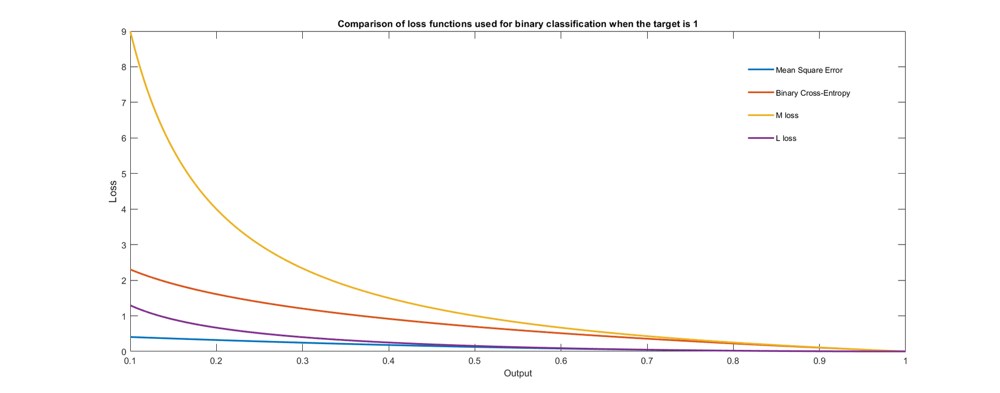

**Figure 10**. Comparison of different loss functions (here outputs are restricted to [0, 1]). Of interest here are the cross-entropy (orange) and MSE losses (blue). Extracted from [[3]](https://en.wikipedia.org/wiki/Cross-entropy).

In [21]:
pos_criterion = nn.MSELoss(reduction="mean")
grp_criterion = nn.CrossEntropyLoss(reduction="mean")

In [22]:
def collate_func(input_list:List[DatasetOutput])->DatasetOutput:
    pos = []
    _grp = []
    images = []
    obs = []
    for val in input_list:
        images.append(
            torch.concat(
                [val.input["front_cam_ob"], val.input["mount_cam_ob"]],
                dim=0
            )[None,:]
            )
        obs.append(
            torch.concat(
                [
                    val.input["ee_cartesian_pos_ob"],
                    val.input["ee_cartesian_vel_ob"],
                    val.input["joint_pos_ob"]
                    ],
                dim=0
            )[None,:]
        )
        pos.append(val.output["actions"][0:3][None,:])
        _grp.append(val.output["actions"][-1:][None])
    _grp = torch.concat(_grp, dim=0)
    grp = torch.zeros(_grp.shape[0],3)
    grp[torch.arange(len(grp)), _grp.squeeze().int()] = 1

    return DatasetOutput(
        input = {
            "images":torch.concat(images,dim=0),
            "obs":torch.concat(obs,dim=0),
            },
        output = {
            "pos":torch.concat(pos, dim=0),
            "grp":grp
            }
    )

In [23]:
def prepare_data_for_training(model, exp_kwargs, grp_criterion, remove_dimensions=[], test=False, test_nps=None):

    torch.manual_seed(1)
    model.reset({},{},{})

    if project_options.debug:
        exp_kwargs["batch_size"] = 4

     #Remove unwanted features from the train_dataset and val_dataset if any are specified
    #An example could be to remove ee_cartesian_pos_ob_3. Then, we would need to access the ee_cartesian_pos_ob key and remove the 3rd dimension
    train_nps_copy = copy.deepcopy(train_nps)  
    val_nps_copy = copy.deepcopy(val_nps)
    if test:
        test_nps_copy = copy.deepcopy(test_nps)
    global_transforms_copy = copy.deepcopy(global_transforms)
    mean_cartesian_pos_ob_copy = copy.deepcopy(mean_cartesian_pos_ob)
    std_cartesian_pos_ob_copy = copy.deepcopy(std_cartesian_pos_ob)
    mean_cartesian_vel_ob_copy = copy.deepcopy(mean_cartesian_vel_ob)
    std_cartesian_vel_ob_copy = copy.deepcopy(std_cartesian_vel_ob)

    if remove_dimensions != []:
        
        for i, feature in enumerate(remove_dimensions):
            splits = feature.split('_')
            dimension = int(splits[-1]) - 1 #0-indexed
            feature = '_'.join(splits[:-1])

            if feature in train_nps.keys():
                train_nps_copy[feature] = np.delete(train_nps_copy[feature], dimension, axis=1)
                val_nps_copy[feature] = np.delete(val_nps_copy[feature], dimension, axis=1)
                
                if feature == "ee_cartesian_pos_ob":
                    mean_cartesian_pos_ob_copy = np.delete(mean_cartesian_pos_ob_copy, dimension)
                    std_cartesian_pos_ob_copy = np.delete(std_cartesian_pos_ob_copy, dimension)
                    global_transforms_copy[feature] = lambda x: torch.tensor((x - mean_cartesian_pos_ob_copy) / std_cartesian_pos_ob_copy)
                
                elif feature == "ee_cartesian_vel_ob":
                    mean_cartesian_vel_ob_copy = np.delete(mean_cartesian_vel_ob_copy, dimension)
                    std_cartesian_vel_ob_copy = np.delete(std_cartesian_vel_ob_copy, dimension)
                    global_transforms_copy[feature] = lambda x: torch.tensor((x - mean_cartesian_vel_ob_copy) / std_cartesian_vel_ob_copy)
            
            else:
                raise ValueError(f"Feature {feature} not found in the dataset")
    
        print(train_nps_copy[feature].shape)

    if exp_kwargs["half_precision"]:
        train_dataset = NpDictDataset(
            array_dict=train_nps_copy,
            transform_lkp = global_transforms_copy,
            dep_vars = ["actions"],
            indep_vars = [
                "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                "ee_cartesian_vel_ob", "joint_pos_ob"
                ],
            target_offset=exp_kwargs["target_offset"]
            )

        val_dataset = NpDictDataset(
            array_dict=val_nps_copy,
            transform_lkp = global_transforms_copy,
            dep_vars = ["actions"],
            indep_vars = [
                "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                "ee_cartesian_vel_ob", "joint_pos_ob"
                ],
            target_offset=exp_kwargs["target_offset"]
            )
        
        if test:
            test_dataset = NpDictDataset(
                array_dict=test_nps_copy,
                transform_lkp = global_transforms_copy,
                dep_vars = ["actions"],
                indep_vars = [
                    "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                    "ee_cartesian_vel_ob", "joint_pos_ob"
                    ],
                target_offset=exp_kwargs["target_offset"]
                )

    else:
        train_dataset = NpDictDataset(
            array_dict={k:train_nps_copy[k].astype(np.float32) for k in train_nps},
            transform_lkp = global_transforms_copy,
            dep_vars = ["actions"],
            indep_vars = [
                "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                "ee_cartesian_vel_ob", "joint_pos_ob"
                ],
            target_offset=exp_kwargs["target_offset"]
            )

        val_dataset = NpDictDataset(
            array_dict={k:val_nps_copy[k].astype(np.float32) for k in val_nps},
            transform_lkp = global_transforms_copy,
            dep_vars = ["actions"],
            indep_vars = [
                "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                "ee_cartesian_vel_ob", "joint_pos_ob"
                ],
            target_offset=exp_kwargs["target_offset"]
            )
        
        if test:
            test_dataset = NpDictDataset(
                array_dict={k:test_nps_copy[k].astype(np.float32) for k in test_nps},
                transform_lkp = global_transforms_copy,
                dep_vars = ["actions"],
                indep_vars = [
                    "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                    "ee_cartesian_vel_ob", "joint_pos_ob"
                    ],
                target_offset=exp_kwargs["target_offset"]
                )

    print(len(train_dataset))
    out = train_dataset[0]

    train_dataloader = DataLoader(
        train_dataset,
        batch_size=exp_kwargs["batch_size"],
        shuffle=True,
        collate_fn=collate_func,
        generator=torch.Generator().manual_seed(0)
    )
    val_dataloader = DataLoader(
        val_dataset,
        batch_size=exp_kwargs["batch_size"],
        shuffle=False,
        collate_fn=collate_func,
        generator=torch.Generator().manual_seed(0)
    )

    if test:
        test_dataloader = DataLoader(
            test_dataset,
            batch_size=exp_kwargs["batch_size"],
            shuffle=False,
            collate_fn=collate_func,
            generator=torch.Generator().manual_seed(0)
        )

    first_batch = next(train_dataloader.__iter__())

    input_dim = first_batch.input["images"].shape
    print(input_dim)
    input_dim = first_batch.input["obs"].shape
    print(input_dim)
    pos_dim = first_batch.output["pos"].shape
    print(pos_dim)
    grp_dim = first_batch.output["grp"].shape
    print(grp_dim)

    exp_kwargs["model_def"] = model.__repr__()


    if exp_kwargs["half_precision"]:
        model = model.half()
    optimizer = torch.optim.Adam(
        model.parameters(), lr=exp_kwargs["learning_rate"],
        eps=1e-04, weight_decay=exp_kwargs["weight_decay"]
        )
    
    if exp_kwargs["scheduler"]: 
        scheduler = torch.optim.lr_scheduler.MultiStepLR(
            optimizer, milestones=exp_kwargs["milestones"], gamma=exp_kwargs["gamma"]
            )

    else:
        scheduler = None

    __criterion = TrackerBalancedLoss(
        loss_lkp={
            "pos":pos_criterion,
            "grp": grp_criterion
        }
        )

    if not MAC: #device is cuda
        if exp_kwargs["half_precision"]:
            with torch.no_grad():
                if torch.cuda.is_available():
                    model = model.cuda()
                    with torch.autocast(device_type="cuda"):
                        res = model(
                            images=first_batch.input["images"].cuda(),
                            obs=first_batch.input["obs"].cuda()
                            )
                        first_batch.output["pos"] = first_batch.output["pos"].cuda()
                        first_batch.output["grp"] = first_batch.output["grp"].cuda()
                else:
                    with torch.autocast(device_type="cpu"):
                        res = model(
                            images=first_batch.input["images"],
                            obs=first_batch.input["obs"]
                            )
        else:
            with torch.no_grad():
                if torch.cuda.is_available():
                    model = model.cuda()
                    res = model(
                        images=first_batch.input["images"].cuda(),
                        obs=first_batch.input["obs"].cuda()
                        )
                    first_batch.output["pos"] = first_batch.output["pos"].cuda()
                    first_batch.output["grp"] = first_batch.output["grp"].cuda()
                else:
                    res = model(
                        images=first_batch.input["images"],
                        obs=first_batch.input["obs"]
                        )
        print(__criterion(res,first_batch.output))

    else: #device is mps, then instead of  torch.cuda.is_available() we use torch.backends.mps.is_available() and then device = torch.device("mps")
        if exp_kwargs["half_precision"]:
            with torch.no_grad():
                if torch.backends.mps.is_available():
                    model = model.to("mps")
                    with torch.autocast(device_type="mps"):
                        res = model(
                            images=first_batch.input["images"].to("mps"),
                            obs=first_batch.input["obs"].to("mps")
                            )
                        first_batch.output["pos"] = first_batch.output["pos"].to("mps")
                        first_batch.output["grp"] = first_batch.output["grp"].to("mps")
                else:
                    with torch.autocast(device_type="cpu"):
                        res = model(
                            images=first_batch.input["images"],
                            obs=first_batch.input["obs"]
                            )
                        
        else:
            with torch.no_grad():
                if torch.backends.mps.is_available():
                    model = model.to("mps")
                    res = model(
                        images=first_batch.input["images"].to("mps"),
                        obs=first_batch.input["obs"].to("mps")
                        )
                    first_batch.output["pos"] = first_batch.output["pos"].to("mps")
                    first_batch.output["grp"] = first_batch.output["grp"].to("mps")
                else:
                    res = model(
                        images=first_batch.input["images"],
                        obs=first_batch.input["obs"]
                        )
        print(__criterion(res,first_batch.output))
    
    mo = WandBMetricOrchestrator()

    train_criterion = TrackerBalancedLoss(
        loss_lkp={
            "pos":copy.deepcopy(pos_criterion),
            "grp":copy.deepcopy(grp_criterion)
        },
        name="train",
        mo=mo
        )

    val_criterion = TrackerBalancedLoss(
        loss_lkp={
            "pos":copy.deepcopy(pos_criterion),
            "grp":copy.deepcopy(grp_criterion)
        },
        name="val",
        mo=mo
        )
    
    if test:
        test_criterion = TrackerBalancedLoss(
            loss_lkp={
                "pos":copy.deepcopy(pos_criterion),
                "grp":copy.deepcopy(grp_criterion)
            },
            name="test",
            mo=mo
            )

    sl_trainer = TorchTrainingLoop(
        model=model, gpu=True, optimizer=optimizer, criterion=train_criterion,
        val_criterion=val_criterion, epochs=exp_kwargs["epochs"], logger=logger, scheduler=scheduler,
        mo=WandBMetricOrchestrator(), half_precision=exp_kwargs["half_precision"],
        mac = MAC,
        preds_save_type=None
    )

    if test:
        return train_dataloader, val_dataloader, test_dataloader, model, optimizer, __criterion, sl_trainer, train_criterion, val_criterion, test_criterion, mo
    else:
        return train_dataloader, val_dataloader, model, optimizer, __criterion, sl_trainer, train_criterion, val_criterion, mo


In [47]:
exp_kwargs = {
        "batch_size": 64,
        "learning_rate": 0.001,
        "half_precision": False,
        "target_offset": 0,
        "epochs": 50,
        "weight_decay": 0,
        "scheduler": False,
    }
train_dataloader, val_dataloader, model, optimizer, __criterion, sl_trainer, train_criterion, val_criterion, mo = prepare_data_for_training(model, exp_kwargs=exp_kwargs, grp_criterion=grp_criterion)

25469
torch.Size([64, 2, 224, 224])
torch.Size([64, 15])
torch.Size([64, 3])
torch.Size([64, 3])
tensor(1.9633, device='mps:0')


In [48]:
run_new_eval = False

wandb_name="End_to_end_1"
wandb_grp="End_to_end_New"

if project_options.debug:
    wandb_name = f"{wandb_name}_DEBUG"

In [49]:
if run_new_eval:
    orig = datetime.datetime.now()
    mo, train_losses, val_losses, wandb_run_dir = sl_trainer.training_loop(
        train_loader=train_dataloader,
        val_loader=val_dataloader,
        wandb_proj=WANDB_PROJECT,
        wandb_grp=wandb_grp,
        wandb_config=exp_kwargs,
        wandb_name=wandb_name,
        reset_kwargs={
            "image_encoder_kwargs": {},
            "obs_encoder_kwargs": {},
            "dense_kwargs": {}
        }
        )
    post_train = datetime.datetime.now()

#### Question 1.b.ii Model evaluation (marks broken down in sub questions)
This question requires you to evaluate the perfomance of the model defined above by interpreting model training/validation metrics and investigating the specific failure modes of the model. Run the cells above which will train the model for 10 epochs. 

**IMPORTANT, for questions (1.b.ii.i, 1.b.ii.ii, 1.b.ii.ii)** 
- You are **not** expected to train a baseline model and you will be awarded **0 marks** for training such a model and evaluating performance against it. 
- Furthermore, when interpretting the metric(s) and justifying your conclusions, you will loose marks for failing to comment on striking results that are obvious to the marker.
- **Incorrect interpretations of metrics** will be **negatively penalised**
- Finally, where you have been asked for empirical evidence, but provide none, you will be awarded __0 marks__.

#### Question 1.b.ii.i Epoch selection (3 marks)
##### Task
- Select an appropriate epoch using a suitable method, provide __empirical evidence__ for your choice.

Epoch selection refers to choosing the epoch at which the model performs best - best performance is always in terms of the validation loss-, and evaluating it at that training point. Epoch selection is usually performed due to overfitting, i.e., the model memorizes the training data and decreases the empirical risk, while increasing the validation/test risk. _Early stopping_ is a technique designed to avoid such a problem, where the training and validation loss curves are observed, and the sweet spot is found at the epoch right before the validation loss starts increasing with respect to the training loss (Fig. 7 [[4]](https://typefully.com/svpino/early-stopping-nuPSUzo)):

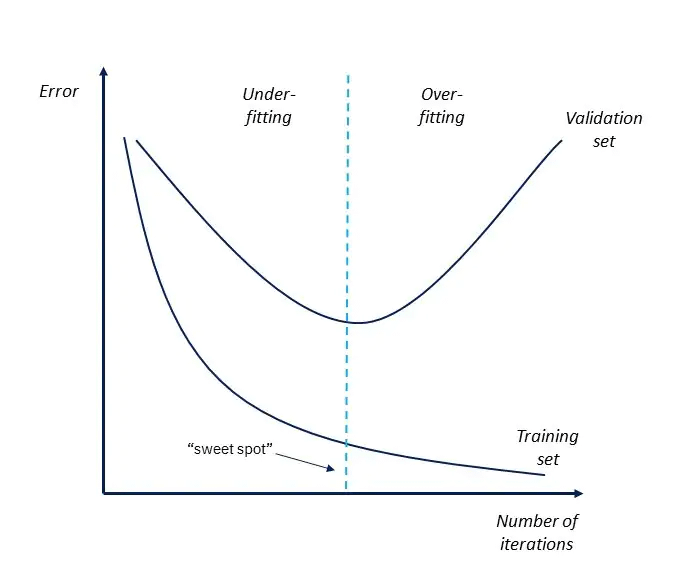

**Figure 11.** Exemplary visualization of overfitting.

In the cells below, the training and validation losses are plot (only from the 3rd epoch onwards, given that the losses in the first epochs were too high and the effect of early stopping could not be visualized), as well as the sweet spot (chosen epoch) of the model. The model was trained for 50 epochs to observe the long-term behavior.

In [24]:
def early_stopping(val_losses):
    #Function to implement early stopping
    #Inputs: train_losses, val_losses
    #Outputs: best_epoch
    best_epoch = np.argmin(val_losses)
    best_val_loss = val_losses[best_epoch]
    print(f"Best epoch: {best_epoch}, Best val loss: {best_val_loss}")
    return best_epoch


def plot_losses(train_losses, val_losses, first_epoch=0, test=False):
    #Function to plot the train and validation losses
    #Inputs: train_losses, val_losses

    #Compute best epoch
    best_epoch = early_stopping(val_losses)
    plt.figure(figsize=(10, 5))
    epochs = range(first_epoch, len(train_losses))
    plt.plot(epochs, train_losses[first_epoch:], label="Train Loss")
    if test:
        plt.plot(epochs, val_losses[first_epoch:], label="Test Loss", linestyle="--")
    else:
        plt.plot(epochs, val_losses[first_epoch:], label="Val Loss", linestyle="--")
    plt.axvline(x=best_epoch, color="red", linestyle="--")
    plt.text(best_epoch, 0.3, f"Best epoch: {best_epoch}")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

Best epoch: 1, Best val loss: 0.6425975561141968


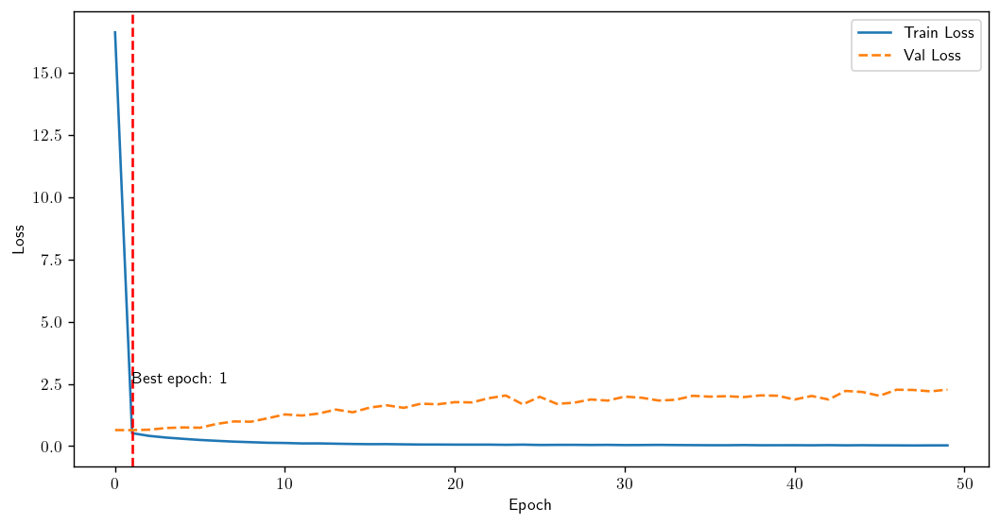

In [51]:
if project_options.debug:
        file_train = "train_losses_e2e_baseline_debug.npy"
        file_val = "val_losses_e2e_baseline_debug.npy"
else:
    file_train =  "train_losses_e2e_baseline.npy"
    file_val = "val_losses_e2e_baseline.npy"

if run_new_eval:
    plot_losses(train_losses, val_losses, first_epoch=0)
    np.save(os.path.join("trained_models/baseline/", file_train), train_losses)
    np.save(os.path.join("trained_models/baseline/", file_val), val_losses)

else:
    #Load the losses from the previous run
    train_losses = np.load(os.path.join("trained_models/baseline", file_train))
    val_losses = np.load(os.path.join("trained_models/baseline", file_val))

    plot_losses(train_losses, val_losses, first_epoch=0)

**Figure 12.** Loss evolution of the baseline model, with the best epoch displayed, as computed through the early stopping algorithm. In blue, training loss; in orange, validation loss.

The best epoch was #2 (position #1 in the vector), as it corresponded to the best validation loss (Figure 12). Moreover, from this point on, a very clear pattern of overfitting (decreasing training loss, increasing validation loss) was observed, giving empirical evidence for the need of early stopping. However, both learning curves are very stable, which indicates a that the learning rate-batch size relationship is appropriate, as discussed in Week 2's lecture, and elsewhere [[5]](https://ora.ox.ac.uk/objects/uuid:342ef1ef-e232-42b2-9e60-3f24157b9ccc/files/sq524jq27t).

#### Question 1.b.ii.ii Performance evaluation (8 marks)
##### Task
- Draw conclusions regarding how well the model performs. To do this you may want to use additional metrics to the one(s) already reported. Critically, you should __contextualise__ the performance of the model. We are expecting discussion points a long the lines: _The model achieved a score of X according to metric Y. This suggests that the model is/is not performing well, because..._

Let us first define the metrics used to evaluate performance for each of the tasks:

1. _Cartesian Delta Prediction (regression)_: given that the target is a continuous variable in 3 dimensions, we will use the following metrics:

- **Root Mean Squared Error (RMSE)**. RMSE is a suitable common metric for regression. For a predicted variable $\hat{y} \in \mathbb{R}^{N \times d}$ and true target $y \in \mathbb{R}^{N \times d}$, RMSE is computed as:

$$ \text{RMSE} = \sqrt{\frac{1}{N} \sum_{i = 1}^{N} (y_i - \hat{y}_i)^2}$$

This metric is equivalent to that used for the loss (MSE), further validating its use.

- **Cosine Similarity**: the cosine similarity is the cosine of the angle between two vectors, and belongs to the interval $[-1, 1]$. A similarity of 1 indicates both vectors are proportional, 0 indicates orthogonality and -1 indicates opposite directions. This is a relevant metric in our task as predicted vectors could have "large" RMSEs but correct predicted directions of movement, which would indicate that the model is learning meaningful input-output relationships. Between two vectors A and B it is defined as:

$$ S_C := cos(\theta) = \frac{\sum_ i A_iB_i}{\sqrt{\sum _i A_i^2}\sqrt{\sum _i B_i^2}} $$

2. _Gripper Action Prediction (classification)_: given that the target is nominal, we will use the following metrics:

$$\text{Precision} = \frac{TP}{TP + FP} ,$$
$$\text{Recall} = \frac{TP}{TP + FN} ,$$
$$\text{F1} = \frac{2\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Precision}} ;$$

where TP stands for true positives, FP for false positives, and FN for false negatives. Since the F1-score integrates precision and recall, it provides a comprehensive measure of a multi-class classification performance. Consequently, the weighted average of the F1-scores across classes (from here on, F1) will be used for model comparison. Precision is also of interest given its class imbalance sensitivity. When a class is overrepresented, the model tends to over-predict that class in order to reduce the objective loss. Therefore, FP increases, and this can observed through precision. Finally, the prediction confusion matrices will be shown.

In [53]:
#Recover model from the latest wandb run for the best epoch and evaluate it on the training and evaluation sets
if run_new_eval:
    best_epoch = early_stopping(val_losses)
    loc = os.path.join(wandb_run_dir, "agent_checkpoints")
    new_loc = os.path.join("trained_models/baseline")
    #Load the model
    model = Baseline1(
        image_encoder=image_encoder,
        obs_encoder=obs_encoder,
        dense=dense
    )
    state_dict = torch.load(os.path.join(loc, f"mdl_chkpnt_epoch_{best_epoch}.pt"), weights_only=True)['model_state_dict']
    
    if project_options.debug:
        torch.save(state_dict, os.path.join(new_loc, "best_epoch_e2e_sd_debug.pt"))
    else:
        torch.save(state_dict, os.path.join(new_loc, "best_epoch_e2e_sd.pt"))
    
    model.load_state_dict(state_dict)

else:
    #Load the model
    model = Baseline1(
        image_encoder=image_encoder,
        obs_encoder=obs_encoder,
        dense=dense
    )
    if project_options.debug:
        if MAC:
            model.load_state_dict(torch.load("trained_models/baseline/best_epoch_e2e_sd_debug.pt", weights_only=True))
        else:
            model.load_state_dict(torch.load("trained_models/baseline/best_epoch_e2e_sd_debug.pt", map_location=torch.device('cpu'), weights_only=True))
    else:
        if MAC:
            model.load_state_dict(torch.load("trained_models/baseline/best_epoch_e2e_sd.pt", weights_only=True))
        else:
            model.load_state_dict(torch.load("trained_models/baseline/best_epoch_e2e_sd.pt", map_location=torch.device('cpu'), weights_only=True))


#Evaluate the model on the training and validation sets
train_criterion_eval = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="train",
    mo=None
    )

val_criterion_eval = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="val",
    mo=None
    )

evaluate_model_fn = ValidateSingleEpoch(half_precision=exp_kwargs["half_precision"], cache_preds=True, cache_inputs=True)
train_loss, train_preds, train_true, train_inputs = evaluate_model_fn(model=model, data_loader=train_dataloader, gpu=True, mac=MAC, criterion=train_criterion_eval)
val_loss, val_preds, val_true, val_inputs = evaluate_model_fn(model=model, data_loader=val_dataloader, gpu=True, mac=MAC, criterion=val_criterion_eval)

In [25]:
#EVALUATION FUNCTIONS
from torch import nn
from sklearn.metrics import classification_report, auc, roc_curve, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay

#A. Coordinate Deltas
def rmse(preds, true):
    #Function to compute the RMSE
    #Inputs: preds, true
    #Outputs: RMSE

    #Check both arrays are np
    preds = preds.numpy()
    true = true.numpy()
    rmse_vec = []
    for i in range(len(preds)):
        rmse = np.sqrt(np.mean((preds[i] - true[i])**2))
        rmse_vec.append(rmse)
        
    return rmse_vec, np.mean(rmse_vec)

def cos_sim(preds, true):
    #Function to compute the cosine similarity
    #Inputs: preds, true
    #Outputs: cosine similarity

    #Check both arrays are np
    preds = preds.numpy()
    true = true.numpy()
    cosine_similarity = []
    for i in range(len(preds)):
        cs = np.dot(preds[i], true[i]) / (np.linalg.norm(preds[i]) * np.linalg.norm(true[i]))
        cosine_similarity.append(cs)
        if cs == np.nan:
            print(preds[i], true[i])
        
    return cosine_similarity, np.nanmean(cosine_similarity)

#B. Gripper Actions
def undo_one_hot_encoding(true):
    #Function to undo one hot encoding
    #Inputs: true
    #Outputs: true

    #np.argmax returns the indices of the maximum values along an axis, which corresponds to the class
    return np.argmax(true, axis=1)

def compute_predicted_class(preds):
    #Function to compute the predicted class
    #Inputs: preds
    #Outputs: predicted class
    
    #preds contains the class logits, which must be converted to a probability. The class with the highest probability is the predicted class
    preds = nn.Softmax(dim=1)(preds)
    preds = np.array(preds)
    return np.argmax(preds, axis=1)

def display_sklearn_reports(y_true, y_pred, train_or_val, fig = None, ax = None):   
    
    confusion_matrix_train = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_train, display_labels=['0 (Close)', '1 (Do not move)', '2 (Open)'])
    disp.plot(ax=ax, cmap = 'Blues')
    disp.ax_.set_title(f'Confusion Matrix {train_or_val} Set')


    # Classification report train set
    print(f"Classification report for {train_or_val} set:", "\n", classification_report(y_true, y_pred, target_names=['0 (Close)', '1 (Do not move)', '2 (Open)']))


def visualize_regression_performance(train_true, train_preds, val_true, val_preds, xlim_rmse):
    #Function to visualize the regression performance
    #Inputs: train_true, train_preds, val_true, val_preds

    #A. Train set
    #A.1. RMSE
    rmse_train, mean_rmse_train = rmse(train_preds['pos'], train_true['pos'])

    #B. Val set
    #B.1. RMSE
    rmse_val, mean_rmse_val = rmse(val_preds['pos'], val_true['pos'])

    #C.1. Plot
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    sns.histplot(rmse_train, ax=ax[0], kde=True, color='blue', label='Train')
    sns.histplot(rmse_val, ax=ax[1], kde=True, color='red', label='Validation')
    ax[0].set_title('RMSE')
    ax[1].set_title('RMSE')
    ax[0].set_xlabel('RMSE')
    ax[1].set_xlabel('RMSE')
    ax[0].legend()
    ax[0].text(0.6, 0.8, f"Mean RMSE: {mean_rmse_train:.3f}", horizontalalignment='center', verticalalignment='center', transform=ax[0].transAxes, fontsize = 10)
    ax[1].legend()
    ax[1].text(0.6, 0.8, f"Mean RMSE: {mean_rmse_val:.3f}", horizontalalignment='center', verticalalignment='center', transform=ax[1].transAxes, fontsize = 10)
    ax[0].set_xlim(xlim_rmse)
    ax[1].set_xlim(xlim_rmse)
    plt.show()

    #A.2. Cosine similarity
    cos_train, mean_cos_train = cos_sim(train_preds['pos'], train_true['pos'])
    cos_val, mean_cos_val = cos_sim(val_preds['pos'], val_true['pos'])

    #C.2. Plot
    fig2, ax2 = plt.subplots(1, 2, figsize=(10, 5))
    sns.histplot(cos_train, ax=ax2[0], kde=True, color='blue', label='Train')
    sns.histplot(cos_val, ax=ax2[1], kde=True, color='red', label='Validation')
    ax2[0].set_title('Cosine Similarity')
    ax2[1].set_title('Cosine Similarity')
    ax2[0].set_xlabel('Cosine Similarity')
    ax2[1].set_xlabel('Cosine Similarity')
    ax2[0].legend()
    ax2[0].text(0.4, 0.8, f"Mean cosine similarity: {mean_cos_train:.3f}", horizontalalignment='center', verticalalignment='center', transform=ax2[0].transAxes, fontsize = 10)
    ax2[1].legend()
    ax2[1].text(0.4, 0.8, f"Mean cosine similarity: {mean_cos_val:.3f}", horizontalalignment='center', verticalalignment='center', transform=ax2[1].transAxes, fontsize = 10)
    plt.show()

    return rmse_train, rmse_val, cos_train, cos_val
    

------------ COORDINATE DELTAS ------------


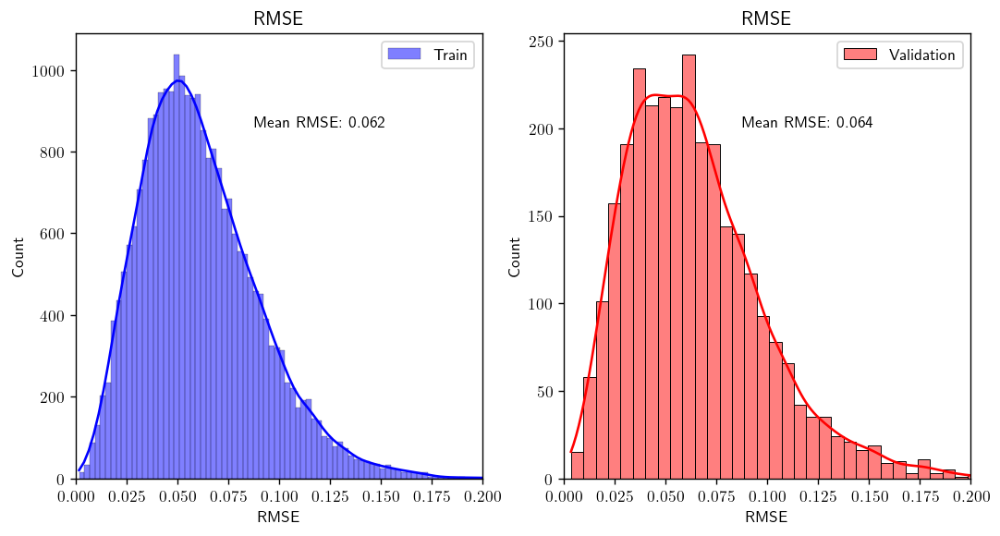

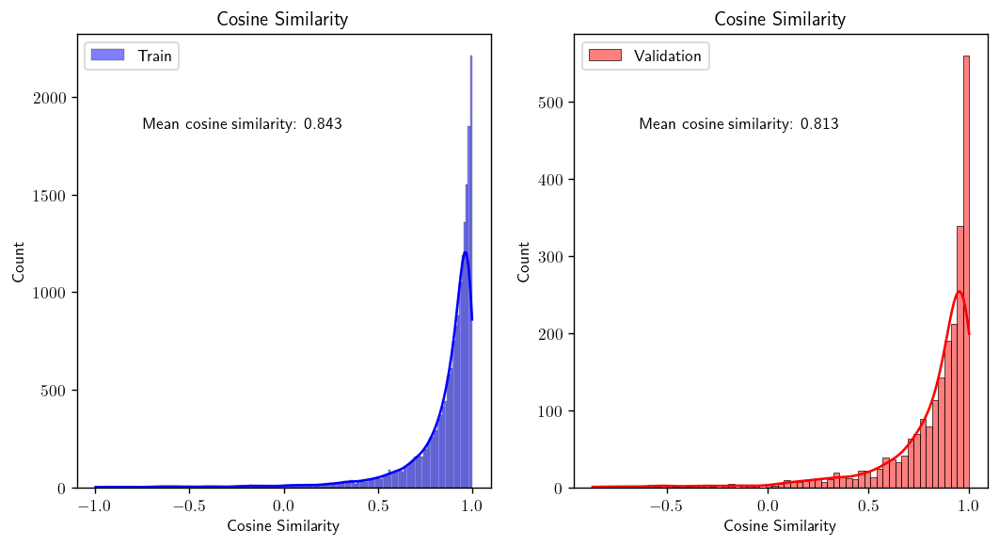

------------ GRIPPER ACTIONS ------------
Classification report for Train set: 
                  precision    recall  f1-score   support

      0 (Close)       0.56      0.07      0.12      3061
1 (Do not move)       0.81      0.92      0.87     19147
       2 (Open)       0.48      0.50      0.49      3261

       accuracy                           0.77     25469
      macro avg       0.62      0.50      0.49     25469
   weighted avg       0.74      0.77      0.73     25469

Classification report for Validation set: 
                  precision    recall  f1-score   support

      0 (Close)       0.46      0.12      0.19       373
1 (Do not move)       0.81      0.92      0.86      2161
       2 (Open)       0.42      0.41      0.41       367

       accuracy                           0.75      2901
      macro avg       0.56      0.48      0.49      2901
   weighted avg       0.72      0.75      0.72      2901



/var/folders/dk/qy9bk4_94zsb04lj0tpx7vx40000gn/T/ipykernel_37080/4130734344.py:54: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  preds = np.array(preds)


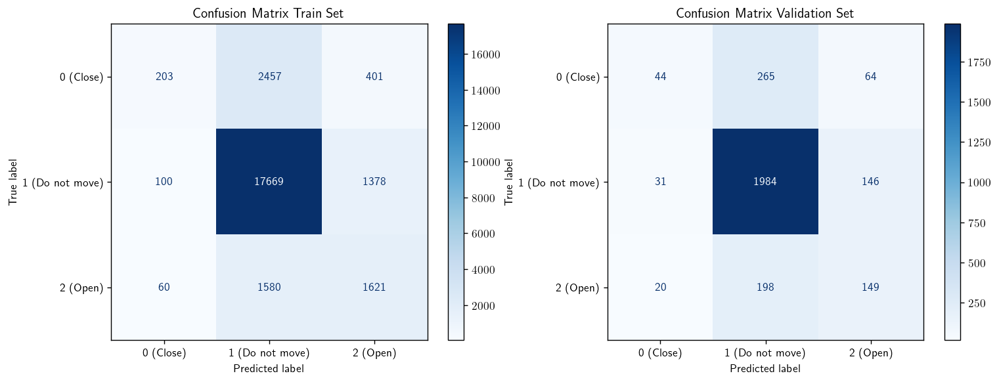

In [71]:
#Display the RMSE and cosine similarity for the coordinate deltas
print('------------ COORDINATE DELTAS ------------')
rmse_vec_train, rmse_vec_val, cos_vec_train, cos_vec_val = visualize_regression_performance(train_true, train_preds, val_true, val_preds, xlim_rmse = [0, 0.2])

#Display the classification report for the gripper actions
print('------------ GRIPPER ACTIONS ------------')
train_true_grp = undo_one_hot_encoding(train_true['grp'])
train_pred_grp = compute_predicted_class(train_preds['grp'])
val_true_grp = undo_one_hot_encoding(val_true['grp'])
val_pred_grp = compute_predicted_class(val_preds['grp'])

fig, ax = plt.subplots(1, 2, figsize=(14.3, 5))
display_sklearn_reports(train_true_grp, train_pred_grp, 'Train', fig=fig, ax=ax[0])
display_sklearn_reports(val_true_grp, val_pred_grp, 'Validation', fig=fig, ax=ax[1])


**Figure 13.** Prediction performance metrics for the baseline model. (Top) Root mean squared error (RMSE) for the training (left) and validation (right) sets, with their respective means. (Middle) Cosine similarity for the training (left) and validation (right) sets, with their respective means. (Bottom) Classification reports and confusion matrices for the training (left) and validation (right) sets.

We also compute the accuracy by chance:

In [27]:
from collections import Counter
def compute_chance_accuracy(labels):
    # Count the occurrences of each class
    class_counts = Counter(labels)
    
    # Compute the probability of each class
    total_samples = len(labels)
    class_probs = {cls: count / total_samples for cls, count in class_counts.items()}
    
    # Calculate chance accuracy as the sum of squared probabilities
    chance_accuracy = sum(prob**2 for prob in class_probs.values())
    
    return chance_accuracy

print('Chance accuracy for the gripper actions in the train set:', np.round(compute_chance_accuracy(train_true_grp.numpy()),3))
print('Chance accuracy for the gripper actions in the validation set:', np.round(compute_chance_accuracy(val_true_grp.numpy()),3))


Chance accuracy for the gripper actions in the train set: 0.596
Chance accuracy for the gripper actions in the validation set: 0.587


The baseline model performance is outlined below:

1. _Cartesian Delta Prediction (regression)_: in both sets, the RMSEs followed a normal distribution with a positive skew. The training set mean was smaller ($\mu_{train} = 0.064$) than that of the validation set ($\mu_{val} = 0.062$). Considering that the deltas were distributed between $[-0.2, 0.2]$ with $\sigma = 0.1-0.12$, this indicates that the model is performing well at predicting them as the scale of the error is an order of magnitude smaller than the dataset's standard deviation. Moreover, the cosine similarity distributions are log-normal around one ($\mu_{train} = 0.843$, $\mu_{val} = 0.813$) with negative skew, indicating that most predictions are aligned with their true deltas. Therefore, the model is generally performing well in the regression task.

2. _Gripper Action Prediction (classification)_: the model achieved 0.73 and 0.72 F1 scores in the training and validation sets, respectively. Class 1 achieved the best per-class precision (0.81), recall (0.92) and F1 scores (0.87, 0.86) in both sets, respectively. Conversely, class 0 (least represented) prediction had the worst prediction metrics in both sets (0.12 and 0.19 F1 scores, respectively). This was expected given the hypothesized impact of class imbalance, as it is less costly on average to classify a sample as type-1 than type-0/2. While the weighted F1 scores indicate a better-than-chance performance (0.59 training set, 0.58 validation set), this is highly driven by the prevalence of type-1 actions. The characteristics of the misclassifications could provide insights to improve performance.

_The model and losses can be loaded from the `baseline` folder. Please, set run_new_eval to True to re-run the experiments._

#### Question 1.b.ii.iii Model failure modes (9 marks)
##### Task
- Investigate the failure modes of the model. You should: 
  - Demonstrate the failure mode using **empirical evidence** e.g., _the model fails on X observations as demonstrated by..._
  - Assess the impact of these failure modes using **empirical evidence** i.e., how significant is this problem. You should consider both metrics and dataset coverage
  - Conclude __why__ the model might be failing on these observations **empirical evidence** e.g., _X part of the model performs poorly, as demonstrated by..._

__IMPORTANT__:
- Marks will be penalised if the failure modes you identify are not systematic i.e., you select a single observation that the model fails on. If you cannot identify any general failure modes of the model, you will be awarded full marks if you provide empirical evidence justifying why there are no systematic failure modes which sufficienty accounts for the diversity of observations in the dataset.


As discussed above, model failure can refer to either incorrect prediction of the robotic arm displacement (Cartesian deltas) or gripper action (0, close; 1, do not move; 2, open). Here, model failure modes were understood as a general pattern of error in the prediction (e.g., the model misclassifies most type-0 actions as type 1) the existence and nature of which is to be supported through: 
-   an analysis of the performance metrics;
-   an exploration of the characteristics of the misclassified observations with respect to their predicted and their true classes.

These analyses were based on the comparison of statistical distributions, correlations and dimensionality reduction techniques in the case of input images. Let us separate the study between failures in the regression and the classification tasks.

1. In terms of the Cartesian deltas prediction, the RMSEs follow a positively skewed normal distribution ($\mu_{train} = 0.062, \mu_{test} = 0.064$). Therefore, as the model errs on all predictions, a failure mode is hard to define. Nevertheless, the magnitude of the error could be related to characteristics in the observations. Therefore, let us first compute the correlation between the input observations (`ee_cartesian/vel/joint_pos_ob`)
and the RMSE.

------------ CORRELATION BETWEEN RMSE AND INPUT FEATURES ------------


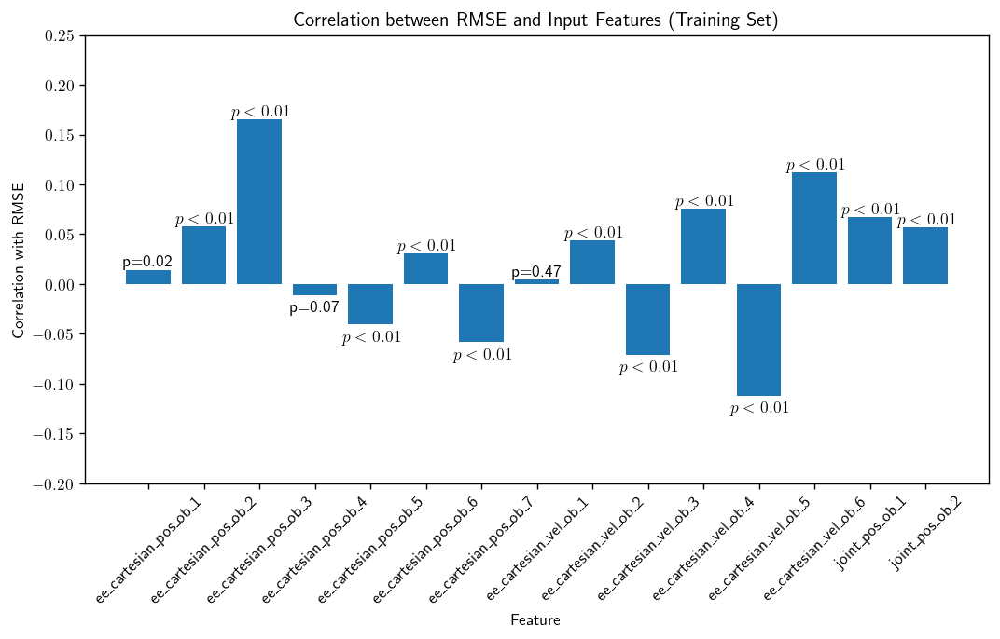

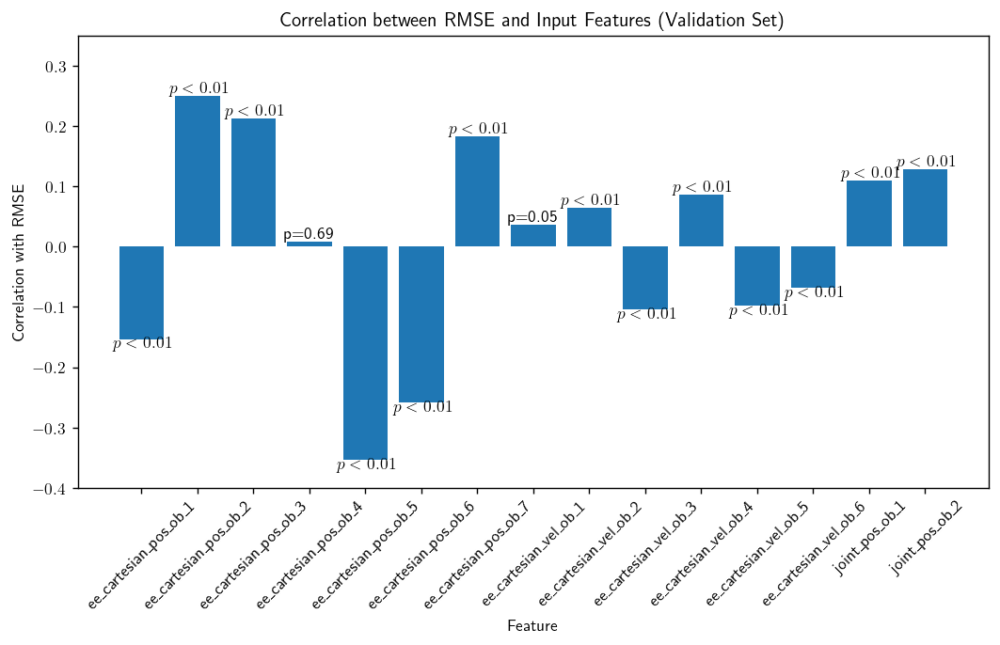

In [29]:
#Observe the correlation between the mean_rmse and the input features
from scipy.stats import pearsonr

feature_names = ['ee_cartesian_pos_ob_1', 'ee_cartesian_pos_ob_2', 'ee_cartesian_pos_ob_3', 'ee_cartesian_pos_ob_4', 'ee_cartesian_pos_ob_5', 'ee_cartesian_pos_ob_6', 'ee_cartesian_pos_ob_7']
feature_names += ['ee_cartesian_vel_ob_1', 'ee_cartesian_vel_ob_2', 'ee_cartesian_vel_ob_3', 'ee_cartesian_vel_ob_4', 'ee_cartesian_vel_ob_5', 'ee_cartesian_vel_ob_6']
feature_names += ['joint_pos_ob_1', 'joint_pos_ob_2']

print('------------ CORRELATION BETWEEN RMSE AND INPUT FEATURES ------------')
#Training set
#Concatenate the RMSE values with the input features
corr_vec_train = []
p_values_train = [] 
corr_vec_val = []
p_values_val = []
n_features = train_inputs['obs'].shape[1]   
for i in range(n_features):
    corr_vec_train.append(pearsonr(train_inputs['obs'][:, i], rmse_vec_train)[0])
    corr_vec_val.append(pearsonr(val_inputs['obs'][:, i], rmse_vec_val)[0])
    p_values_train.append(pearsonr(train_inputs['obs'][:, i], rmse_vec_train)[1])
    p_values_val.append(pearsonr(val_inputs['obs'][:, i], rmse_vec_val)[1])


#Plot the correlation vector
plt.figure(figsize=(10, 5))
plt.bar(feature_names, corr_vec_train)
for i in range(len(corr_vec_train)):
    if corr_vec_train[i] > 0:
        add = 0
    else:
        add = -0.02
    if p_values_train[i] < 0.01:
        text = r'$p < 0.01$'
    else:
        text = f'p={p_values_train[i]:.2f}'
    plt.text(i, corr_vec_train[i] + add, text, ha='center', va='bottom')
plt.xlabel('Feature')
plt.ylabel('Correlation with RMSE')
plt.title('Correlation between RMSE and Input Features (Training Set)')
plt.ylim(([-0.2, 0.25]))
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(10, 5))
plt.bar(feature_names, corr_vec_val)
for i in range(len(corr_vec_val)):
    if corr_vec_val[i] > 0:
        add = 0
    else:
        add = -0.02
    if p_values_val[i] < 0.01:
        text = r'$p < 0.01$'
    else:
        text = f'p={p_values_val[i]:.2f}'   
    plt.text(i, corr_vec_val[i] + add, text, ha='center', va='bottom')
plt.xlabel('Feature')
plt.ylabel('Correlation with RMSE')
plt.title('Correlation between RMSE and Input Features (Validation Set)')
plt.ylim(([-0.4, 0.35]))
plt.xticks(rotation=45)
plt.show()

**Figure 14.** Correlation between the Cartesian features and the model's RMSE in the training (top) and validation (bottom) sets. Significance (here set at $p<0.01$) of the correlation is shown above/below each bar.

Both `ee_cartesian_pos_ob_4` and `ee_cartesian_vel_ob_1` did not present a significant correlation with RMSE in the training and validation sets. Additionally, `ee_cartesian_pos_ob_1` did not either in the training set. The correlations tended to be larger in the validation set, and not always in the same "direction" (e.g., `ee_cartesian_pos_ob_5`, `ee_cartesian_vel_ob_6`). The `joint_pos_ob` variables presented both significant and positive corelations with RMSE, although its magnitude (0.05-0.12) is rather small, which makes confirming a systematic effect difficult. `ee_cartesian_pos_ob_5/6` showed remarkably larger negative correlations with RMSE (-0.26, -0.36) with RMSE in the validation set.

Regarding the input images, their large dimensionality impedes an analysis such as the one above. Therefore, we performed a t-distributed stochastic neighbor embedding (TSNE, [[6]](https://www.google.com/search?q=%5B1%5D+van+der+Maaten%2C+L.J.P.%3B+Hinton%2C+G.E.+Visualizing+High-Dimensional+Data+Using+t-SNE.+Journal+of+Machine+Learning+Research+9%3A2579-2605%2C+2008.&oq=%5B1%5D+van+der+Maaten%2C+L.J.P.%3B+Hinton%2C+G.E.+Visualizing+High-Dimensional+Data+Using+t-SNE.+Journal+of+Machine+Learning+Research+9%3A2579-2605%2C+2008.&gs_lcrp=EgZjaHJvbWUyBggAEEUYOdIBBzEzMmowajeoAgCwAgA&sourceid=chrome&ie=UTF-8)) dimensionality reduction (2D) of the each image type stratified by RMSE in both the training and validaiton sets.

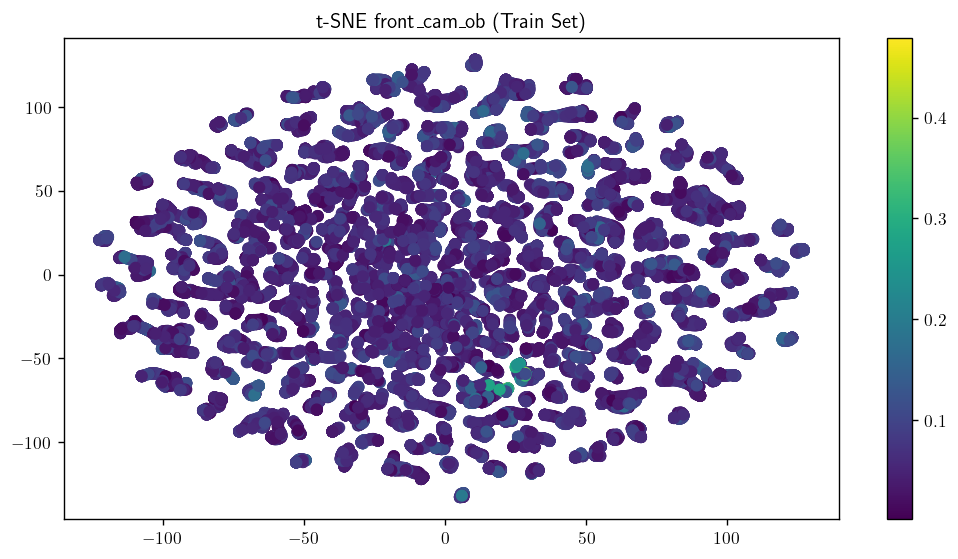

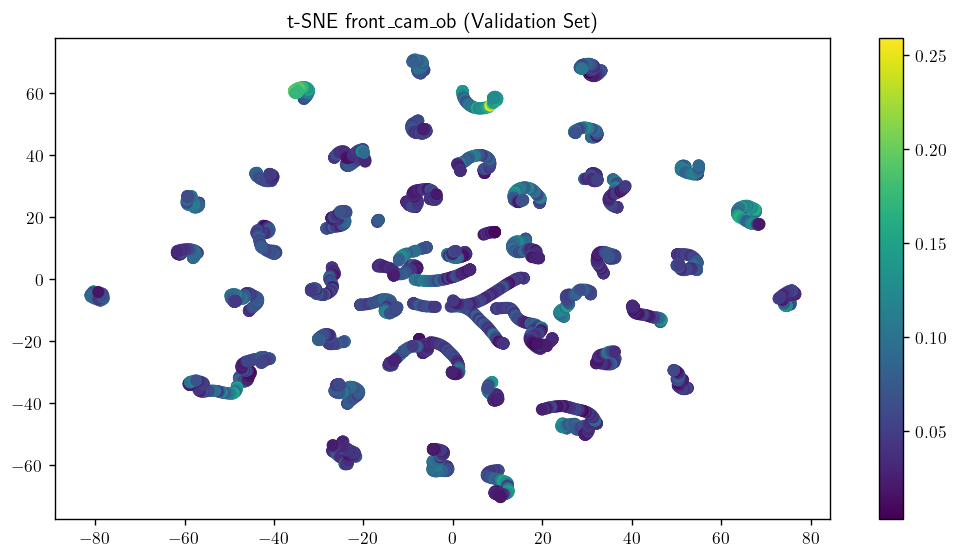

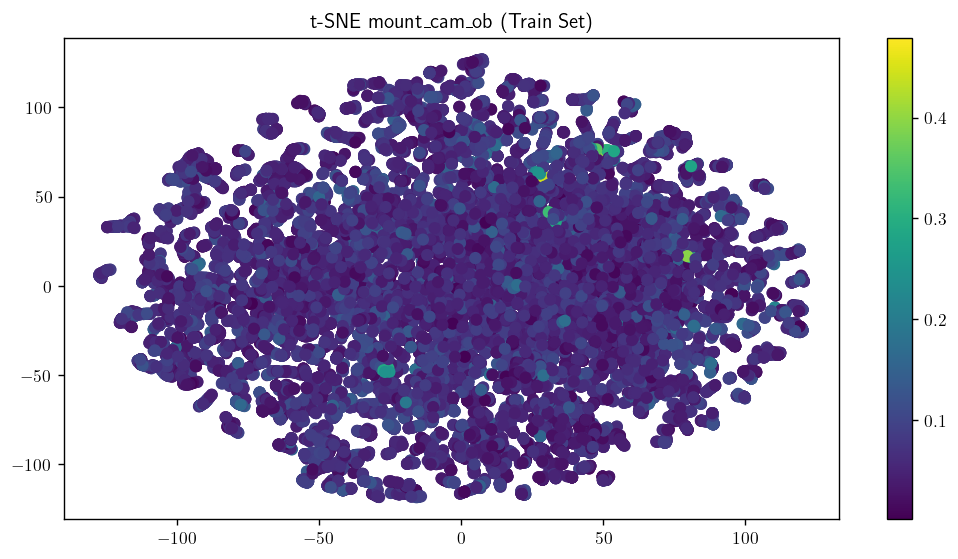

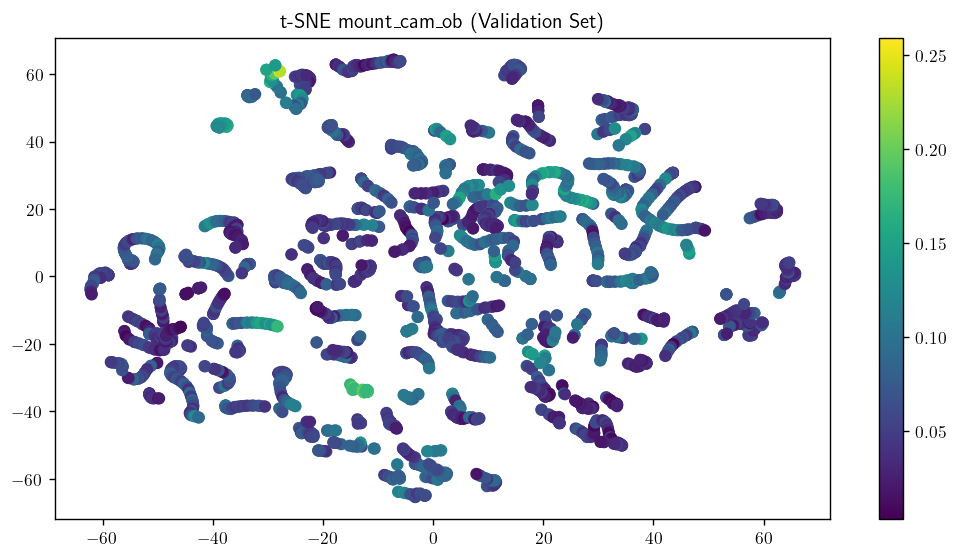

In [41]:
from sklearn.manifold import TSNE

def TSNE_pos(labels, title, tsne_given=False, data=None, tsne_obj = None):
    #Function to plot the t-SNE plot
    #Inputs: data, labels, title
    #Outputs: t-SNE plot

    #Initialize the t-SNE model
    if not tsne_given:
        tsne = TSNE(n_components=2, random_state=0)
        #Fit the model
        tsne_obj = tsne.fit_transform(data)
    
    #Plot the t-SNE plot
    plt.figure(figsize=(10, 5))
    plt.scatter(tsne_obj[:, 0], tsne_obj[:, 1], c=labels, cmap='viridis')
    plt.colorbar()
    plt.title(title)
    plt.show()

    return tsne_obj

#Visualize the t-SNE plot for the input features
titles = ['t-SNE front_cam_ob (Train Set)', 't-SNE front_cam_ob (Validation Set)', 't-SNE mount_cam_ob (Train Set)', 't-SNE mount_cam_ob (Validation Set)']
tsne_obj = {}
for i, title in enumerate(titles):

    if 'front_cam_ob' in title:
        channel = 0
    
    else:
        channel = 1
    
    if 'Train' in title:
        data = train_inputs['images'][:, channel].reshape(train_inputs['images'].shape[0], -1)
        labels = rmse_vec_train
    
    elif 'Validation' in title:
        data = val_inputs['images'][:, channel].reshape(val_inputs['images'].shape[0], -1)
        labels = rmse_vec_val
    
    tsne = TSNE_pos(labels, title, data=data, tsne_given=False) 
    tsne_obj[title] = tsne

#Save the t-SNE dictionary
np.save('tsne_dict.npy', tsne_obj)

**Figure 15.** t-SNE reduction of the images coloured by the baseline model's RMSE. The first two reductions correspond to the front_cam_ob images (training, top; validation, bottom), while the latter two correspond to the mount_cam_ob images (training, top; validation, bottom).

As observed in the figures above, dimensionality reduction of the `front_cam_ob` and `mount_cam_ob` images did not show separate clusters nor any relationship with RMSE in either image type. Let us also repeat the experiment in relationship with the cosine similarity.

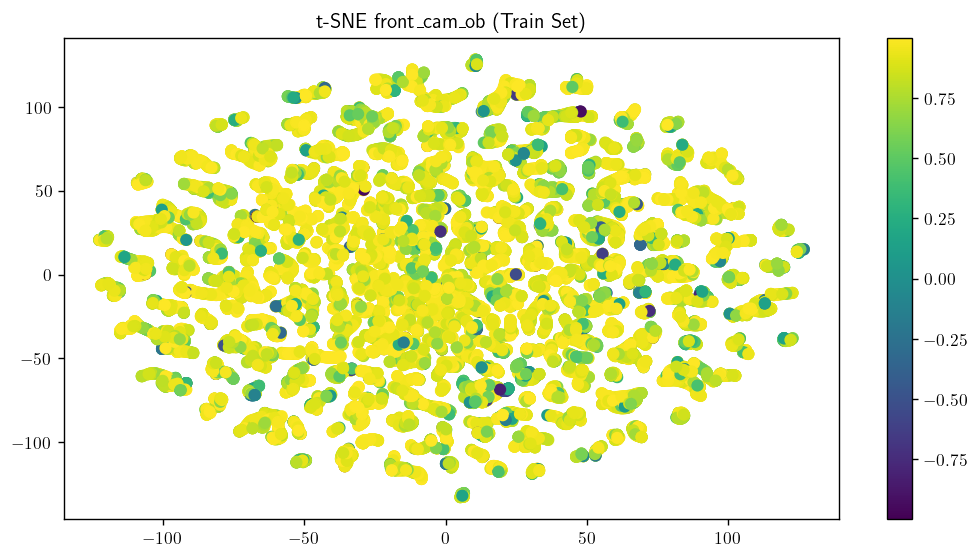

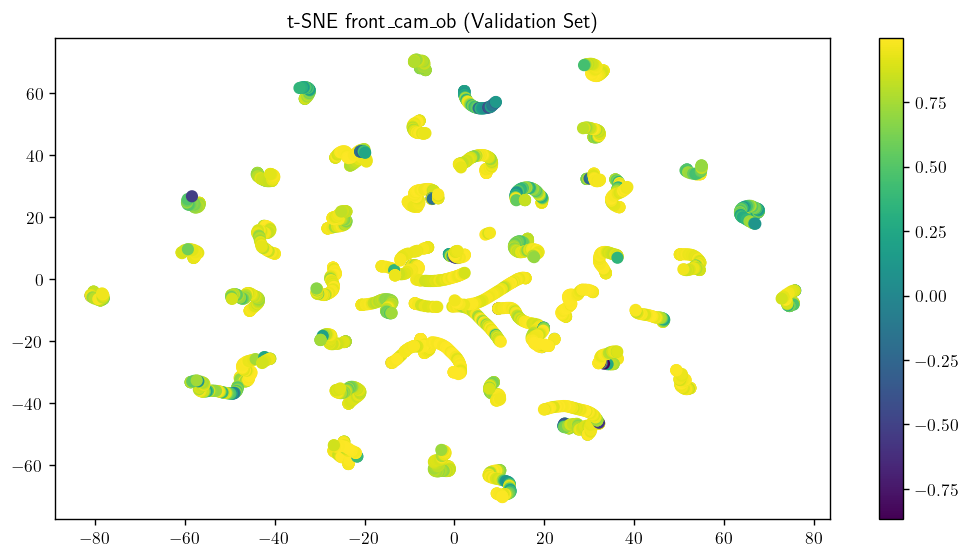

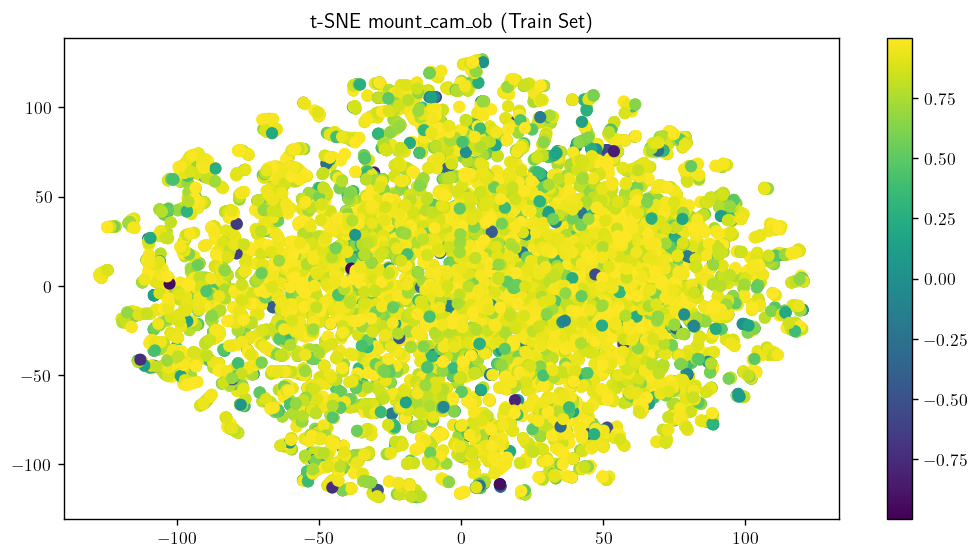

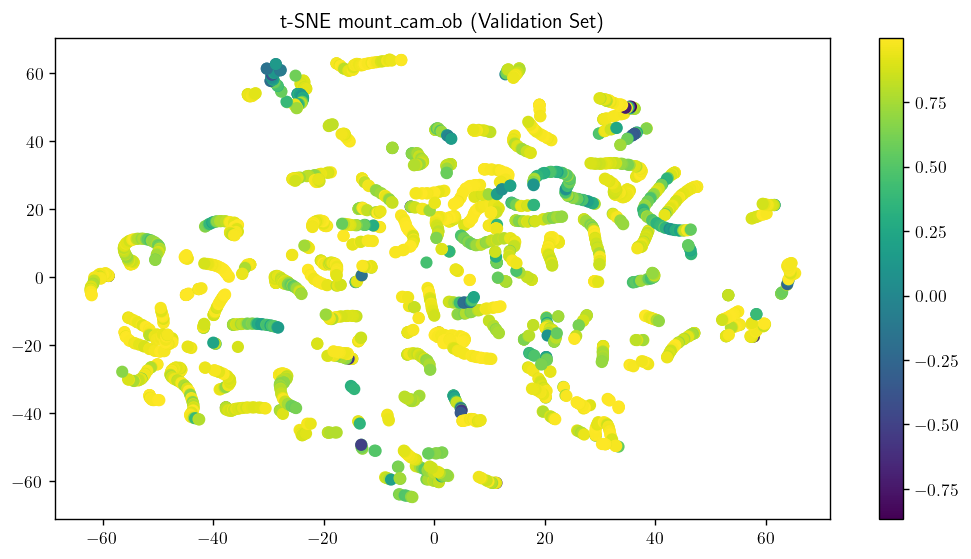

In [42]:
tsne_obj = np.load('tsne_dict.npy', allow_pickle=True).item()

for i, title in enumerate(titles):

    if 'front_cam_ob' in title:
        channel = 0
    
    else:
        channel = 1
    
    if 'Train' in title:
        labels = cos_vec_train
    
    elif 'Validation' in title:
        labels = cos_vec_val

    TSNE_pos(labels, title, tsne_given=True, tsne_obj=tsne_obj[title])

**Figure 16.** t-SNE reduction of the images coloured by the predictions' cosine similarity. The first two reductions correspond to the front_cam_ob images (training, top; validation, bottom), while the latter two correspond to the mount_cam_ob images (training, top; validation, bottom).

Again, no systematic relationship could be found. Therefore, as demonstrated by the evidence in the performance metrics and the analysis of both types of inputs (Cartesian observations, images), no systematic failure mode could be determined in the prediction of Cartesian deltas.

2. Regarding the gripper action prediction, the confusion matrices convey an insightful depiction of what the failure modes our model might be. In the training set, two main types of misclassification exist:

-   **Failure Mode 1, class 0 and 2 actions misclassified as 1**: training set, 4037 errors (67.5%); validation set, 463 errors (63.9%).  
-   **Failure Mode 2, class 1 observations misclassified as 2**: training set, 1378 errors (23.1%); validation set, 146 errors (20.2%). 

These errors highly impact the performance of the model. For instance, correct classification of Failure Mode 1's type-0 actions would lead to a 0.90 class F1 and a 0.79 $F1_w$ in the training set - 7% improvement with respect to baseline-. Nevertheless, the nature of the observations being misclassified must be understood to increase performance. Note also that the rest of errors are from class 0 being classified as class 2, and viceversa (10%, training set; 16%, validation set). Their small prevalence makes them harder to adress and to systematically analyze, although the analyses below could shine light on them.

First of all, let us show a bar chart of the true predicted classes in both sets, in an attempt to understand if the model is learning the training data dsitribution.

(array([0, 1, 2]), array([ 3061, 19147,  3261])) [0.12018532 0.75177667 0.12803801]
(array([0, 1, 2]), array([ 373, 2161,  367])) [0.12857635 0.74491555 0.1265081 ]


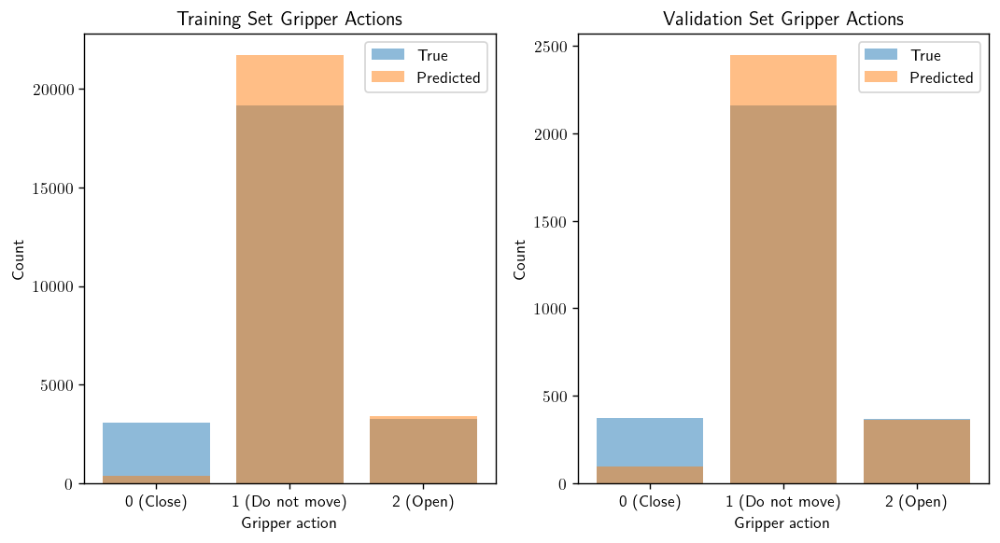

In [72]:
#Bar chart for true and predicted gripper actions in both datasets
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
value_counts_true = np.unique(train_true_grp, return_counts=True)
print(value_counts_true, value_counts_true[1]/np.sum(value_counts_true[1]))
value_counts_pred = np.unique(train_pred_grp, return_counts=True)
ax[0].bar(value_counts_true[0], value_counts_true[1], alpha=0.5, label='True')
ax[0].bar(value_counts_pred[0], value_counts_pred[1], alpha=0.5, label='Predicted')
ax[0].set_title('Training Set Gripper Actions')
ax[0].set_xticks(value_counts[0])
ax[0].set_xticklabels(['0 (Close)', '1 (Do not move)', '2 (Open)'])
ax[0].set_xlabel('Gripper action')
ax[0].set_ylabel('Count')
ax[0].legend()

value_counts_true = np.unique(val_true_grp, return_counts=True)
print(value_counts_true, value_counts_true[1]/np.sum(value_counts_true[1]))
value_counts_pred = np.unique(val_pred_grp, return_counts=True)
ax[1].bar(value_counts_true[0], value_counts_true[1], alpha=0.5, label='True')
ax[1].bar(value_counts_pred[0], value_counts_pred[1], alpha=0.5, label='Predicted')
ax[1].set_title('Validation Set Gripper Actions')
ax[1].set_xticks(value_counts[0])
ax[1].set_xticklabels(['0 (Close)', '1 (Do not move)', '2 (Open)'])
ax[1].set_xlabel('Gripper action')
ax[1].set_ylabel('Count')
ax[1].legend()
plt.show()

**Figure 17.** Bar charts of the true and predicted gripper actions in the training (left) and validation (right) sets.

From the predicted training set distribution it can be observed how type-1 actions are over-predicted, following the hypothesized behavior stemming from the present class imbalance. In the validation set, this phenomenon is also observed, although the class 0/2 predictions seem more accurate (distribution-wise). Nevertheless, both the bar chart and the confusion matrix revealed a rather poor performance. It is therefore necessary to understand if there are any data patterns underlying the model failure modes. To do so, first we show each observational feature's distribution stratified by true class in the training set. This is compared to each feature's distribution computed on the misclassifications, stratified by predicted class. If the misclassifications follow the distribution of their predicted class, this could explain why the model would predict a different gripper action than that which was performed. This can be visualized in the figures below:

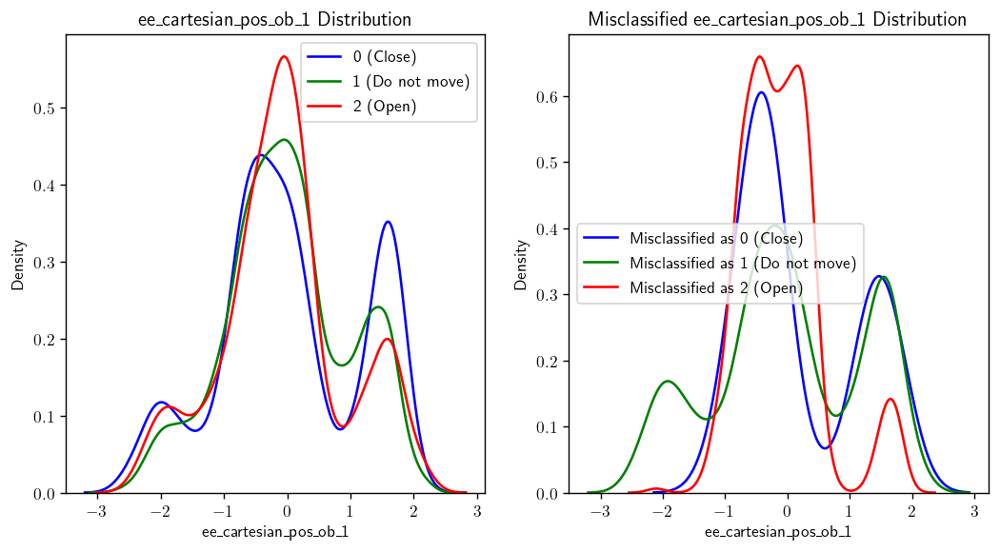

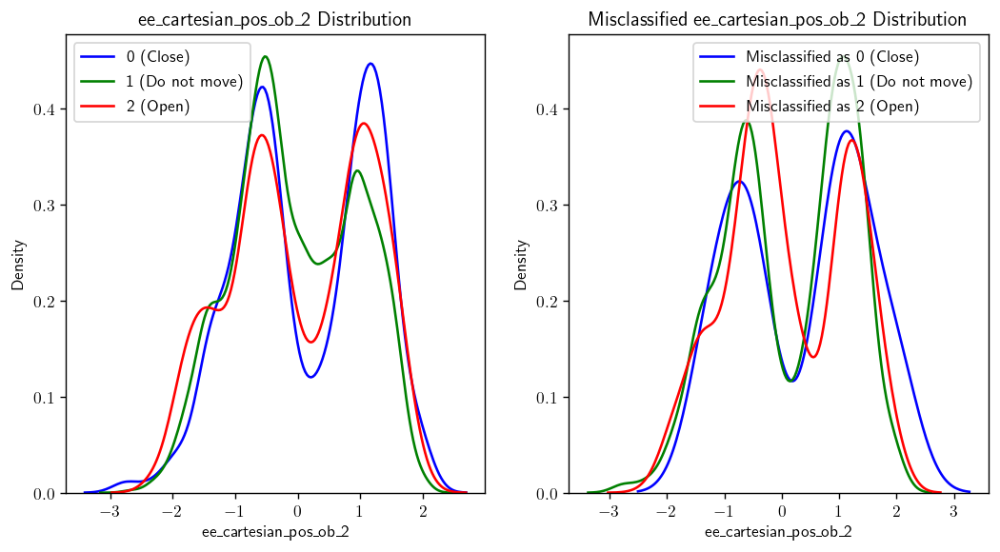

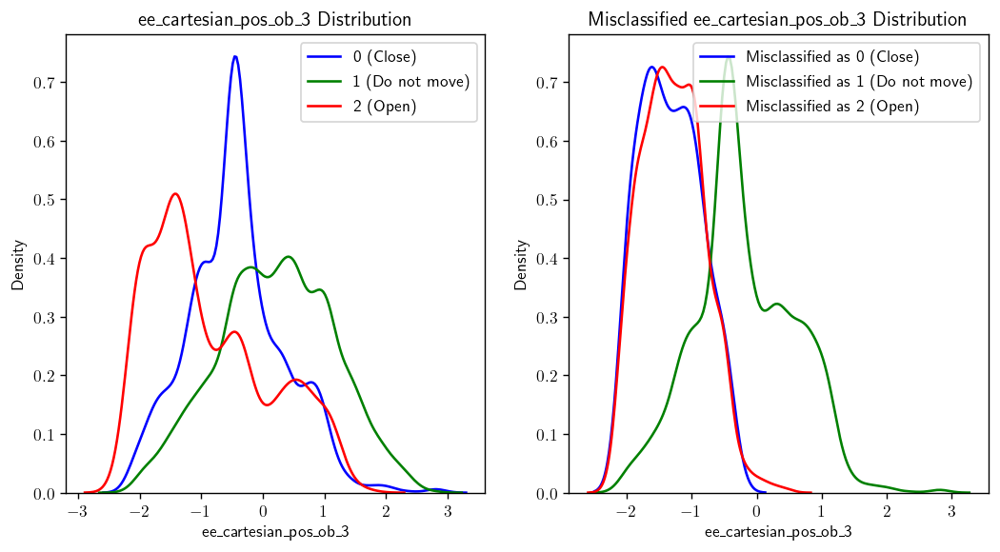

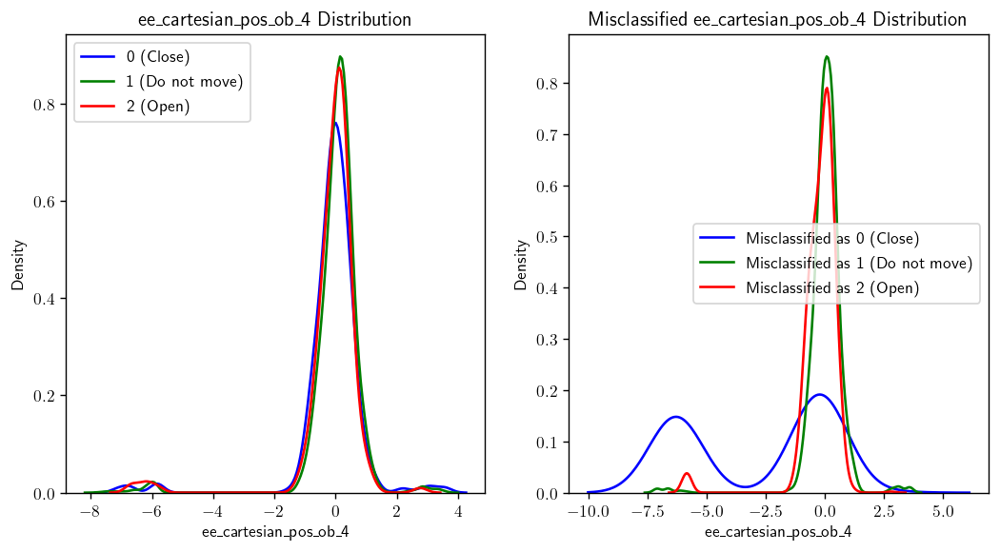

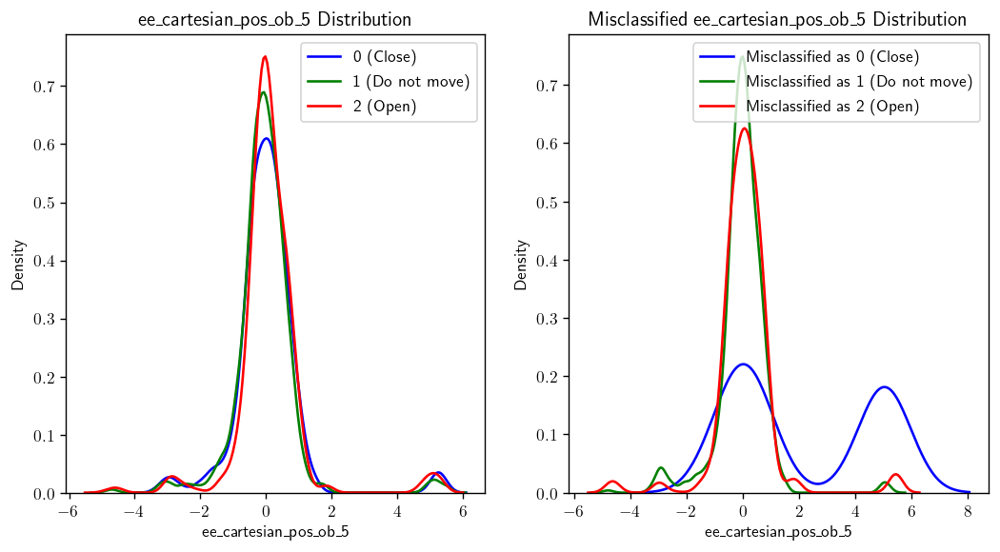

...

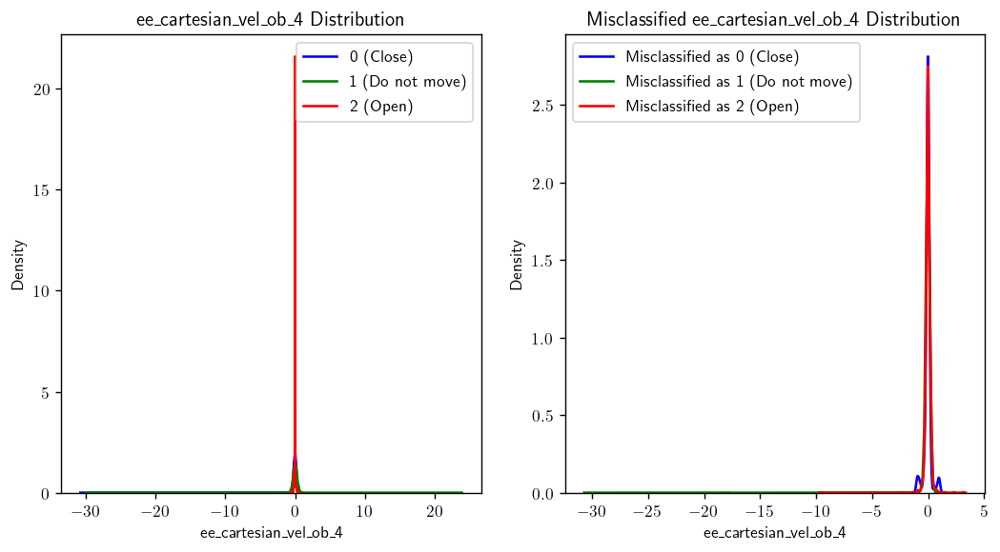

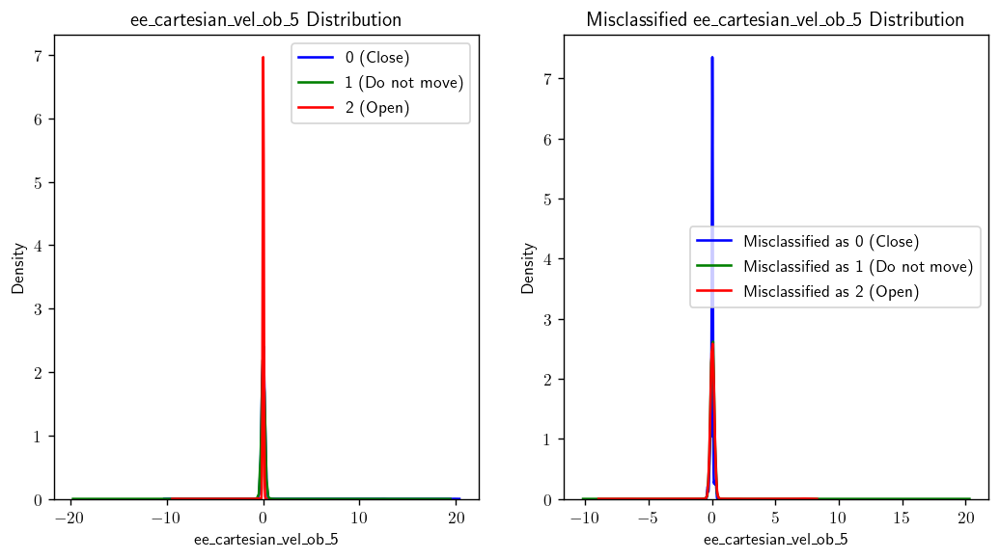

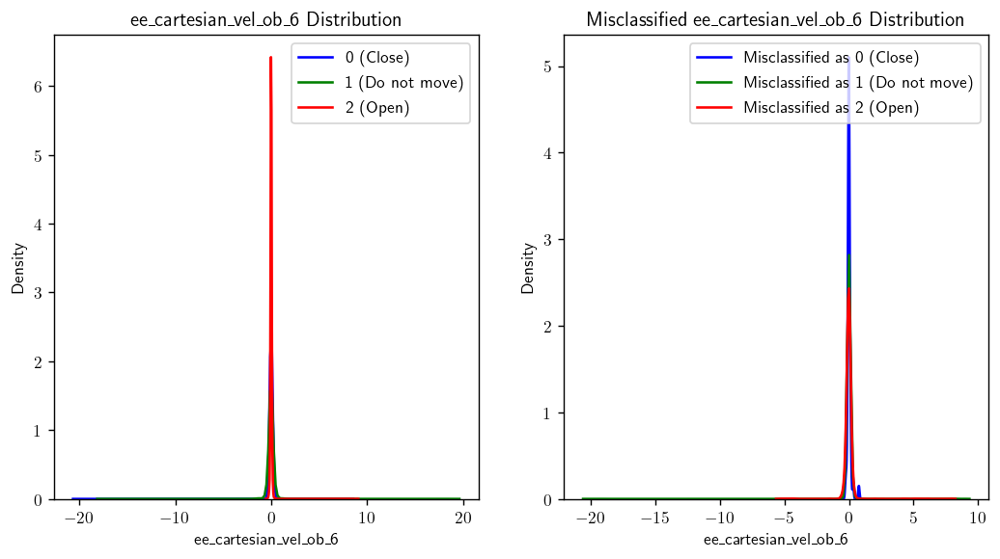

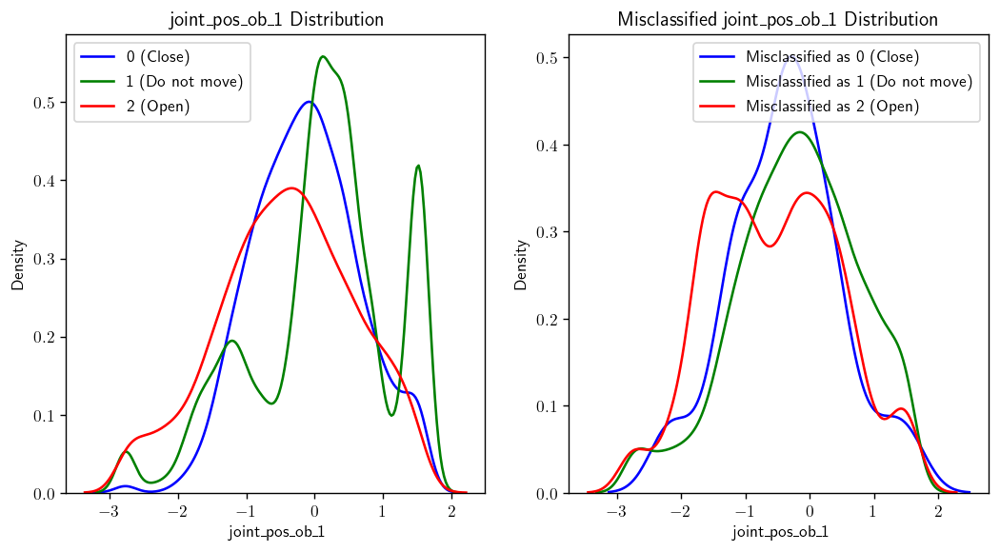

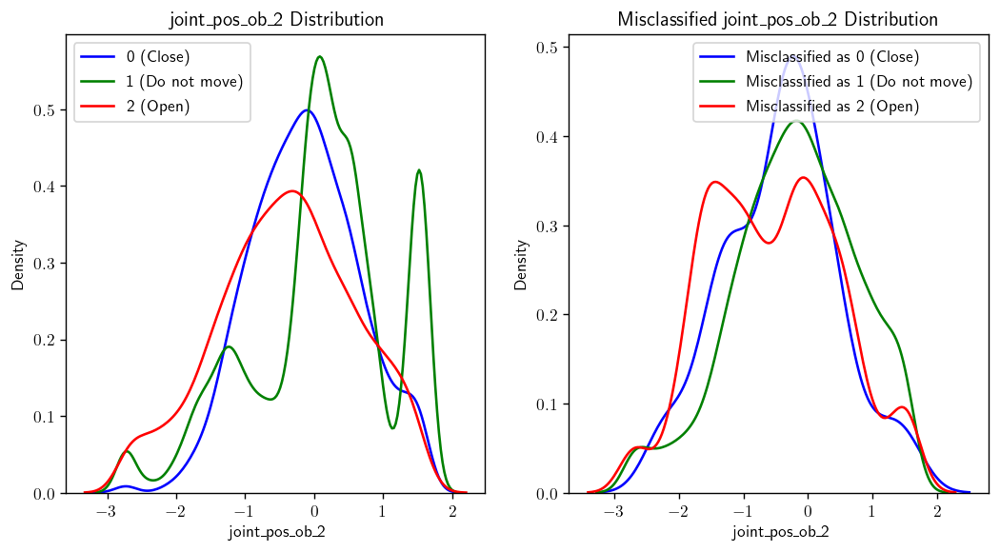

In [73]:
#Per feature, analyze the distibution (sns.kdeplot) of the whole dataset (train) stratified by class and the distribution of the misclassified samples
#Therefore, for a single feature, create 2 subplots:
#The subplot on the left has 3 curves: one for each class computed on the whole training set
#The subplot on the right has 3 curves: one for each class computed on the misclassified samples stratified by predicted class
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

def plot_feature_distribution(input_feature, true_grp, pred_grp, feature_name):
    #Function to plot the feature distribution
    #Inputs: feature, true, pred

    #Create a figure with 2 subplots
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    
    #Plot the distribution of the feature for the true set
    label_0 = np.where(true_grp == 0)[0]
    label_1 = np.where(true_grp == 1)[0]
    label_2 = np.where(true_grp == 2)[0]  
    sns.kdeplot(input_feature[label_0], ax=ax[0], label='0 (Close)', color='blue')
    sns.kdeplot(input_feature[label_1], ax=ax[0], label='1 (Do not move)', color='green')
    sns.kdeplot(input_feature[label_2], ax=ax[0], label='2 (Open)', color='red')
    ax[0].set_title(feature_name + ' Distribution')
    ax[0].set_xlabel(feature_name)
    ax[0].set_ylabel('Density')
    ax[0].legend()

    #Plot the distribution of the feature for the misclassified samples
    label_0 = np.where((true_grp != 0) & (pred_grp == 0))[0]
    label_1 = np.where((true_grp != 1) & (pred_grp == 1))[0]
    label_2 = np.where((true_grp != 2) & (pred_grp == 2))[0]
    sns.kdeplot(input_feature[label_0], ax=ax[1], label='Misclassified as 0 (Close)', color='blue')
    sns.kdeplot(input_feature[label_1], ax=ax[1], label='Misclassified as 1 (Do not move)', color='green')
    sns.kdeplot(input_feature[label_2], ax=ax[1], label='Misclassified as 2 (Open)', color='red')
    ax[1].set_title('Misclassified ' + feature_name + ' Distribution')  
    ax[1].set_xlabel(feature_name)
    ax[1].set_ylabel('Density')
    ax[1].legend()
    plt.show()

feature_names = ['ee_cartesian_pos_ob_1', 'ee_cartesian_pos_ob_2', 'ee_cartesian_pos_ob_3', 'ee_cartesian_pos_ob_4', 'ee_cartesian_pos_ob_5', 'ee_cartesian_pos_ob_6', 'ee_cartesian_pos_ob_7']
feature_names += ['ee_cartesian_vel_ob_1', 'ee_cartesian_vel_ob_2', 'ee_cartesian_vel_ob_3', 'ee_cartesian_vel_ob_4', 'ee_cartesian_vel_ob_5', 'ee_cartesian_vel_ob_6']
feature_names += ['joint_pos_ob_1', 'joint_pos_ob_2']

for i, feature in enumerate(feature_names):
    plot_feature_distribution(train_inputs['obs'][:, i], train_true_grp, train_pred_grp, feature_name=feature)
    

**Figure 18.** For each Cartesian coordinate variable (indicated in each plot's title), true distribution stratified by gripper action (as estimated through KDE) on the left, and comparison with that of the misclassfied samples stratified by the predicted class (right).

From the observed distributions above, samples misclassified as type-2 follow a similar distribution to that type-2 actions specially in the `ee_cartesian_pos_ob_1/6/7` features. For the `joint_pos_ob` features, it was also observed that both distributions were the most spread, with smaller densities in their means, although the distributions are slightly different. Therefore, evidence suggests that some class 0/1 samples are similar to class 2 samples in specific features, which could specially underpin Failure Mode 2. This visual analysis did not convey information about other misclassifications but in the `ee_cartesian_pos_ob_3` variable, where the true type-1 and the misclassified as type-1 samples follow similar distributions with respect to the other two classes. This could therefore underlie Failure Mode 1.

Another approach to discover what differences in the data could underlie the failure modes is to compare the distributions of the failure modes' misclassifications and those of the correctly classified samples. For instance, in Failure Mode 2, the distributions of the correctly classified type-1 actions and those classified as 2 are compared. The figures below present this analysis. The Mann-Whitney U test was computed to quantitatively analyze if both distributions were statistically significantly different ($p < 0.01$), and only those are shown below.

In [74]:
from scipy.stats import mannwhitneyu

def plot_feature_fail_mode_dist(input_feature, true_grp, pred_grp, feature_name, true_label, pred_label):
    #Function to plot the feature distribution
    #Inputs: feature, true, pred, feature_name, true_label, pred_label

    label = np.where((true_grp == true_label) & (pred_grp == true_label))[0]
    label_mis = np.where((true_grp == true_label) & (pred_grp == pred_label))[0]

    #Compute mannwhitneyu test
    stat, p = mannwhitneyu(input_feature[label], input_feature[label_mis])

    if p < 0.01:
        plt.figure(figsize=(10, 5))
        sns.kdeplot(input_feature[label], label=str(true_label), color='blue')
        sns.kdeplot(input_feature[label_mis], label='Misclassified as ' + str(pred_label), color='green')
        if true_label == 1:
            plt.title(feature_name + ' Distribution in Failure Mode 2')
        else:
            plt.title(feature_name + ' Distribution in Failure Mode 1 for Class ' + str(true_label))

        text = r'$p < 0.01$'
        plt.text(0.5, 0.5, text, horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes, fontsize = 15)
        plt.xlabel(feature_name)
        plt.ylabel('Density')
        plt.legend(fontsize = 20)
        plt.plot()



------------ FAILURE MODE 1 ------------
------------ CLASS 0 ------------


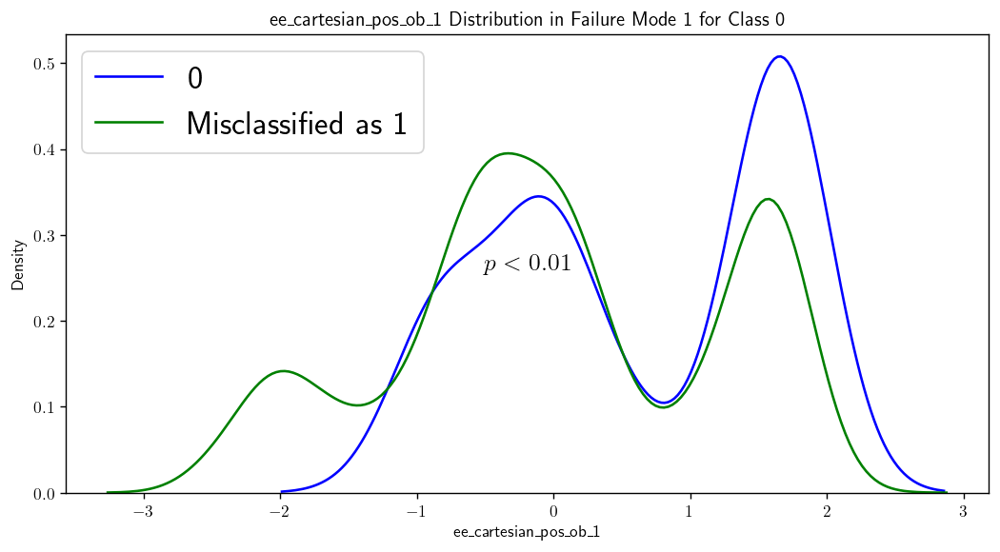

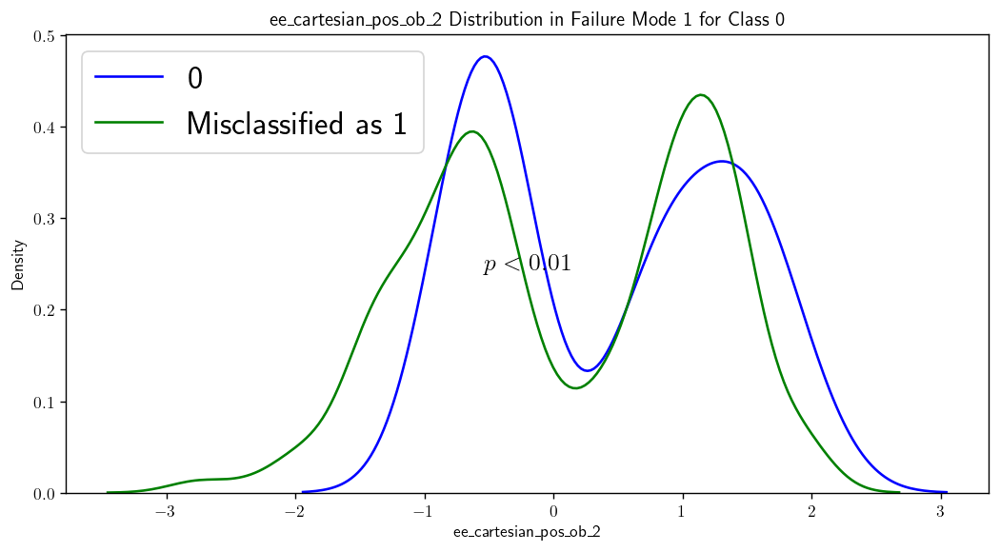

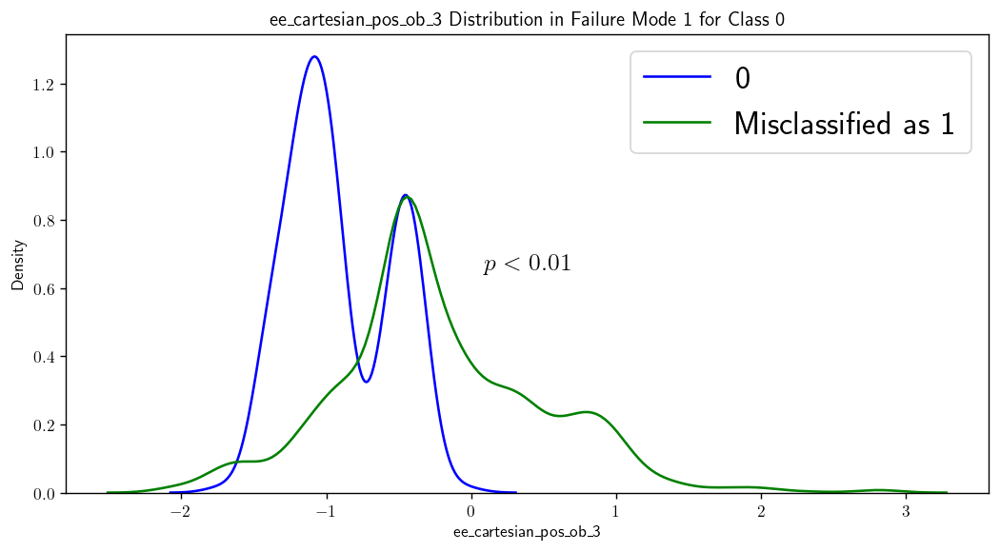

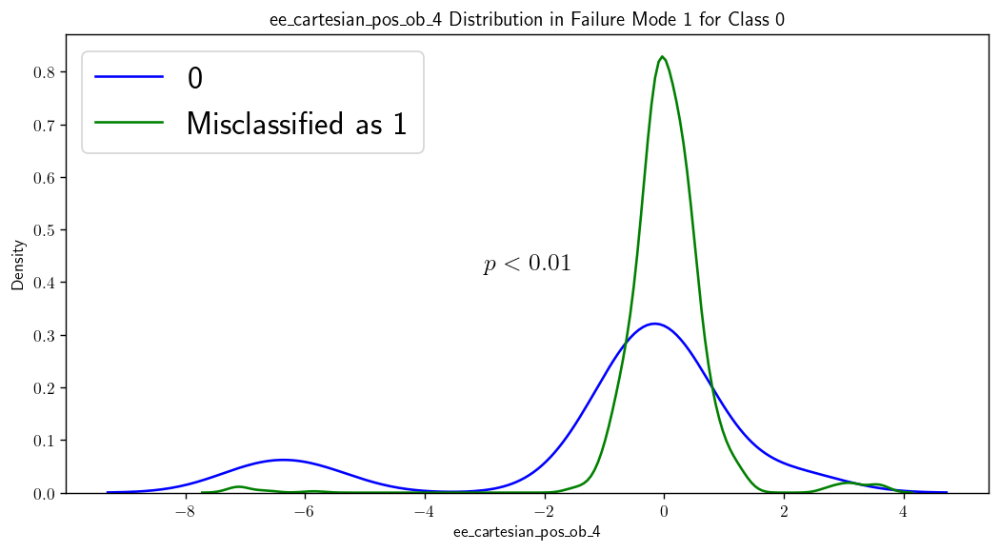

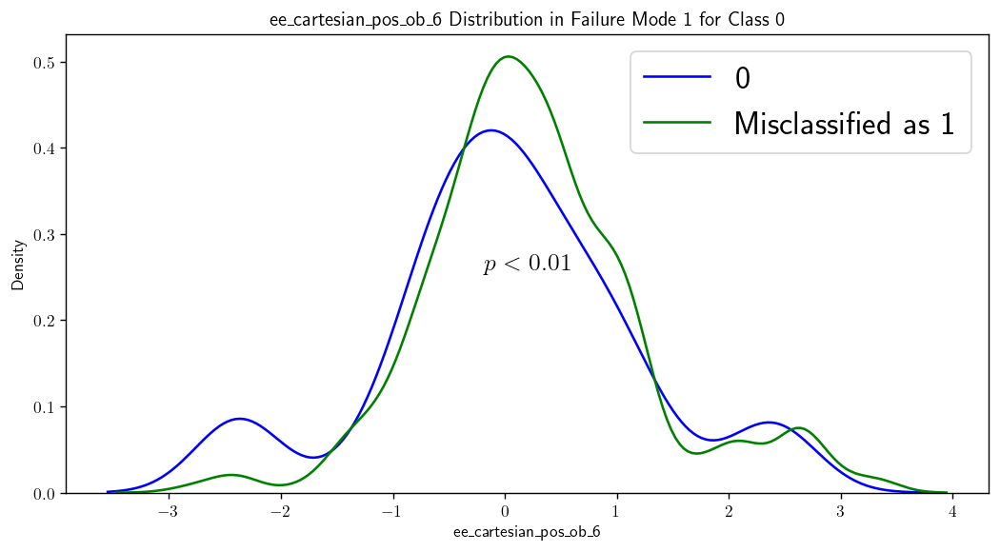

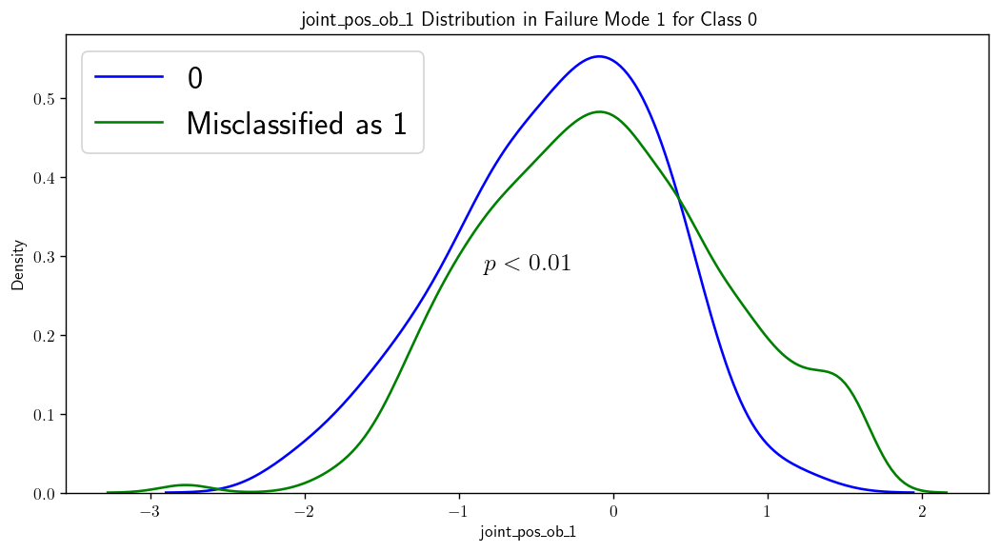

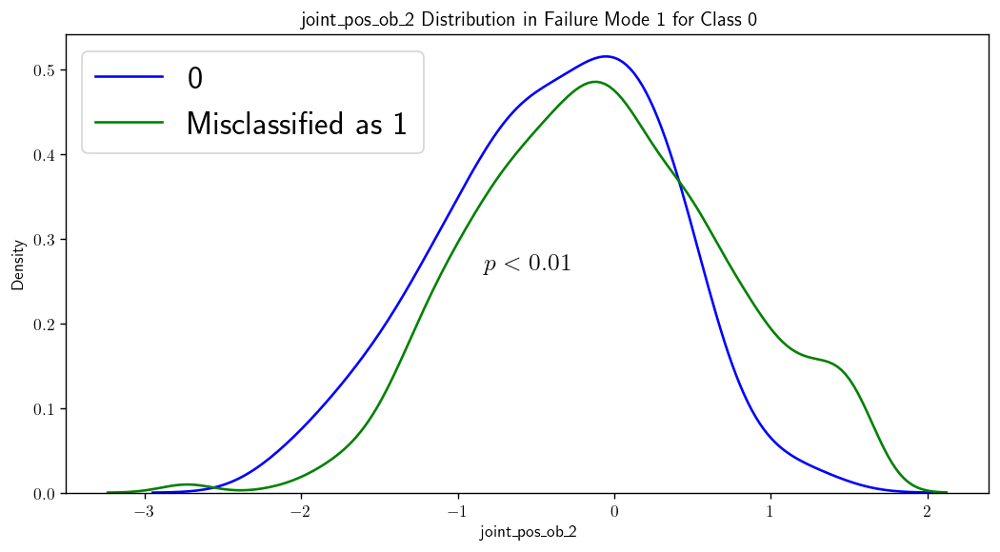

In [75]:
print('------------ FAILURE MODE 1 ------------')
print('------------ CLASS 0 ------------')
for i, feature in enumerate(feature_names):
    plot_feature_fail_mode_dist(train_inputs['obs'][:, i], train_true_grp, train_pred_grp, feature_name=feature, true_label=0, pred_label=1)

**Figure 19.** For each of the Cartesian coordinate predictors, distribution (as estimated through KDE) of the correctly classified class 0 samples and those misclassified as 1. Only those distributions with significant statistical differences are shown.

------------ CLASS 2 ------------


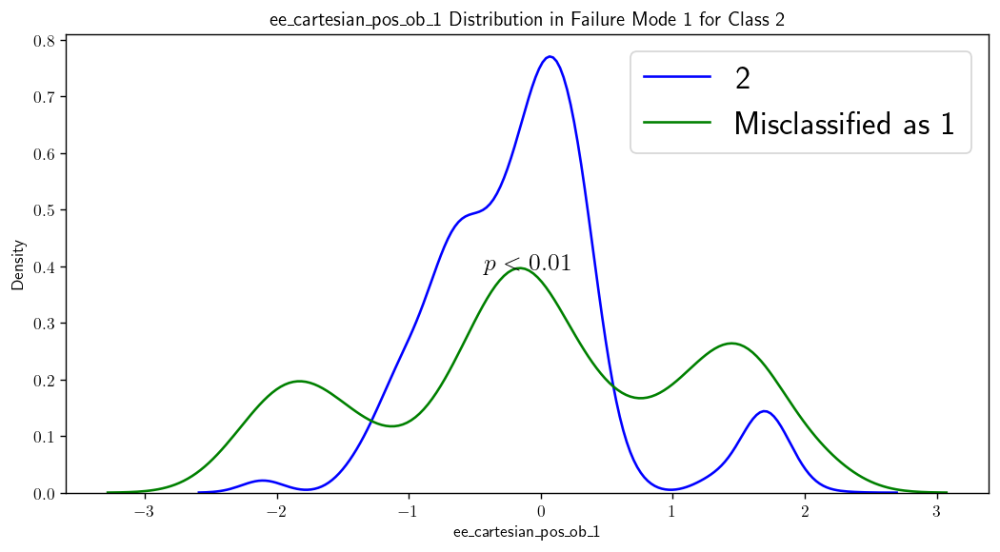

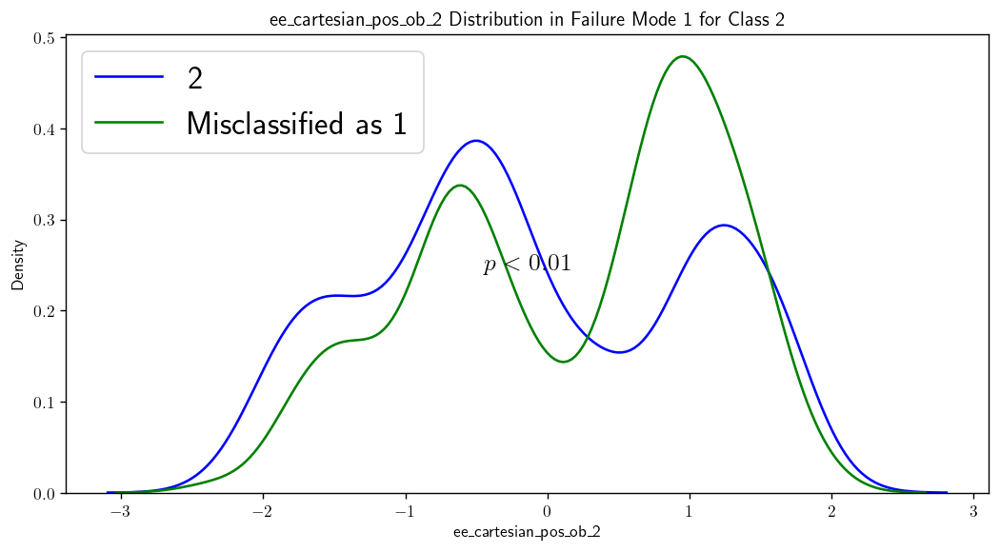

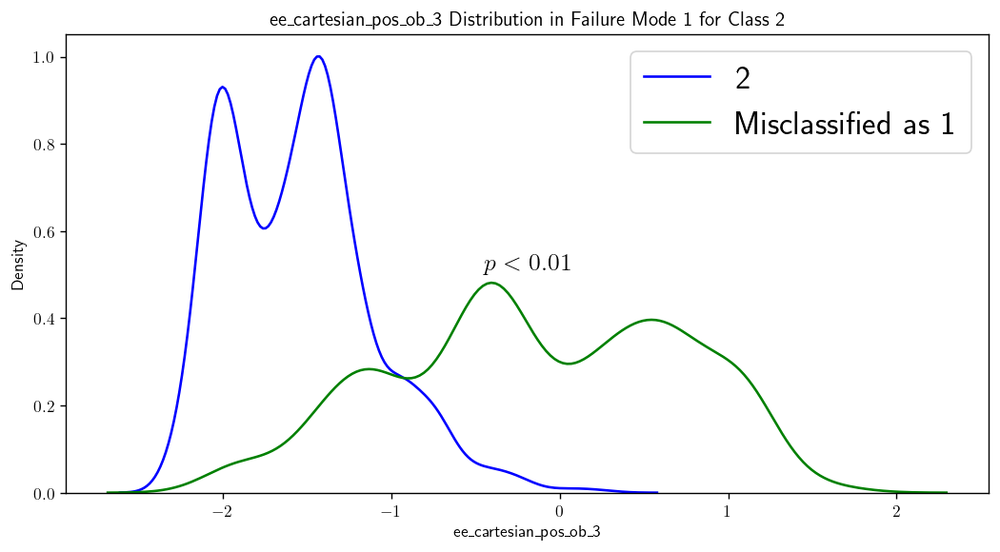

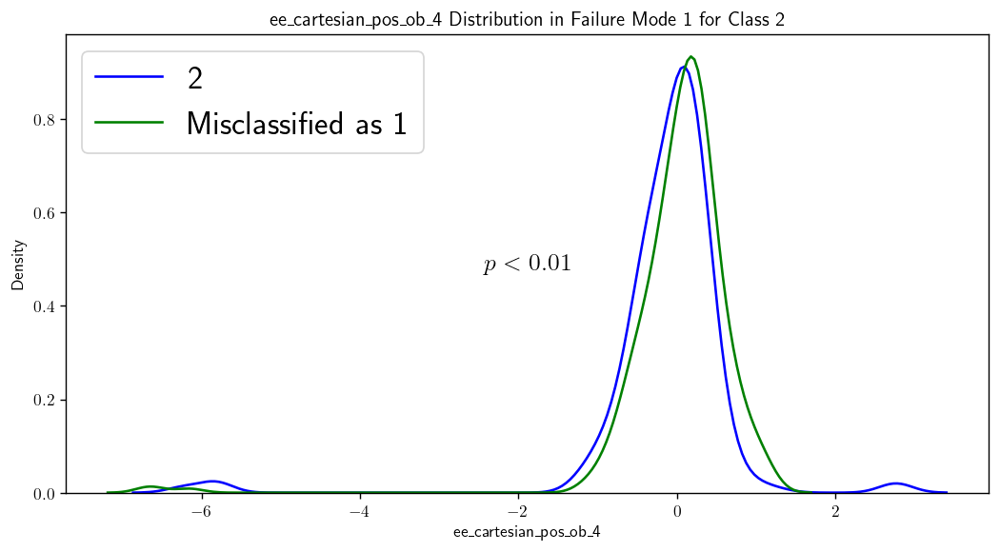

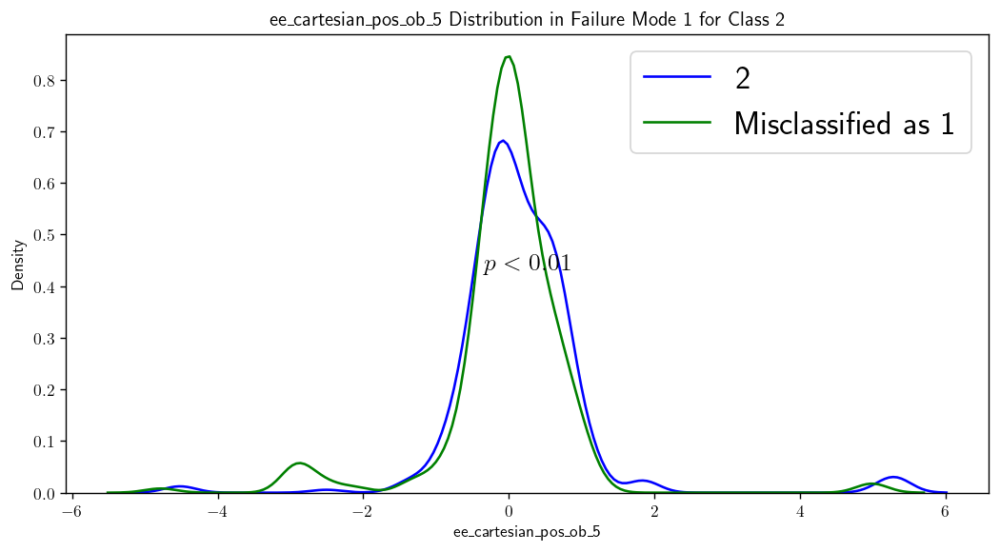

...

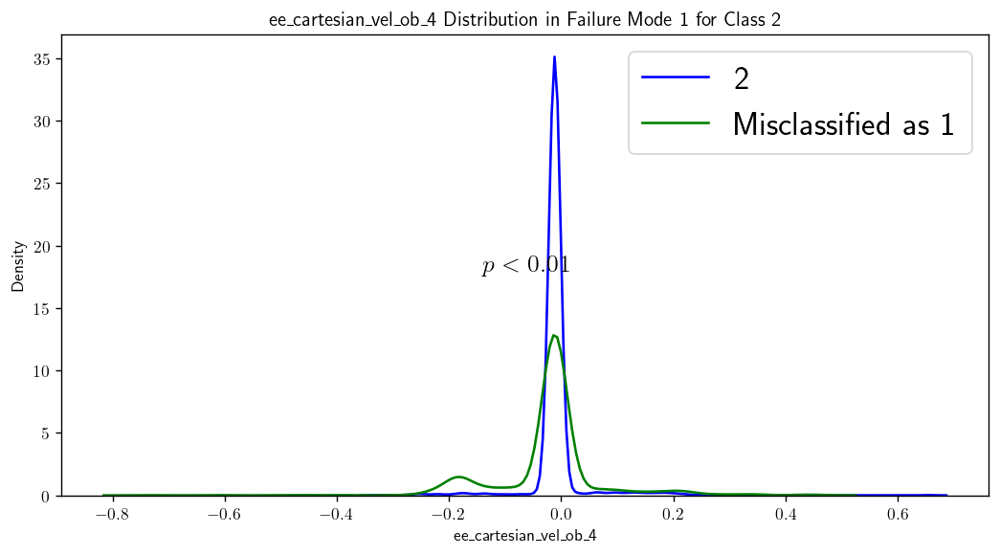

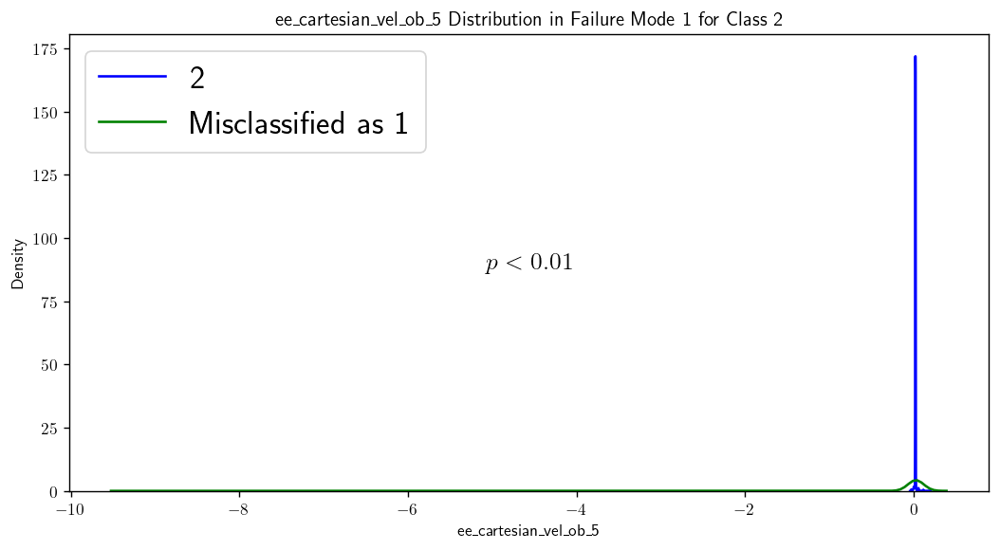

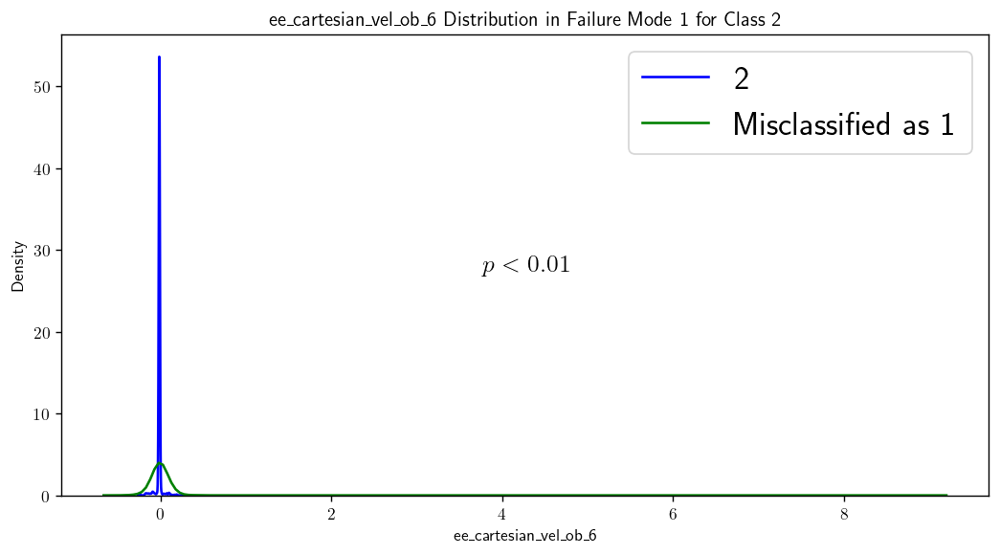

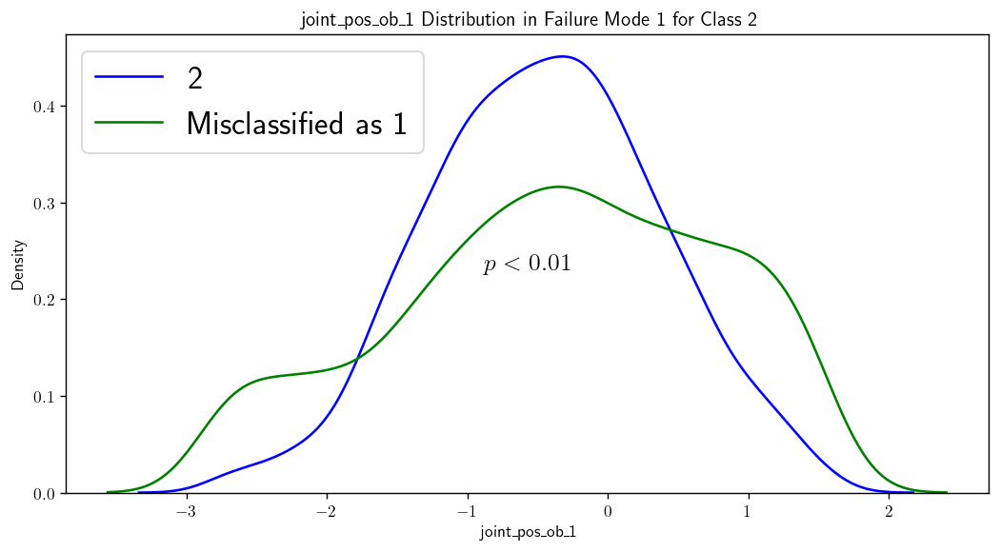

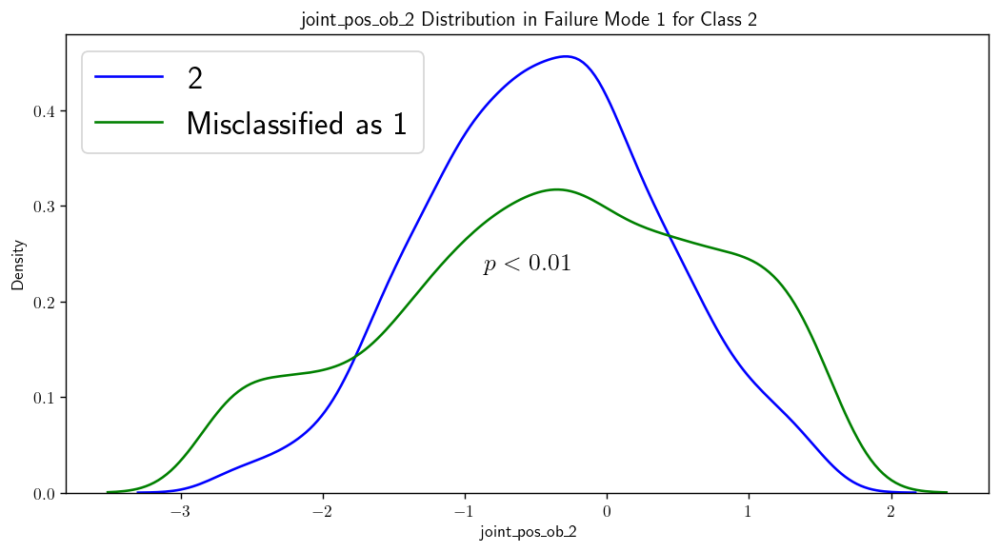

In [76]:
print('------------ CLASS 2 ------------')
for i, feature in enumerate(feature_names):
    plot_feature_fail_mode_dist(train_inputs['obs'][:, i], train_true_grp, train_pred_grp, feature_name=feature, true_label=2, pred_label=1)

**Figure 20.** For each of the Cartesian coordinate predictors, distribution (as estimated through KDE) of the correctly classified class 2 samples and those misclassified as 1. Only those distributions with significant statistical differences are shown.

------------ FAILURE MODE 2 ------------
------------ PREDICTED CLASS 2 ------------


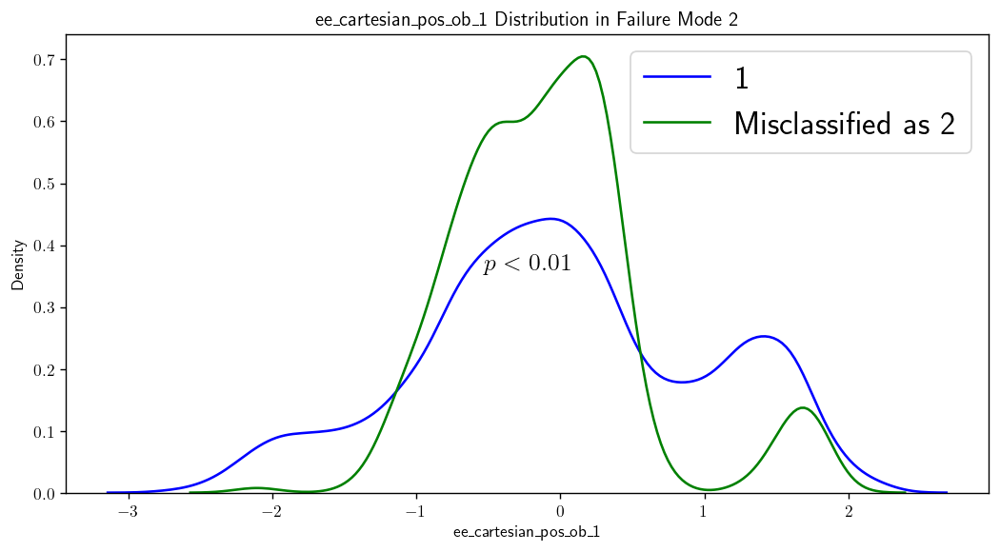

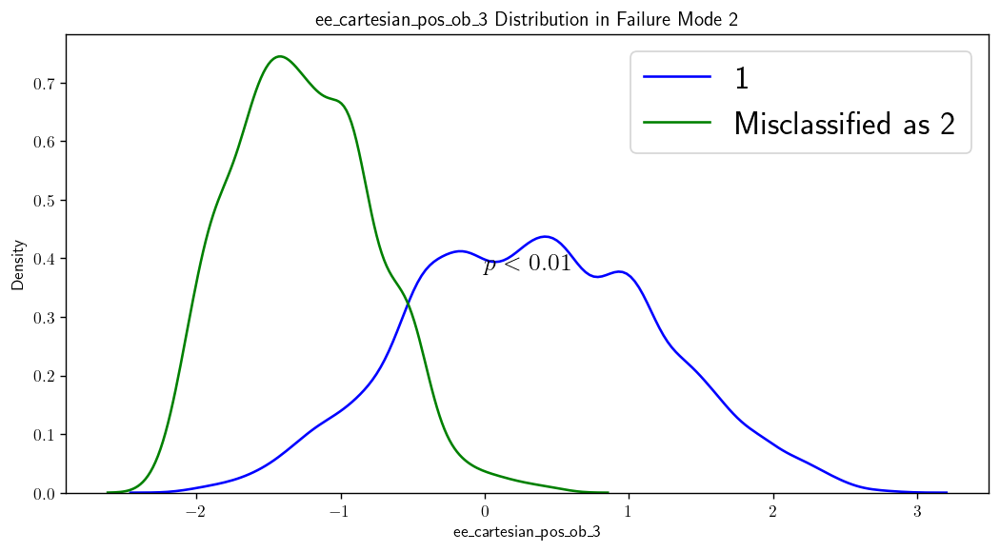

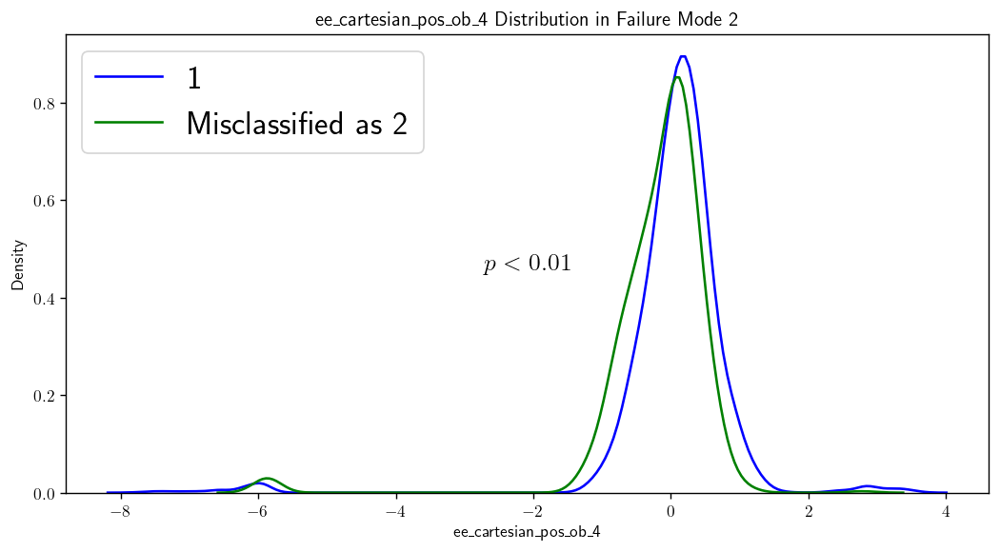

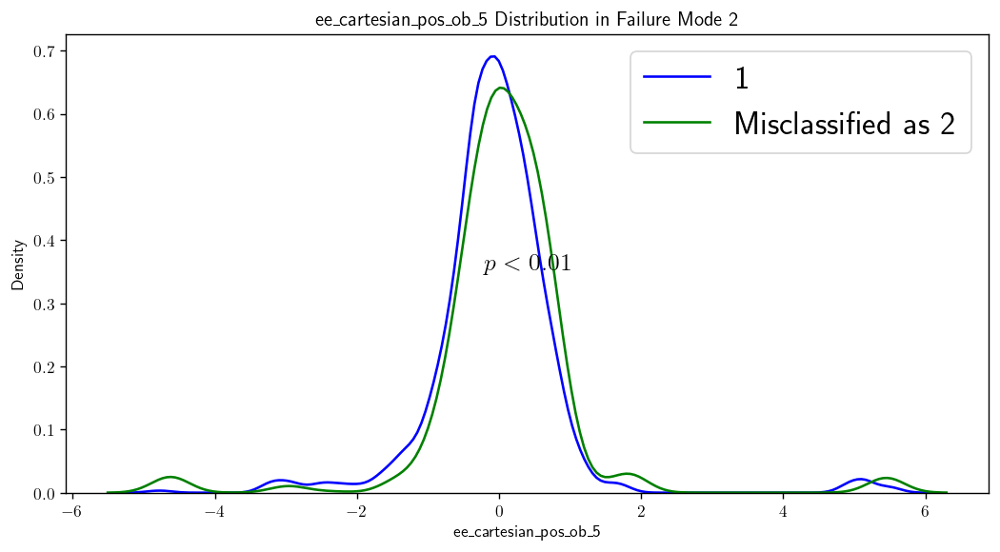

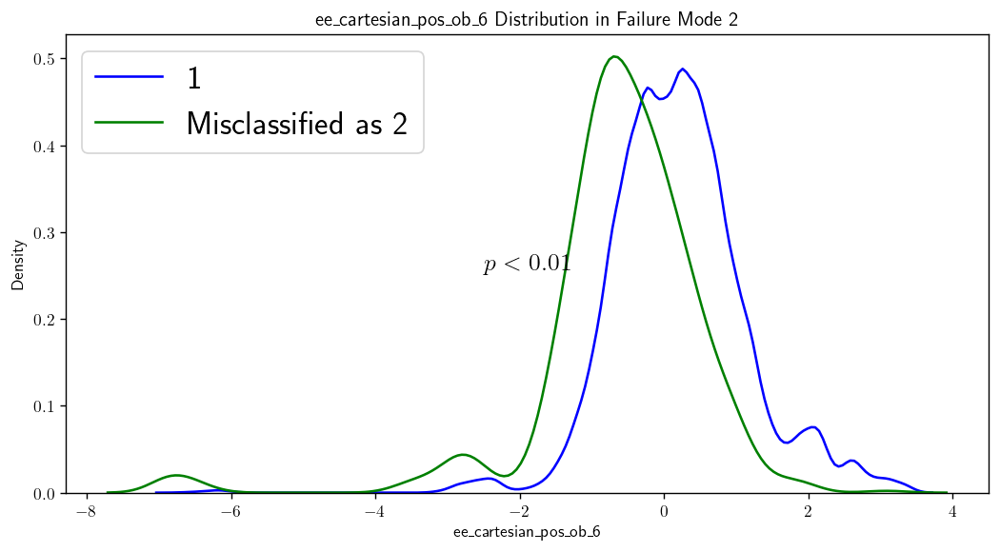

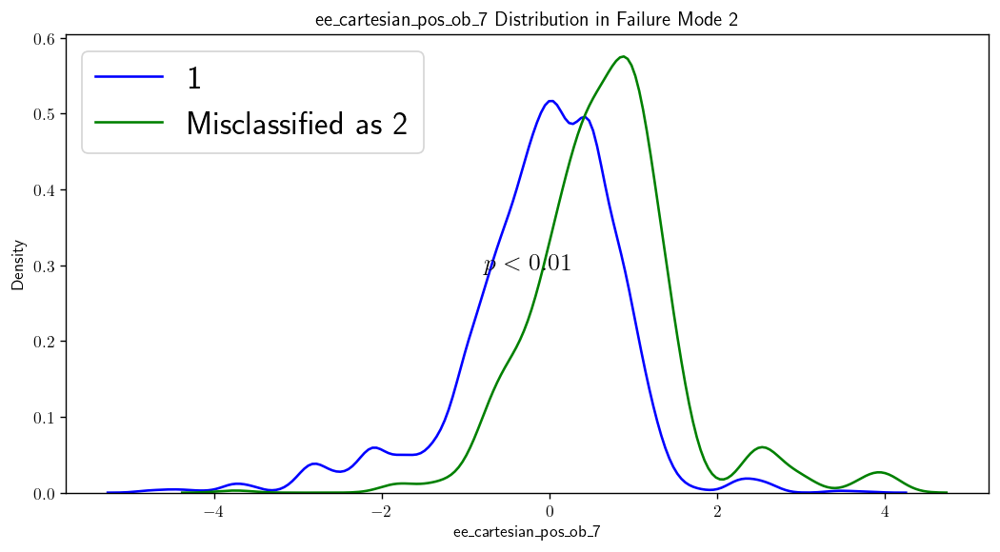

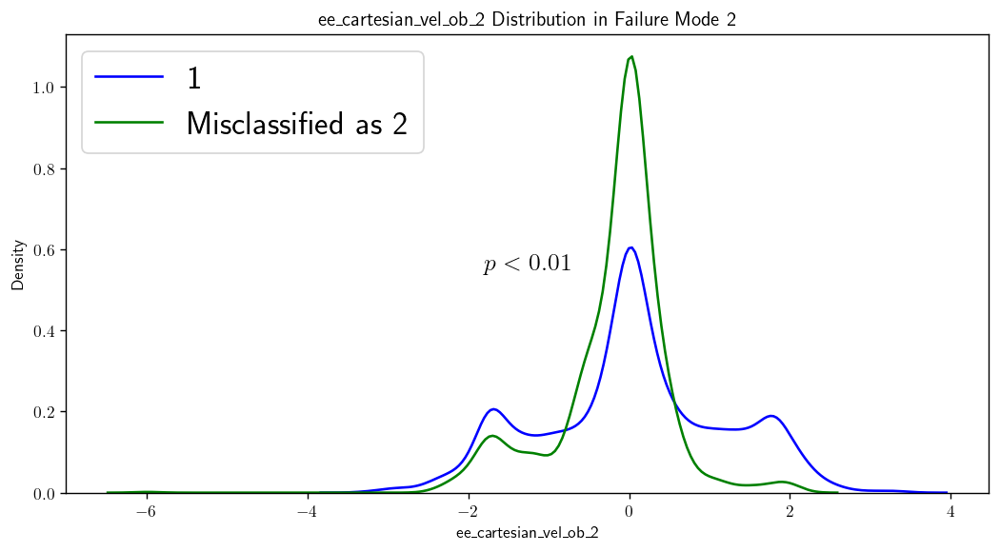

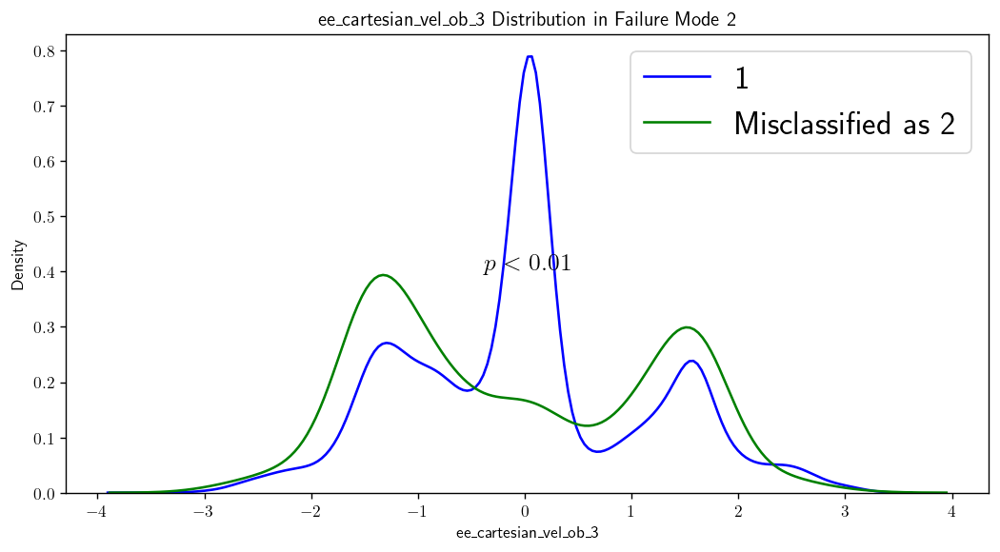

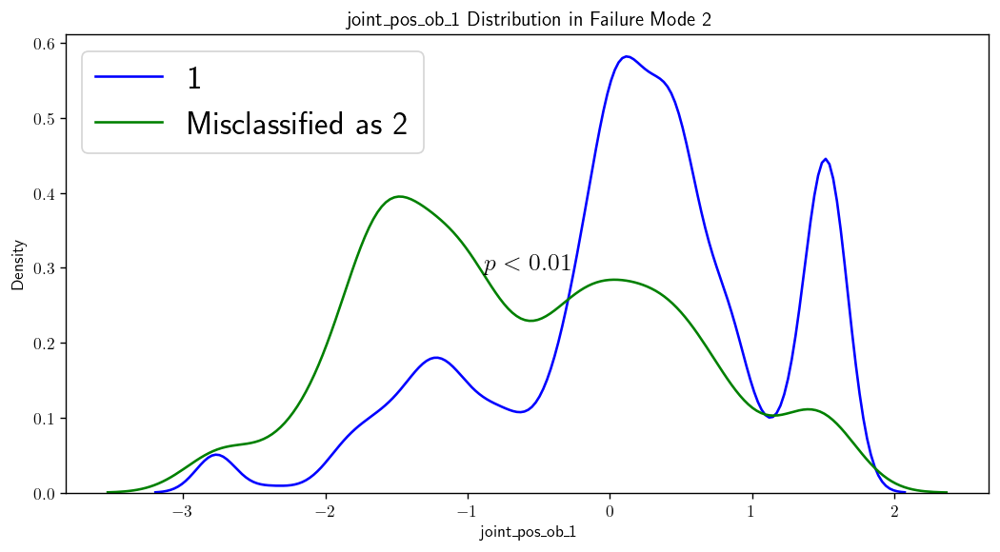

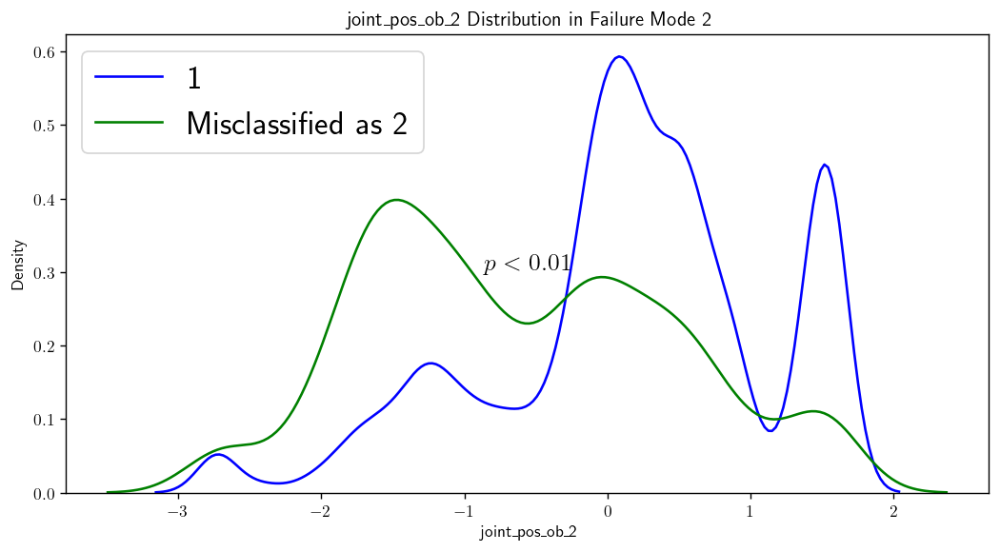

In [77]:
print('------------ FAILURE MODE 2 ------------')
print('------------ PREDICTED CLASS 2 ------------')
for i, feature in enumerate(feature_names): 
    plot_feature_fail_mode_dist(train_inputs['obs'][:, i], train_true_grp, train_pred_grp, feature_name=feature, true_label=1, pred_label=2)

**Figure 21.** For each of the Cartesian coordinate predictors, distribution (as estimated through KDE) of the correctly classified class 1 samples and those misclassified as 2. Only those distributions with significant statistical differences are shown.

Let us analyze the results by Failure Mode:

**Failure Mode 1**:
-   _Class 0_: significantly different distributions are found for `ee_cartesian_pos_ob_1-4/6` and both `joint_pos_ob` features. The curves for the Cartesian positions have the same qualitative shape, although `ee_cartesian_pos_ob_3` presents large visual differences. The joint position distributions present slightly different shapes. Positive x-axis positions seem more frequent in the misclassified samples.

-   _Class 2_: all but the `ee_cartesian_vel_ob_2` feature have significantly different distributions, although the curve shapes are very similar in all cases. Only the feature `ee_cartesian_pos_ob_3` can be seen to differ comparatively more (true values being more negative). Therefore, a systematic difference between features is hard to extract.

**Failure Mode 2**:

-   _Predicted Class 2_: significantly different distributions are found for `ee_cartesian_pos_ob_1/3-7`, `ee_cartesian_vel_ob_2/3` and both `joint_pos_ob` features. The largest qualitative difference was found in `ee_cartesian_pos_ob_3`, matching the results from class 2 in Failure Mode 1. Here, misclassifications were more negative, therefore matching the true class 2 distribution.

In conclusion, `ee_cartesian_pos_ob_3` seems to drive misclassifications in both falire modes, specially regarding the relationship between type-1 and type-2 actions. Therefore, the feature could be a model confounder. Other features were also significantly differently distributed between the correctly and incorrectly classified samples, although visual inspection did not allow to identify a general pattern.

Finally, let us analyze the TSNE dimensionality reduction of the images and their relationship with true class, predicted class and in-/correct misclassifications.


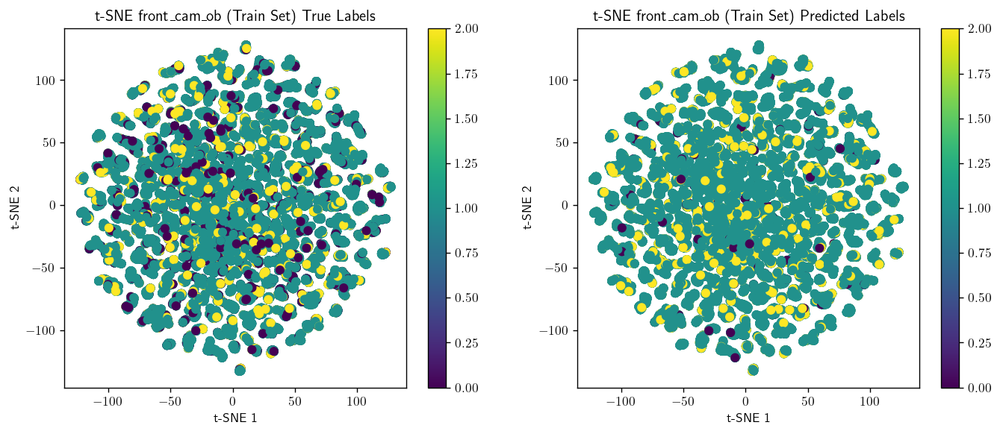

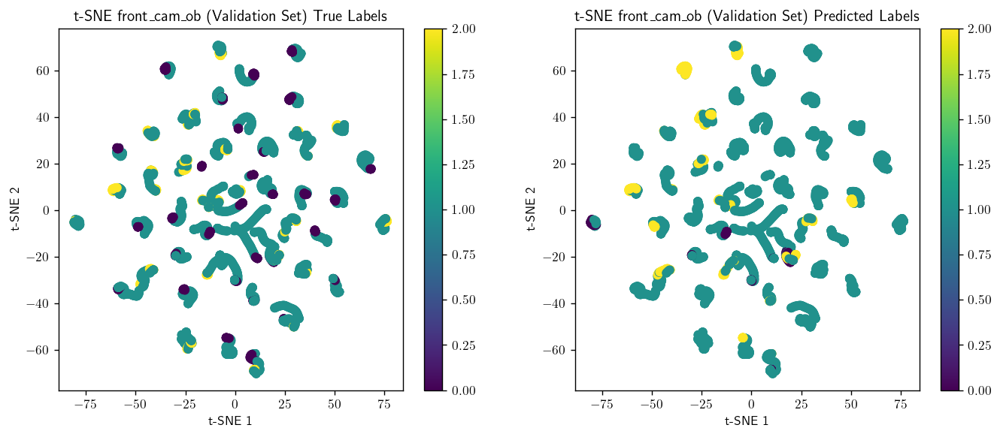

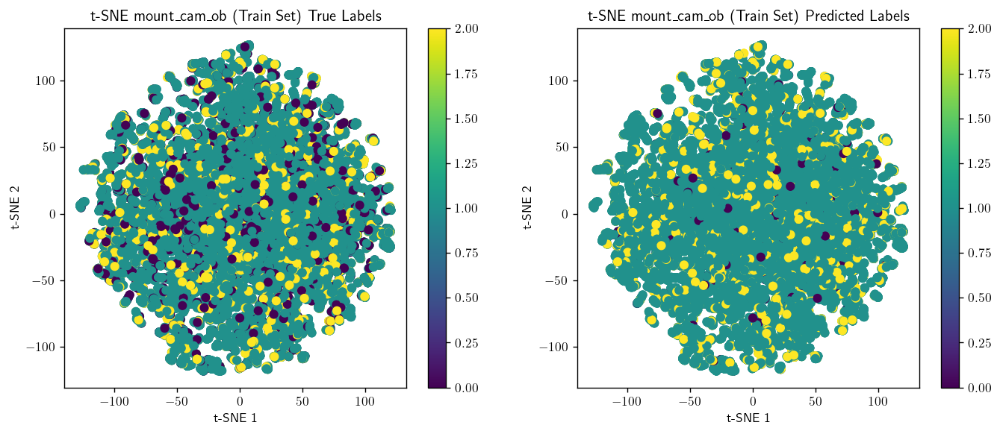

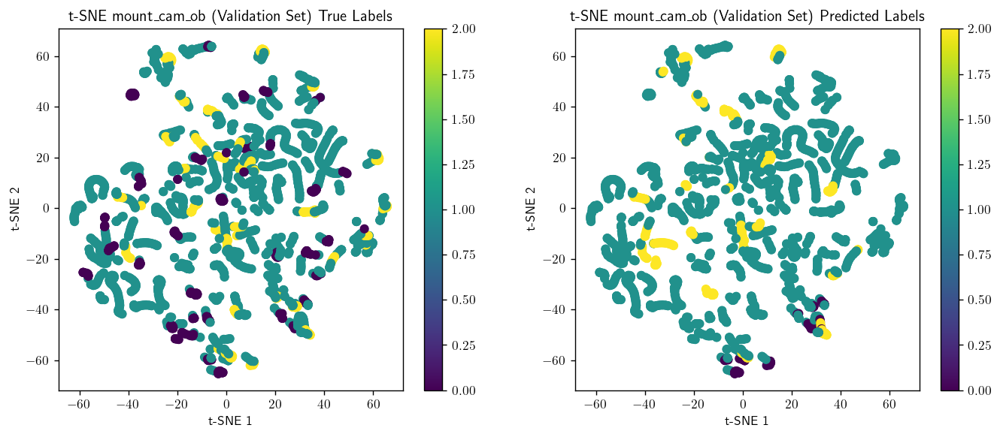

In [80]:
def TSNE_actions(true_labels, pred_labels, title, data=None, tsne_given=False, tsne_obj = None):
    #Function to plot the t-SNE plot
    #Inputs: data, labels, title
    #Outputs: t-SNE plot

    fig, axs = plt.subplots(1, 2, figsize=(13, 5))
    if not tsne_given:
        tsne = TSNE(n_components=2, random_state=0)
        tsne_obj = tsne.fit_transform(data)

    h0 = axs[0].scatter(tsne_obj[:, 0], tsne_obj[:, 1], c=true_labels, cmap='viridis')  
    axs[0].set_title(title + ' True Labels')
    axs[0].set_xlabel('t-SNE 1')
    axs[0].set_ylabel('t-SNE 2')
    fig.colorbar(h0, ax=axs[0])

    h1 = axs[1].scatter(tsne_obj[:, 0], tsne_obj[:, 1], c=pred_labels, cmap='viridis')
    axs[1].set_title(title + ' Predicted Labels')
    axs[1].set_xlabel('t-SNE 1')
    axs[1].set_ylabel('t-SNE 2')
    fig.colorbar(h1, ax=axs[1])
    plt.show()

    return tsne_obj

tsne_obj = np.load('tsne_dict.npy', allow_pickle=True).item()
titles = ['t-SNE front_cam_ob (Train Set)', 't-SNE front_cam_ob (Validation Set)', 't-SNE mount_cam_ob (Train Set)', 't-SNE mount_cam_ob (Validation Set)']

for i, title in enumerate(titles):

    if 'front_cam_ob' in title:
        channel = 0
    
    else:
        channel = 1
    
    if 'Train' in title:
        data = train_inputs['images'][:, channel].reshape(train_inputs['images'].shape[0], -1)
        true_labels = train_true_grp
        pred_labels = train_pred_grp
    
    elif 'Validation' in title:
        data = val_inputs['images'][:, channel].reshape(val_inputs['images'].shape[0], -1)
        true_labels = val_true_grp
        pred_labels = val_pred_grp
    
    tsne = TSNE_actions(true_labels, pred_labels, title, tsne_given=True, tsne_obj=tsne_obj[title])

**Figure 22.** t-SNE reduction of the dataset's images colored by true (left) and predicted (right) labels. The two first rows correspond to `front_cam_ob` images in the training (top) and validation (bottom) sets. The last two correspond to the `mount_cam_ob` images.

And finally, stratifying by correct or incorrect classification on the right-most plot, for each variable and set:

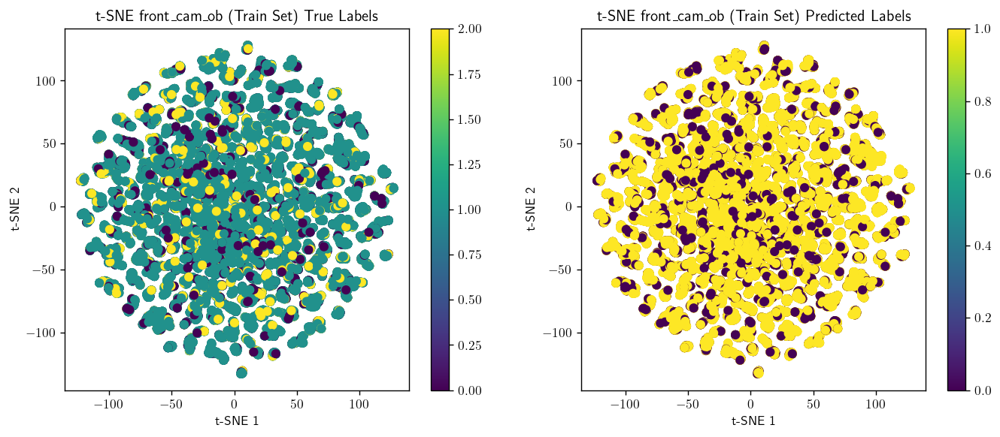

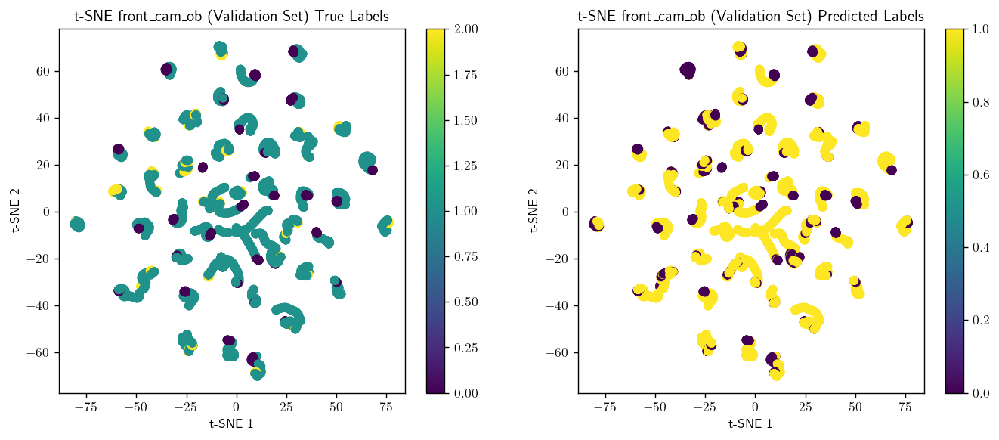

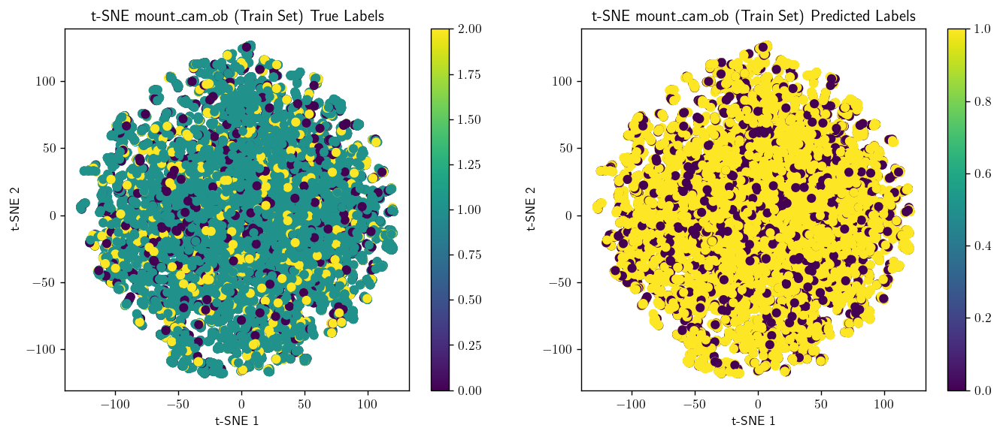

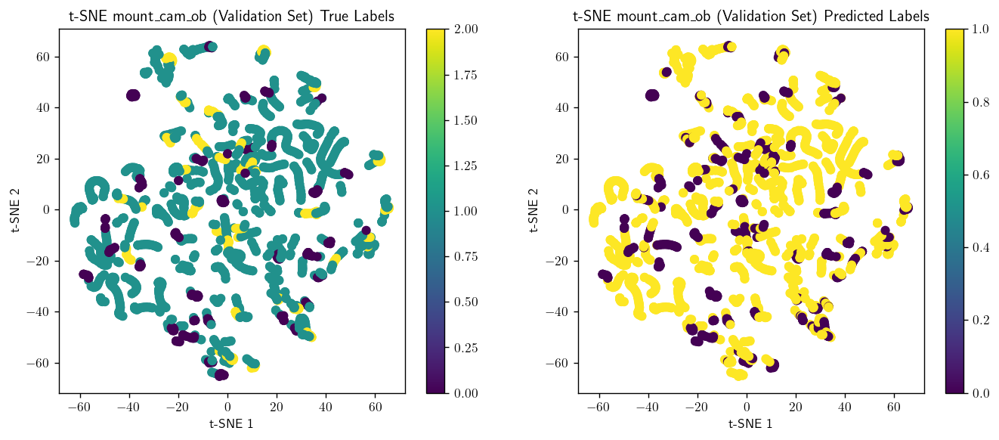

In [81]:
for i, title in enumerate(titles):

    if 'front_cam_ob' in title:
        channel = 0
    
    else:
        channel = 1
    
    if 'Train' in title:
        data = train_inputs['images'][:, channel].reshape(train_inputs['images'].shape[0], -1)
        true_labels = train_true_grp
        #Change train_pred_grp to 0, 1 depending on correct (1) or incorrect classification
        correct = np.where(train_true_grp == train_pred_grp)
        train_pred_grp_new = np.zeros(len(train_true_grp))
        train_pred_grp_new[correct] = 1
        pred_labels = train_pred_grp_new

    
    elif 'Validation' in title:
        data = val_inputs['images'][:, channel].reshape(val_inputs['images'].shape[0], -1)
        true_labels = val_true_grp
        correct = np.where(val_true_grp == val_pred_grp)
        val_pred_grp_new = np.zeros(len(val_true_grp))
        val_pred_grp_new[correct] = 1
        pred_labels = val_pred_grp_new
    
    tsne = TSNE_actions(true_labels, pred_labels, title, tsne_given=True, tsne_obj=tsne_obj[title])

**Figure 23.** t-SNE reduction of the dataset's images colored by true (left) labels and correct(1)/incorrect(0) classification (right). The two first rows correspond to `front_cam_ob` images in the training (top) and validation (bottom) sets. The last two correspond to the `mount_cam_ob` images.

From the observed figures, the following conclusions arose:

- The images' TSNE reduction does not show any clusters exclusively related to a single type of image -as defined by the subsequent gripper action-. 
- As observed previously, class 0 observations are the least correctly captured by the model in both sets.
- The images' TSNE reduction does not show any cluster of misclassifications, they seem to be randomly spread around the reduced image space, specially in the training set.
- The evidence does not support model failure modes being accounted by the nature of the input images analyzed through dimensionality reduction. Further study could involve manual exploration of the images and the generation of saliency maps through the backpropagation of gradients. This would however require a large effort which would be difficult to then translate to change in model architectures. Furthermore, the fact that image characteristics do not seem to be impacting model performance could be due to the combination of information before the final classifier, which likely blurs the information contained by both observation types.

For the final analysis, let us also evaluate the relationship between the RMSE and model failure in the gripper action: does the model usually fail on both, or are the errors uncorrelated?

In [85]:
#Compute a vector of misclassifications (0 if correctly classified, 1 if misclassified) 
miss_vector_train = np.zeros(len(train_true_grp))
misclassifications_train = np.where(np.array(train_true_grp) != np.array(train_pred_grp))[0]
miss_vector_train[misclassifications_train] = 1

miss_vector_val = np.zeros(len(val_true_grp))
misclassifications_val = np.where(np.array(val_true_grp) != np.array(val_pred_grp))[0]
miss_vector_val[misclassifications_val] = 1

#Correlation between RMSE and misclassification
corr_rmse_miss_train = pearsonr(rmse_vec_train, miss_vector_train)
print('Train RMSE vs Misclassification Correlation:', round(corr_rmse_miss_train[0], 4), 'p-value:', corr_rmse_miss_train[1])

corr_rmse_miss_val = pearsonr(rmse_vec_val, miss_vector_val)
print('Validation RMSE vs Misclassification Correlation:', round(corr_rmse_miss_val[0], 4), 'p-value:', round(corr_rmse_miss_val[1],4))

Train RMSE vs Misclassification Correlation: -0.0694 p-value: 1.4318157721153626e-28
Validation RMSE vs Misclassification Correlation: -0.0259 p-value: 0.1625


The small values of the correlations (-0.07, -0.02 for training and validation sets, respectively), while significant, don't indicate a systematic relationship between the errors in the Cartesian delta and the gripper action prediction failures.

This comprehensive study indicated that:

1. Class imbalance is likely driving the main Failure Modes.
2. Some Cartesian observations (`ee_cartesian_pos_ob_2` and `ee_cartesian_vel_ob_3`) may be related to the RMSE and the gripper action failures. On the other hand, image clusters in the TSNE embeddings do not relate to RMSE, cosine similarity, true class, predicted class or mis-/correct classificationns.

### Question 1.c Model tuning
Now you have evaluated the proposed model, you are required to iterate and train a higher performing one. You are expected to run experiments that help you understand where the model is underperforming, guiding your development.

#### Question 1.c.i Model tuning (5 marks)
##### Task
- Using the code blocks below, implement a model which improves over the previous. Improve the performance as best you can and report the results using the metric/metrics you used in question 1.b.ii Model evaluation. Markers should be able to retrain your model by running the cell below. You may however, reference previously defined objects (e.g., loaded data and use previously defined functions).

The final fine-tuned model consisted in the same layer architecture as the baseline with the introduction of weight decay (= .01), batch normalization layers and ReLU layers, as documented in Question 1.c.ii.ii. All hyper-parameters remained equal to baseline, except for the batch size which was increased to 128. 

As detailed in the next sections, the model could not be improved upon by either the introduction of complexity (increasing the number of convolutional/dense layers), nor concatenating the encoded features, nor by inputting the Cartesian observations directly to the dense layer, nor any hyper-parameter change (weight decay, dropouts, learning rate scheduler, target offset) or class weights, nor by eliminating hypothesized confounding features. The code to train and evaluate the proposed model can be found below. 

_NOTE_: If the reader is interested in re-training the model, please set `run_new_eval` to `True`. If not, the model `E2E_WD_BN` will be loaded from the `trained_models` folder and re-evaluated, showing the currently presented results.

In [26]:
def model_evaluation(model, train_dataloader, val_dataloader, exp_kwargs, run_new_eval, folder, wandb_run_dir=None, display_results=True, pos_criterion=nn.MSELoss(), grp_criterion=nn.CrossEntropyLoss(), train_losses = [], val_losses = [], xlim_rmse = [0, 4], first_epoch = 0, test=False):

    #1. Create folder of model if necessary
    new_folder = os.path.join("trained_models/", folder)
    if os.path.exists(new_folder):
        pass
    else:
        os.mkdir(new_folder)

    #2. Plot loss evolution
    file_train = f"train_losses_e2e_{folder}.npy"
    file_val = f"val_losses_e2e_{folder}.npy"

    
    if run_new_eval:
        plot_losses(train_losses, val_losses, first_epoch=first_epoch, test=test)
        np.save(os.path.join(new_folder, file_train), train_losses)
        np.save(os.path.join(new_folder, file_val), val_losses)

    else:
        #Load the losses from the previous run
        train_losses = np.load(os.path.join(new_folder, file_train))
        val_losses = np.load(os.path.join(new_folder, file_val))
        plot_losses(train_losses, val_losses, first_epoch=first_epoch, test=test)
    

    #3. Save/load model
    model_file = f"best_epoch_e2e_{folder}.pt"
    if run_new_eval:
        best_epoch = early_stopping(val_losses) + 1
        loc = os.path.join(wandb_run_dir, "agent_checkpoints")
        state_dict = torch.load(os.path.join(loc, f"mdl_chkpnt_epoch_{best_epoch}.pt"), weights_only=True)['model_state_dict']
        if project_options.debug:
            model_file = f"best_epoch_e2e_{folder}_debug.pt"
            torch.save(state_dict, os.path.join(new_folder, model_file))
        else:
            torch.save(state_dict, os.path.join(new_folder, model_file))
        model.load_state_dict(state_dict)

    else:
        if project_options.debug:
            if MAC: 
                model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_e2e_{folder}_debug.pt"), weights_only=True))
            else:
                model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_e2e_{folder}_debug.pt"), map_location=torch.device('cpu'), weights_only=True))
        else:
            if MAC:
                model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_e2e_{folder}.pt"), weights_only=True))
            else:
                model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_e2e_{folder}.pt"), map_location=torch.device('cpu'), weights_only=True))

    #Evaluate the model on the training and validation sets
    train_criterion_eval = TrackerBalancedLoss(
        loss_lkp={
            "pos":copy.deepcopy(pos_criterion),
            "grp":copy.deepcopy(grp_criterion)
        },
        name="train",
        mo=None
        )

    val_criterion_eval = TrackerBalancedLoss(
        loss_lkp={
            "pos":copy.deepcopy(pos_criterion),
            "grp":copy.deepcopy(grp_criterion)
        },
        name="val",
        mo=None
        )

    evaluate_model_fn = ValidateSingleEpoch(half_precision=exp_kwargs["half_precision"], cache_preds=True, cache_inputs=True)
    train_loss, train_preds, train_true, train_inputs = evaluate_model_fn(model=model, data_loader=train_dataloader, gpu=True, mac=MAC, criterion=train_criterion_eval)
    val_loss, val_preds, val_true, val_inputs = evaluate_model_fn(model=model, data_loader=val_dataloader, gpu=True, mac=MAC, criterion=val_criterion_eval)
    

    if display_results:
        #Display the RMSE and cosine similarity for the coordinate deltas
        print('------------ COORDINATE DELTAS ------------')
        rmse_vec_train, rmse_vec_val, cos_vec_train, cos_vec_val = visualize_regression_performance(train_true, train_preds, val_true, val_preds, xlim_rmse = xlim_rmse)

        #Display the classification report for the gripper actions
        print('------------ GRIPPER ACTIONS ------------')
        train_true_grp = undo_one_hot_encoding(train_true['grp'])
        train_pred_grp = compute_predicted_class(train_preds['grp'])
        val_true_grp = undo_one_hot_encoding(val_true['grp'])
        val_pred_grp = compute_predicted_class(val_preds['grp'])

        fig, ax = plt.subplots(1, 2, figsize=(15, 5))   
        display_sklearn_reports(train_true_grp, train_pred_grp, 'Train', fig=fig, ax=ax[0])
        display_sklearn_reports(val_true_grp, val_pred_grp, 'Validation', fig=fig, ax=ax[1])
        
    return train_preds, train_true, val_preds, val_true, train_inputs, val_inputs, rmse_vec_train, rmse_vec_val, cos_vec_train, cos_vec_val, train_true_grp, train_pred_grp, val_true_grp, val_pred_grp

In [27]:
#Experiment 2: Regularization
#A. Add weight_decay to optimizer
#B. Add batch norm layers and standardize the input features to the dense layer

cnn_config_reg = ConvolutionLayersConfig(
   # 2x224x224 --> 8x112x112 --> 16x56x56 --> 32x28x28 
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=8,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.BatchNorm2d(8),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=8,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.BatchNorm2d(16),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.BatchNorm2d(32),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
        ]
    )

_cnn_output_dim = cnn_config_reg.get_output_dims() #28x28
_cnn_output_channels = cnn_config_reg.get_output_channels() #32
_mlp_input_dim = int(
            (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1] #28x28x32
            )


image_encoder_reg = JointCNNEncoder(
   #Takes in the encoded images (28x28x32) and outputs a 128D vector
    cnn=CNN(cnn_config_reg),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[256],
        output_dim=128,
        batch_norms=[True],
        actvton=nn.ReLU(),
        fnl_act=nn.ReLU(),
        )
)

obs_encoder_reg = MLP(
   #Takes in the 15D observations from ee_cartesian_pos_ob, ee_cartesian_vel_ob and joint_pos_ob and outputs a 128D vector
    input_dim = 15,
    hidden_dims = [256, 256],
    output_dim = 128,
    batch_norms=[True, True],
    actvton=nn.ReLU(),
    fnl_act=nn.ReLU(),
)

dense_reg = MLP(
    #Takes in the sum of the encoded images and observations and outputs a 6D vector
    input_dim = 128,
    hidden_dims = [64, 32],
    output_dim = 6,
    batch_norms=[True, True],
    actvton=nn.ReLU(),
)

class BaselineRegularized(BaseModel):

  def __init__(
      self,
      image_encoder:JointCNNEncoder,
      obs_encoder:MLP,
      dense:MLP
      ) -> None:
      super().__init__()
      self.image_encoder = image_encoder
      self.obs_encoder = obs_encoder
      self.dense = dense

  def forward(self, images, obs):
    _img_enc = self.image_encoder(images)
    _obs_enc = self.obs_encoder(obs)
    #_input_enc = torch.cat((_img_enc, _obs_enc), dim=1)
    _input_enc = _img_enc + _obs_enc
    bnorm = nn.BatchNorm1d(128).to("mps")
    _input_enc = bnorm(_input_enc)
    _dense_enc = self.dense(_input_enc)
    pos = _dense_enc[:,0:3] #first 3 elements which correspond to cartesian deltas
    grp = _dense_enc[:,3:] #last 3 elements which correspond to gripper actions class probabilities
    return {
        "pos": pos,
        "grp":grp
        } #dictionary with the outputs
  
  def reset(
      self,
      image_encoder_kwargs,
      obs_encoder_kwargs,
      dense_kwargs
      ):
    #Generates new weights for the model through xavier_uniform initialization
    self.image_encoder.reset(**image_encoder_kwargs)
    self.obs_encoder.reset(**obs_encoder_kwargs)
    self.dense.reset(**dense_kwargs)

#Instantiate the model
torch.manual_seed(1)
model_reg = BaselineRegularized(
    image_encoder=image_encoder_reg,
    obs_encoder=obs_encoder_reg,
    dense=dense_reg
)

exp_kwargs = {
    "batch_size": 128,
    "learning_rate": 0.001,
    "half_precision": False,
    "target_offset": 0,
    "epochs": 10,
    "scheduler": False,
    "weight_decay": 0.01
}

train_dataloader, val_dataloader, model_reg, optimizer, __criterion, sl_trainer, train_criterion, val_criterion, mo = prepare_data_for_training(model_reg, exp_kwargs=exp_kwargs, grp_criterion=grp_criterion)

run_new_eval = False

wandb_name="E2E_WD_BN_trial"
wandb_grp="E2E"

if project_options.debug:
    wandb_name = f"{wandb_name}_DEBUG"

if run_new_eval:
    orig = datetime.datetime.now()
    mo, train_losses, val_losses, wandb_run_dir = sl_trainer.training_loop(
        train_loader=train_dataloader,
        val_loader=val_dataloader,
        wandb_proj=WANDB_PROJECT,
        wandb_grp=wandb_grp,
        wandb_config=exp_kwargs,
        wandb_name=wandb_name,
        reset_kwargs={
            "image_encoder_kwargs": {},
            "obs_encoder_kwargs": {},
            "dense_kwargs": {}
        }
        )
    post_train = datetime.datetime.now()

25469
torch.Size([128, 2, 224, 224])
torch.Size([128, 15])
torch.Size([128, 3])
torch.Size([128, 3])
tensor(3.4041, device='mps:0')


Best epoch: 5, Best val loss: 0.40198570489883423


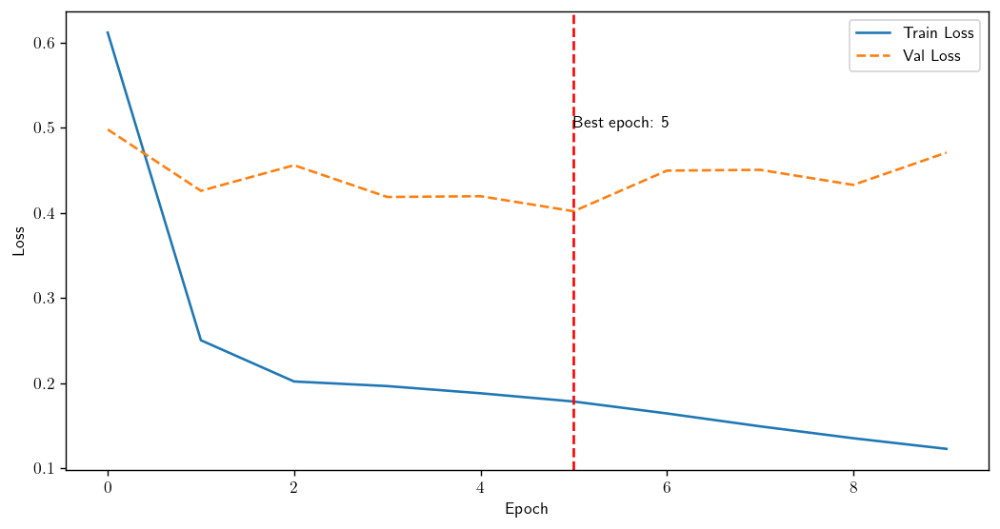

------------ COORDINATE DELTAS ------------


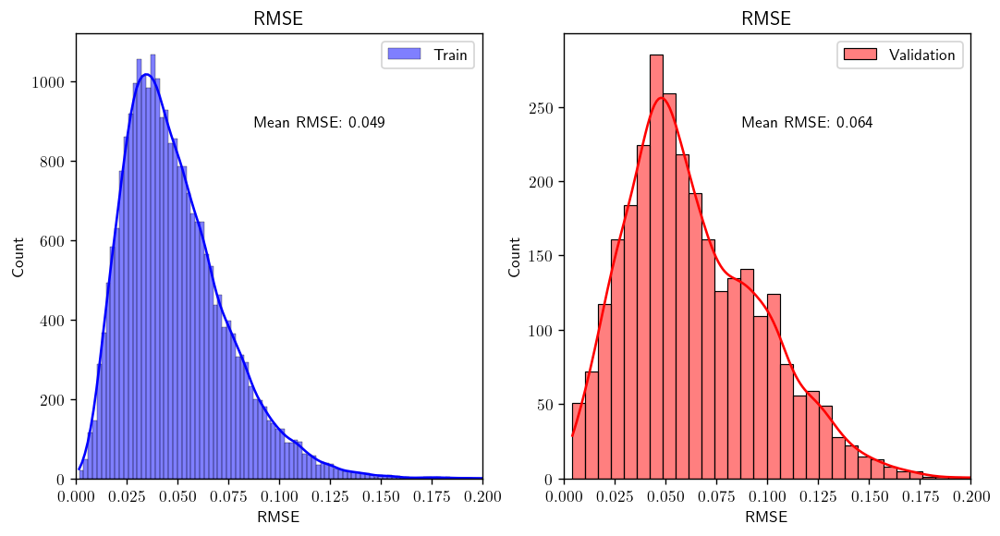

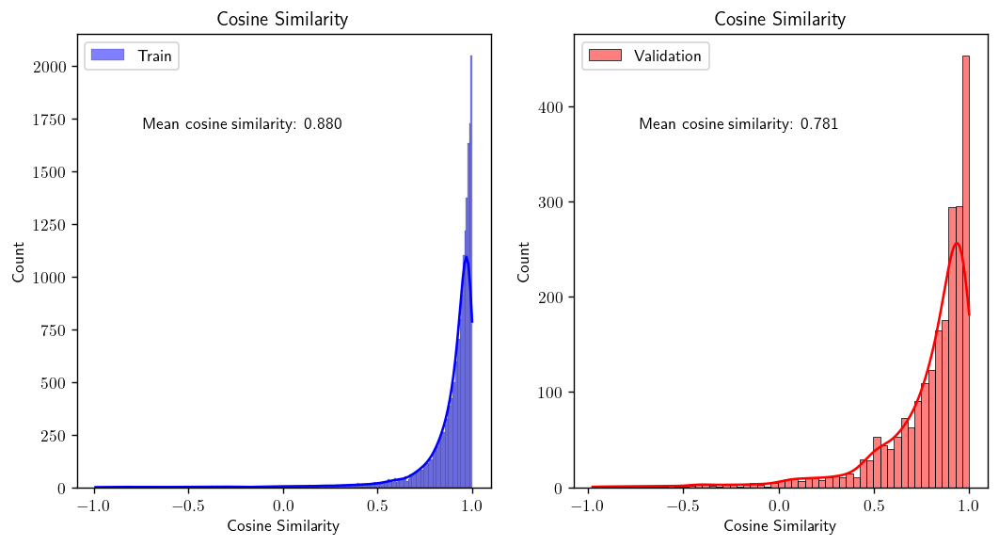

------------ GRIPPER ACTIONS ------------
Classification report for Train set: 
                  precision    recall  f1-score   support

      0 (Close)       0.84      0.87      0.86      3061
1 (Do not move)       0.98      0.98      0.98     19147
       2 (Open)       0.89      0.84      0.86      3261

       accuracy                           0.95     25469
      macro avg       0.90      0.90      0.90     25469
   weighted avg       0.95      0.95      0.95     25469

Classification report for Validation set: 
                  precision    recall  f1-score   support

      0 (Close)       0.64      0.67      0.66       373
1 (Do not move)       0.96      0.98      0.97      2161
       2 (Open)       0.63      0.53      0.57       367

       accuracy                           0.88      2901
      macro avg       0.74      0.72      0.73      2901
   weighted avg       0.87      0.88      0.88      2901



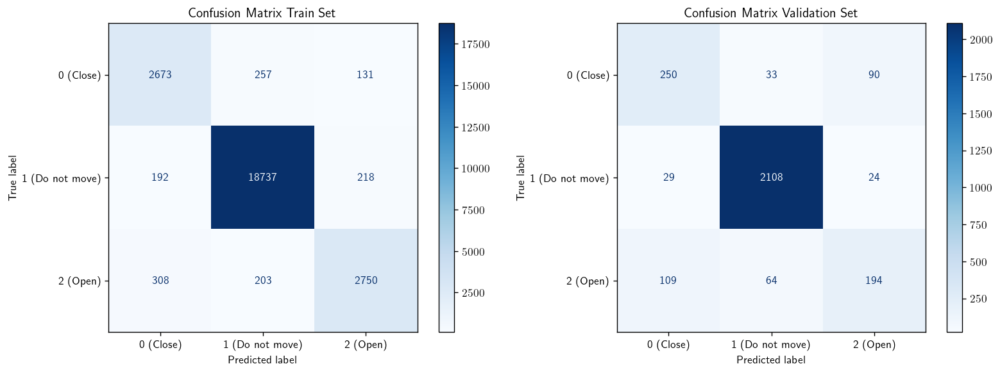

In [88]:
if not run_new_eval:
    train_preds, train_true, val_preds, val_true, train_inputs, val_inputs, rmse_vec_train, rmse_vec_val, cos_vec_train, cos_vec_val, train_true_grp, train_pred_grp, val_true_grp, val_pred_grp = model_evaluation(
        model_reg, train_dataloader, val_dataloader, exp_kwargs, run_new_eval = run_new_eval, folder="E2E_WD_BN", wandb_run_dir=None, display_results=True, pos_criterion=nn.MSELoss(), grp_criterion=nn.CrossEntropyLoss(), train_losses=[], val_losses=[], xlim_rmse = [0, 0.2], first_epoch=0)
    
else:
    train_preds, train_true, val_preds, val_true, train_inputs, val_inputs, rmse_vec_train, rmse_vec_val, cos_vec_train, cos_vec_val, train_true_grp, train_pred_grp, val_true_grp, val_pred_grp = model_evaluation(
        model_reg, train_dataloader, val_dataloader, exp_kwargs, run_new_eval = run_new_eval, folder=wandb_name, wandb_run_dir=wandb_run_dir, display_results=True, pos_criterion=nn.MSELoss(), grp_criterion=nn.CrossEntropyLoss(), train_losses=train_losses, val_losses=val_losses, xlim_rmse = [0, 0.2], first_epoch=0)

**Figure 24.** Prediction performance metrics for the fine-tuned model. (Top) Root mean squared error (RMSE) for the training (left) and validation (right) sets, with their respective means. (Middle) Cosine similarity for the training (left) and validation (right) sets, with their respective means. (Bottom) Classification reports and confusion matrices for the training (left) and validation (right) sets.

1. _Cartesian deltas predicition_: the mean RMSEs were $\mu_{\text{train new}} = 0.049 and \mu_{\text{val new}} = 0.064$, very similar to those achieved with the baseline model: $\mu_{train} = 0.064$, $\mu_{val} = 0.062$. The increase in the training set performance slighlty decreased the validation set performance by 0.002. The mean cosine similarities were observed to have the same behavior, with the fine-tuned model achiveing a $\mu_{\text{train new}} = 0.880$ and $\mu_{\text{val new}} = 0.741$, compared to the baseline model's $\mu_{train} = 0.843$ and $\mu_{val} = 0.813$. Again, an increase in the training set performance which is not translated to an increase in the validation set. 

2. _Gripper action prediction_: A very notable increase in the actions predictions was clearly observed, with the fine-tuned model achieving scores of $F1_{\text{train new}} = 0.93$, $F1_{\text{val new}} = 0.89$, compared to the baseline's $F1_{\text{train}} = 0.73$ and $F1_{\text{val}} = 0.72$. As discussed further in Q1.c.ii.ii., there are clear reductions in the studied Failure Modes, with the appearance of a new one, namely, class 0 and 2 actions being confused, especially prevalent in the validation set.

In conclusion, a high increase in gripper prediction performance came at the expense of a marginal decrease in the Cartesian deltas prediction (0.002 in mean RMSE, 0.07 in mean cosine similarity). The experiments here evaluated could not help improve the former upon baseline in the validation set. Nevertheless, these metrics show that the fine-tuned model is still able to accurately predict the robot's movements, while now simultaneously being much more precise at distinguishing which actions the gripper will perform.

#### Question 1.c.ii Discussion (marks broken down in subsections below)

##### Task
In the markdown blocks below, discuss **three** experiments that you ran during the development of your model, defined in 1.c.i Model tuning which were the **most insightful** with respect to the design of your final model. Importantly, **most insightful** needn't necessarily be the final decisions that appear in the model defined in question 1.c.i Model tuning, rather they should be experiments that most shaped your model development process. For example: 
- You might decide to use a learning rate scheduler and decrease the learning rate at epoch 10 (call this experiment "EXP_LR");
- This experiment produces a jump in performance and unlocks a series of further fruitful experiments into learning rate scheduling;
- However, in the model reported in question 1.c.i Model tuning, you use a learning rate schedule with descreases at epochs 6 and 15 (since these produced a marginal performance over "EXP_LR")
- For this question __you should discuss EXP_LR__.
  
For each experiment, complete the "Description", "Result" and "Conclusion" sections where the following information should be provided:
* __Description__: What delta were you measuring i.e., change of architecture, change of learning rate etc?
* __Justification__: **Why** are you conducting the experiment?
  * What was the context of the model development process up to this point? What did you already know about how well the model performed/why it was performing/what were the challenging data points?
* __Conclusion__: What did you __learn__ from the experiment and provide __empirical evidence__ to support this claim. In drawing your conclusions, consider where there are multiple possible causes for the model failing, ensure you provide evidence for each of these and conclude whether or not they might be root cause (you may conclude that there are multiple causes).

**IMPORTANT** If your reported experiments are **not** well motivated and do not demonstrate that you have integrogated the model performance, you will be deducted marks. An example of poor motovation might be: *I chose to decrease the learning rate from X to Y as I did not know what impact this might have*. This justification could be improved by explaining what you __already know__ about how the learning rate might be affecting the model. What hypotheses might you draw about what the experiment will show?



#### Question 1.c.ii.i Experiment 1 discussion (10 marks)

##### Description

Class (gripper action: 0, 1, 2) weights inversely proportional to their relative size in the dataset were added to the cross-entropy loss. Assuming class $C_i$ has $n_i$ out of $N$ total samples, then its weight is computed as $w_i = \frac{N}{n_i}$, and cross-entropy is redefined as:

$$ H(p, q) = - \sum _i w_ip_ilog(q_i);$$


##### Justification

The results from the baseline model indicated that class imbalance highly affected model performance. Specifically, type-1 actions were over-predicted, as given their prevalence it is less costly for the model to do so. There exist several techniques that attempt to diminish this effect, such as oversampling the minority or undersampling the minority class/es. Here, oversampling would lead to more than 57000 samples, a very high computational burden for an unsure performance improvement. Undersampling, on the other hand, would imply reducing the training dataset to around 9000 samples. While this would be computationally "cheaper" and feasible, from running the _debug_ analysis (3000 samples) it was seen that performance was highly decreased, specially in the Cartesian deltas ($\mu_{train} = 5.3$, $F1_w = 0.70$). Therefore, class weighting, a common technique which preserves dataset size and information [[7]](https://proceedings.mlr.press/v119/xu20b/xu20b.pdf), was here evaluated. 

##### Conclusion

The figures below show, respectively for each set, the loss evolutions, the RMSE distributions, cosine similarity distributions, and confusion matrices.

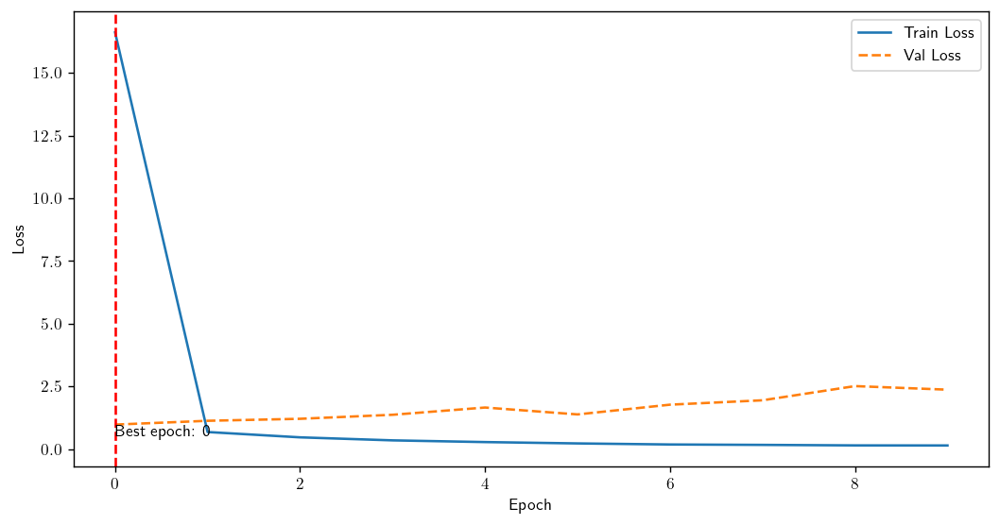

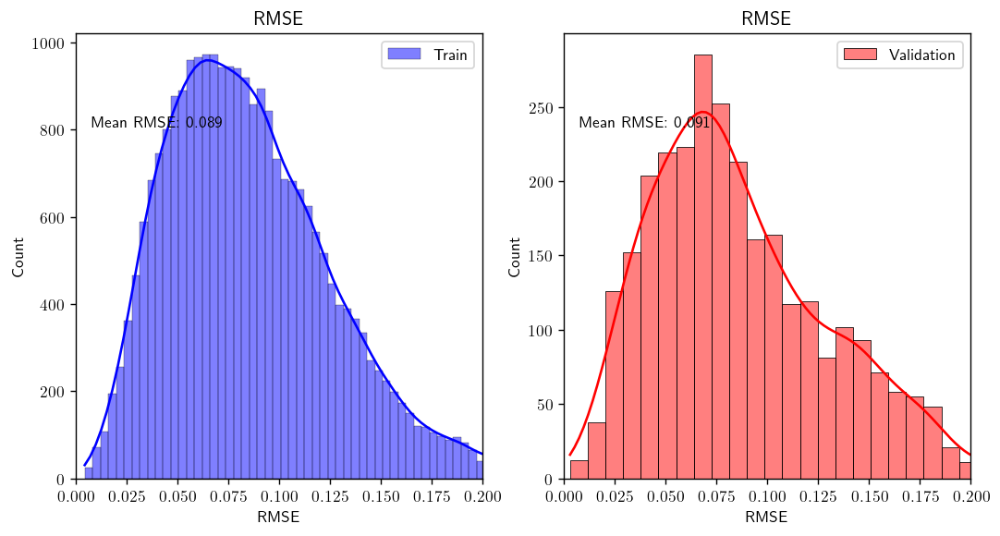

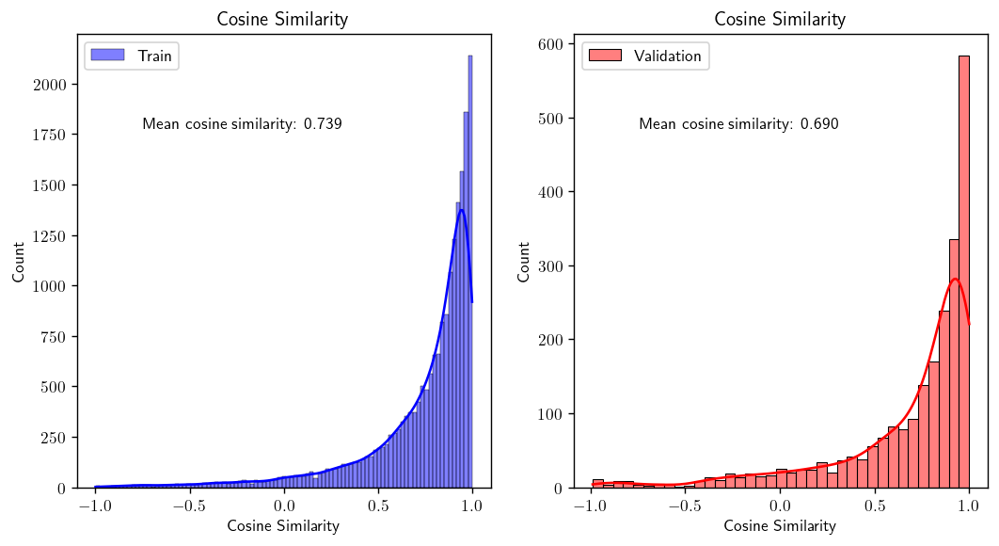

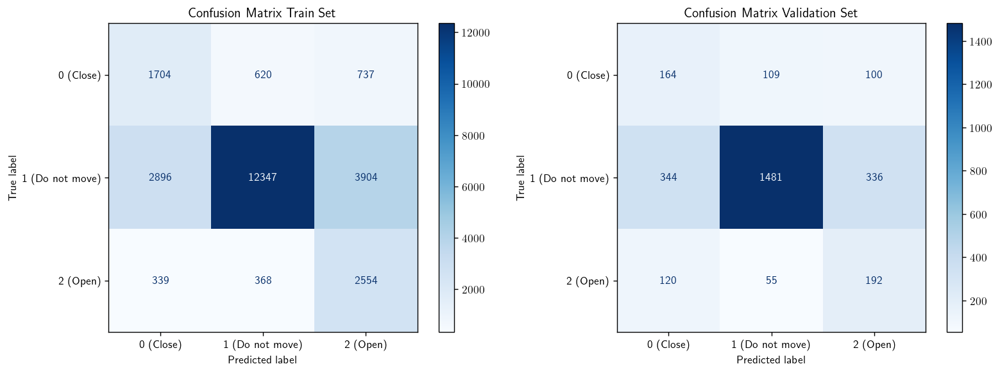

**Figure 25.** Prediction performance metrics for the class-weight experiment. (Top) Root mean squared error (RMSE) for the training (left) and validation (right) sets, with their respective means. (Middle) Cosine similarity for the training (left) and validation (right) sets, with their respective means. (Bottom) Confusion matrices for the training (left) and validation (right) sets.

The respective F1 scores for the training and validation sets were 0.69 and 0.67. From the results it is clear to see that there is a drop in performance in the Cartesian deltas prediction with respect to baseline in terms of RMSE ($\mu_{\text{train new}} = 0.089, \mu_{\text{val new}} = 0.091$; $\mu_{\text{train baseline}} = 0.064$, $\mu_{\text{val baseline}} = 0.069$), and cosine similarity ($\mu_{\text{train new}} = 0.739, \mu_{\text{val new}} = 0.690$; $\mu_{\text{train baseline}} = 0.818$, $\mu_{\text{val baseline}} = 0.766$). Moreover, the classification performance (F1) in the training set was 0.04 poorer with respect to baseline. 

From the confusion matrices, it becomes clear that now the increased weight of the under-represented classes pushes the model to classify a large amount of type-1 actions as type-0 or 2. Not only that, the model is not able to learn any generalizable insights, as the validation loss only increases through the epochs. This experiment was therefore proven unuseful in improving the generalizability of the model, and it was hypothesized that first, learning itself (i.e., generalizability) needed to be promoted.

#### Question 1.c.ii.ii Experiment 2 discussion (10 marks)

##### Description

Incorporate regularization through weight decay, and incorporate batch normalization layers to avoid overfitting at the start of the training loop.

##### Justification

The first observation from the baseline model results was that learning was indeed very stable, although overfitting appeared right at the beginning, with the best validation loss being achieved at the second epoch. Up to this point in model development, the introduction of class weights and ReLU() activations did not diminish this problem, although increasing the batch size to 128 alleviated the problem by one more epoch. This is usually an indication that the function being constructed is too complex, i.e. memorizes the training data losing the ability to generalize. 

A common technique to constraint model complexity is the introduction of regularization term in the loss function which is only dependent on the network's parameters. L2-regularization consists in summing the norm of the newtork's parameters, weighted by the $\lambda$ hyper-parameter:

$$ \text{L2 reg} =  \lambda\left\Vert{w} \right\Vert_{2}^{2}$$

Moreover, manually enforcing 0 mean and standard unit deviation in all layers (batch normalization) is also known to accelerate deep networks' training and further promotes the avoidance of biased weights and vanishing/exploding gradients intended to be avoided by correct preprocessing [[5]](https://arxiv.org/pdf/1502.03167). Therefore, we would expect reduced overfitting and a more stable learning, arriving at better function solutions than baseline.

##### Conclusion

The loss evolutions are shown in the figure below, with the best validation loss (0.402) achieved at epoch 6 (better than baseline):

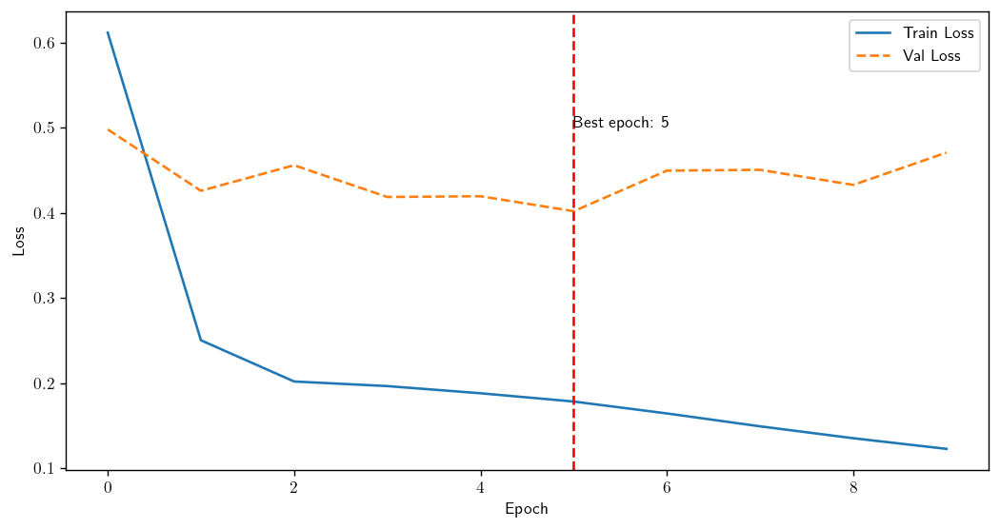

**Figure 26.** Evolution of the training and validation losses along the training scheme in Experiment 2.

It can be seen that the validation loss was unstable, but nevertheless took advantage of any learning that occured during the first steps, i.e. the model generalized better. The Cartesian deltas prediction performance is shown below:

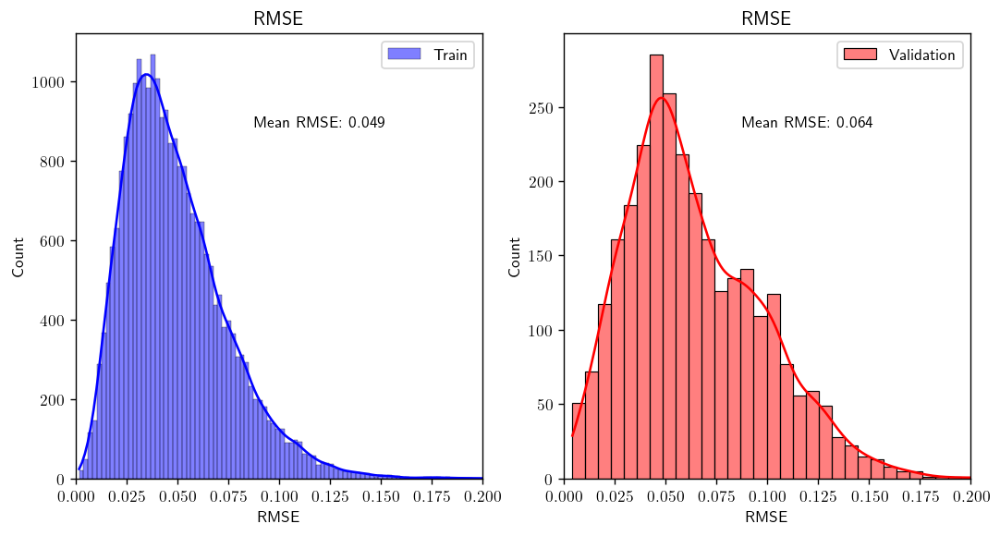

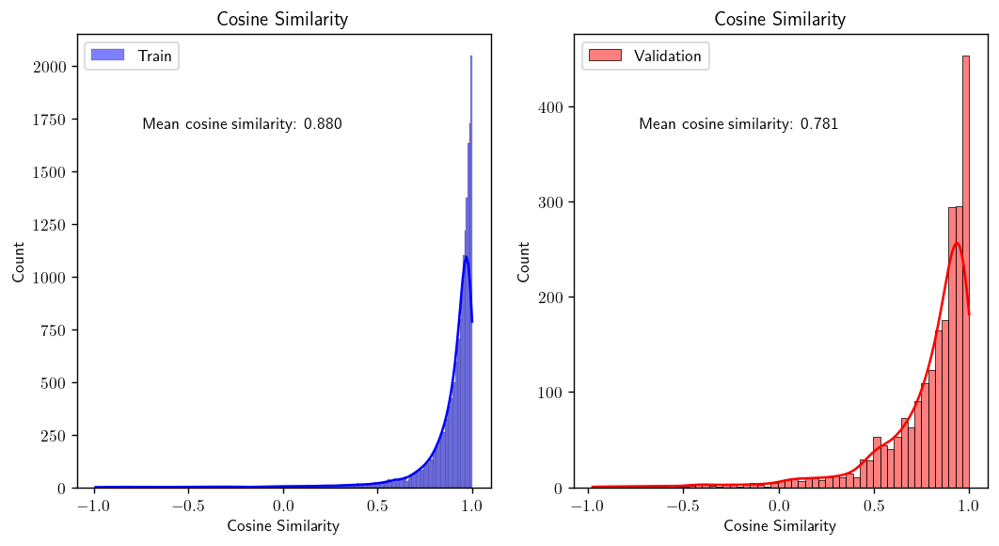

**Figure 27.** (Top) Root mean squared error (RMSE) for the training (left) and validation (right) sets, with their respective means. (Bottom) Cosine similarity for the training (left) and validation (right) sets, with their respective means.

With mean RMSEs of $\mu_{\text{train new}} = 0.049, \mu_{\text{val new}} = 0.064$ and mean cosine similarities of $\mu_{\text{train new}} = 0.880$ and $\mu_{\text{val new}} = 0.741$, the model still performed very well, with a slight improvement with respect to basline. In the case of gripper action classification, we achieved higher than baseline training set ($F1 = 0.95$) and validation set performance ($F1 = 0.88$), as can be visualized in the confusion matrices below:

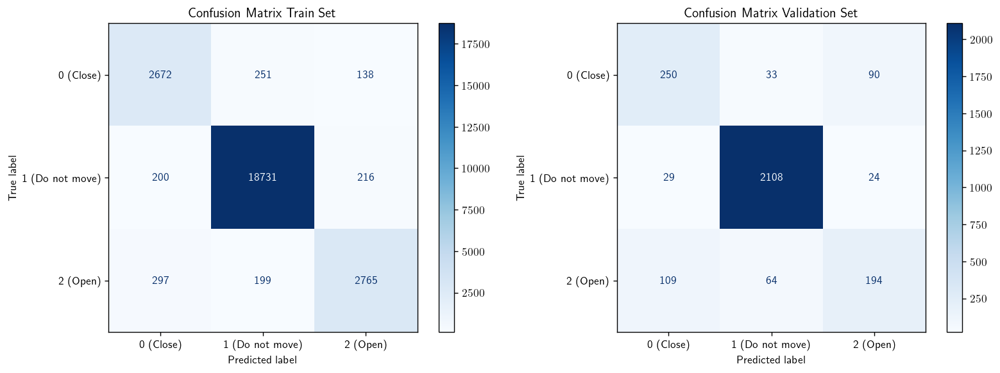

**Figure 28.** Confusion matrices for the training (left) and validation (right) sets.

The prevalence of Failure Mode 1 was greatly diminished, as well as that of Failure Mode 2. Interestingly, many samples were now classified as class 0 in both sets, which was not expected from previous results. Indeed, in the validation set it seems that class 0 and class 2 samples are being confounded. In general, however, the model performed comparably very well, with only very slight increases in the Cartesian delta regression task.

#### Question 1.c.ii.iii Experiment 3 discussion (10 marks)

##### Description

Following the Failure Mode analysis, to disregard the `ee_cartesian_pos_ob_3` feature in the model training and evaluation.

##### Justification

Up to this point in the experimental setting, the experiment above (regularization and batch normalization) had been tried to be improved performance-wise with by adding or modifying several training procedures. These are briefly described below with their respective RMSEs, cosine similarities and F1s. For each one, a link to its corresponding wandb report where all the plots and results can be seen, as well as the folder name of the trained model are provided.

- Learning rate scheduler. Observing the lack of stability at the 5-6 epoch mark, a scheduler was introduced to reduce the learning rate by a factor of 10. This did not impede training stability at the desired training point, and therefore did not increase model performance [[link]](https://wandb.ai/gplazaarriola-university-college-london-ucl-/cw2_v2/reports/E2E_WD_BN_LR_Scheduler--VmlldzoxMDc0MTEwMg?accessToken=36wgscsy4zw66w4udflqe1v3flb9dz3tpeq8hdbf87uuop7d6f63gxtn8pa9nn40)(`E2E_WD_BN_LRSched` model):

 $$F1_{\text{train}} = 0.95, F1_{\text{val}} = 0.87; RMSE_{\text{train}} = 0.053, RMSE_{\text{val}} = 0.065; S_{\text{train}} = 0.866, S_{\text{val}} = 0.793$$

- Dropout. This regularization technique sets neuron activations to 0 with probability $p$. We introduced dropouts in the `image_encoder`, `obs_encoder` and `dense` nets. With $p = 0.2$ [[link]](https://wandb.ai/gplazaarriola-university-college-london-ucl-/cw2_v2/reports/E2E_WD_BN_DO-0-2--VmlldzoxMDc0MTU3MQ?accessToken=nso64xl3qm5ehooglft0byzlxjinioo4prl3sqjum3r7gtw5ux3t6u811loc6lz7) (`E2E_WD_BN_DO0.2` model):

$$F1_{\text{train}} = 0.94, F1_{\text{val}} = 0.87; RMSE_{\text{train}} = 0.053, RMSE_{\text{val}} = 0.061; S_{\text{train}} = 0.859, S_{\text{val}} = 0.779$$

This didn't result in any increase in the validation set, at the expense of training set performance. With p = 0.5 [[link]](https://wandb.ai/gplazaarriola-university-college-london-ucl-/cw2_v2/reports/E2E_WD_BN_DO-0-5--VmlldzoxMDc0MTY4NA?accessToken=8lytuqsr88y3cq239i2a14ydw92yjsifn1chzlv98r8inqznc1ckeqjj4airvqve) (`E2E_WD_BN_DO0.5` model):

$$F1_{\text{train}} = 0.91, F1_{\text{val}} = 0.83; RMSE_{\text{train}} = 0.073, RMSE_{\text{val}} = 0.076; S_{\text{train}} = 0.722, S_{\text{val}} = 0.651$$

This maintained the regression task performance, but at the expense of the gripper action classification. The inclusion of dropouts in the convolutional network, or their exclusion in either the encoders or dense layers did not increase performance either. Additionally, smaller/larger weight decay values were explored (0.1, 0.001, 0.0001), which caused the model to either overfit again quickly or to underfit to the training set, respectively. It was hypothesized that an exhaustive exploration around the chosen weight decay (e.g., in the [0.005, 0.02] interval) could provide a marginal increase in performance, but due to computational and time resources, this analysis was not conducted. Increasing batch size (256, 512) did not improve performance either, nor stabilize training further. For instance, with batch size of 256 [[link]](https://wandb.ai/gplazaarriola-university-college-london-ucl-/cw2_v2/reports/E2E_WD_BN_BS-256--VmlldzoxMDc0MTgyMA?accessToken=cp82akhzso133jup8y6dug9gk2nh1ztd0778mztuk25zja19g08rkiy33bgndvn8) (`E23_WD_BN_BS256` model):

$$F1_{\text{train}} = 0.96, F1_{\text{val}} = 0.88; RMSE_{\text{train}} = 0.067, RMSE_{\text{val}} = 0.077; S_{\text{train}} = 0.827, S_{\text{val}} = 0.791$$

- Model complexity. Finally, we increased the complexity of the model architecture with two more convolutional layers (128 final channels), a changed `obs_encoder` configuration, with linear layers of hidden dimensions [64, 128, 256, 128], and added another layer (dim = 1000) to the `image_encoder`. This did not improve model performance either [[link]](https://wandb.ai/gplazaarriola-university-college-london-ucl-/cw2_v2/reports/E2E_WD_BN-Complex--VmlldzoxMDc0MTk3NA?accessToken=1t1ia7wqf1t4k2z6tlcwwh6r6cwxq7689yrpxyc423wkwglgvwsccf9o8kkx7gfo) (`E2E_WD_BN_Complex` model): 

$$F1_{\text{train}} = 0.97, F1_{\text{val}} = 0.88; RMSE_{\text{train}} = 0.069, RMSE_{\text{val}} = 0.078; S_{\text{train}} = 0.803, S_{\text{val}} = 0.762$$

Model complexity was also increased by creating a 256-dimension feature vector input to the dense layer, originated by the concatenation of the encoded images and observations (instead of fusing), which yielded the following results [[link]](https://wandb.ai/gplazaarriola-university-college-london-ucl-/cw2_v2/reports/E2E_WD_BN_Concatenate--VmlldzoxMDc0MjA1OQ?accessToken=1lu3b746owt3k7fuk45ls8wmch8yc398f9s096t7psr9xd8y98nzkveexxl215nt) (`E2E_WD_BN_Concatenate` model):

$$F1_{\text{train}} = 0.94, F1_{\text{val}} = 0.86; RMSE_{\text{train}} = 0.069, RMSE_{\text{val}} = 0.080; S_{\text{train}} = 0.807, S_{\text{val}} = 0.732$$

After 30 experiments of combinations of these experiments, the simple 2-step "L2-regularization + batch normalization" was not improved upon. 

It was therefore necessary to move from changes in architecture or hyper-parameters to the inputs to the model. In the Failure Mode analysis it was found that `ee_cartesian_pos_ob_3` was the feature whose distribution was the most different between each action type's correctly and incorrectly classified samples. Therefore, it was hypothesized that it could be a model confounder. A valid assumption was that eliminating it from the training process could help increase performance. 

##### Conclusion

Regarding the experiment on the baseline model, as observed in the confusion matrix below, it reduced Failure Mode 1 by 4% (150 less errors) and Failure Mode 2 by almost 40% (540 less errors) in the training set, resulting in a 0.77 F1, an increase of 0.04 with respect to baseline. While it also reduced Failure Mode 1 in the validation set (17.6%, 99 less errors), the large increase in Failure Mode 2 (90% increase, 70 more errors) lead to a 0.71 F1, a 0.01 decrease with respect to baseline.

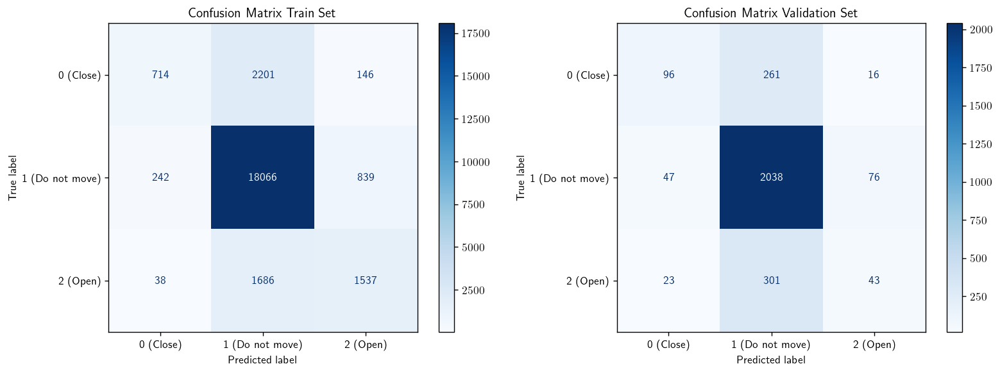

**Figure 29.** Confusion matrices for the training (left) and validation (right) sets in Experiment 3.

Moreover, the training set and validation set RMSEs (0.081, 0.085; respectively) and cosine similarities (0.802, 0.74) also worsened (increased/decreased) with respect to baseline.

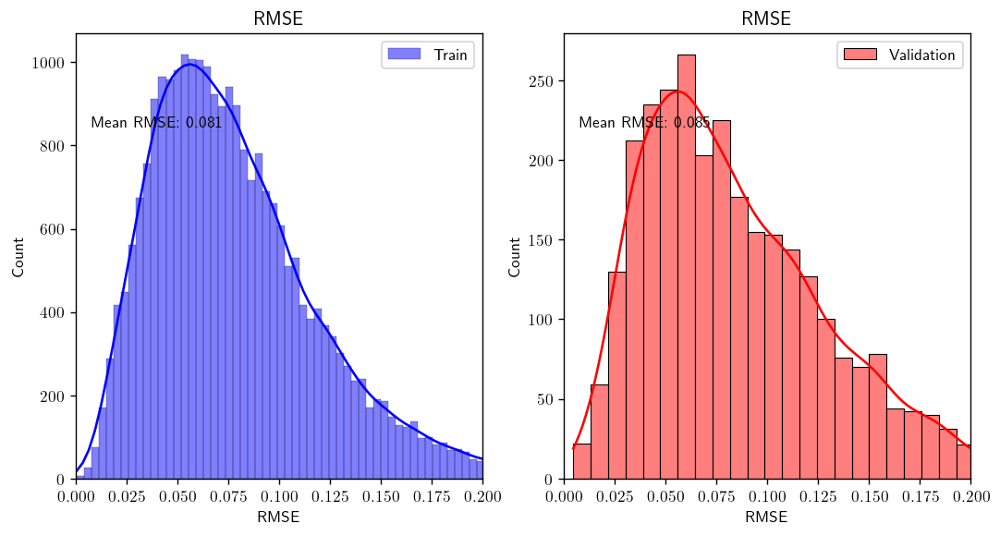

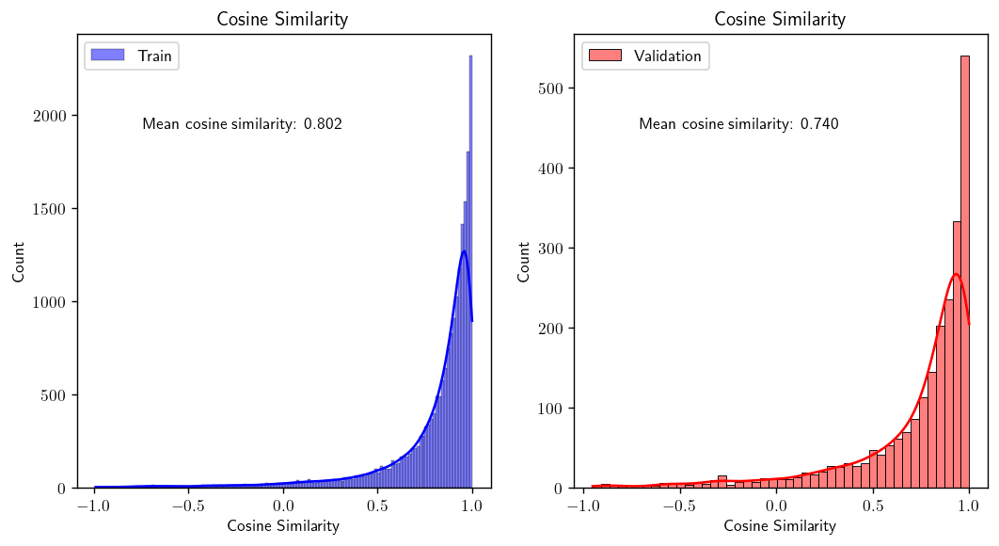


**Figure 30.** In Experiment 3: (Top) Root mean squared error (RMSE) for the training (left) and validation (right) sets, with their respective means. (Bottom) Cosine similarity for the training (left) and validation (right) sets, with their respective means.

Therefore, the experiment did not lead to any significant improvement in either the regression or classification tasks, and generalizability was not promoted. Nevertheless, it was further evidence indicating that, at least in the training set, the Failure Modes were being partly driven by this feature.

## Question 2 Self-supervised pretraining with VAEs

This question requires you to implement a self-supervised approach using a VAE architecture. The focus of question 2 is in developing a VAE model without using __any__ supervised information i.e., without using any action information. You will assess the convergence of the model and the suitability of the learnt latent space. You are required to select and appropriate architecture/loss function/target set of observations to perform self-supervised learning over.

__IMPORTANT__: Do not use any of the __action__ information. You will be awarded 0 marks if you do.

### Question 2.a Self-supervised VAE model (5 marks)

##### Task
- Implement the full model training process and model definiton in the code block below. Markers should be able to retrain your model by running the cell below. You may however, reference previously defined objects (e.g., loaded data and use previously defined functions).

Variational autoencoders (VAEs) [[7]](https://arxiv.org/abs/1312.6114v11), are probabilistic models able to discover the distribution of a given input space, map it onto a latent space of reduced dimensionality (encoder), and generate synthetic data points from the latent space (decoder), ideally as close as possible to the input’s space distribution (Figure 26). 

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" height = 500 width = 1000>
  <figcaption>
    Figure 31. Variational autoencoder architecture. Extracted from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">[8]</a>.
  </figcaption>
</figure>

In self-supervised schemes, the encoded space is assumed to contain the most relevant information of the input such that it is generalizable enough for any subsequent tasks. Here, we hypothesized that generating a latent space from the input images would be beneficial for a subsequent supervised head in charge of predicting the desired actions (Cartesian movement and gripper action). First, encoding the Cartesian observations was hypothesized to not be necessary, given their already low-dimensionality (15D). These would directly be input to the above-mentioned supervised head. Secondly, the joint encoding of both images gives complementary information about each sample. While `front_cam_ob` has a constant view of the scenario, with fixed objects always showing up (left and right boxes, gripper base), the latent space can also be informed about the specific objects and their relative positions through the constantly changing `mount_cam_ob` images. Therefore, being combined, both would possibly inform the latent space about the gripper current action and any possible next movement to be performed with context-dependent representations.

The formulation of a "beta" variational autoencoder is here described. Let 𝑋 = {𝑥(1) , … , 𝑥(𝑛)} be a training dataset of n samples, each represented by a pair of images (`front_cam_ob`, `mount_cam_ob`). We assume that an unobserved continuous random variable 𝑧 generates a sample 𝑥(𝑖) from a conditional distribution $p_{\theta}(x|z)$ (decoder), and that $z$ is also generated through a Gaussian prior distribution $p_{\theta}(z)$~$\mathcal{N}(\mu = 0, \sigma_2 = 1)$. To estimate the parameters $\theta$ and to effectively approximate the latent variable $z$ for an observed value 𝑥(𝑖), an inference model $q_{\phi}(z|x)$ (encoder) is forced to approximate the true prior $p_{\theta}(z)$. Here, the generative ($\theta$) and inference ($\phi$) parameters of the model are jointly learned by optimizing the variational lower bound (VLBO), i.e., by maximizing the log-likelihood:

$$\mathcal{L}(\theta, \phi; x) = −\beta D_{KL}(q_{\phi}(z|x) || p_{\theta}(z)) + \mathbb{E}_{q_{\phi}(z|x)}[log p_{\theta}(x|z)];$$

where $D_{KL}$ is the Kullback-Leiber divergence between two distributions, and $\beta$ is a hyper-parameter that measures its weight and controls the disentanglement in the latent space. Assuming both distributions are normal, the KL divergence can be expressed as: 

$$ D_{KL} = log(\frac{\sigma _2}{\sigma _1}) + \frac{\sigma _1^2 + (\mu _1 - \mu _2)^2}{\sigma _2^2} - \frac{1}{2} $$

Regarding the log-likelihood of the reconstruction, the binary cross-entropy at the single pixel level is computed and summed over the number of pixels using the function `nn.BCEWithLogitsLoss(reduction='sum')`. As explained in section 1.b., this function takes inputs compressed between 0 and 1. Therefore, the images were not standardized but normalized in the [0, 1] range dividing by 255, the maximum pixel intensity value. In practice, the loss is averaged by the number of samples in each mini-batch (implemented in the provided `train_single_epoch.py` file) as:

`train_loss = train_loss/input_vals["images"].shape[0]`

`train_loss.backward()`

To take advantage of the code provided, the `JointCNNEncoder` and `TrackerBalancedLoss` classes were adapted in the blocks below to create a CNN decoder class and a VAE loss tracker. The `prepare_data_for_training` function was also adapted for the VAE to take in the new global transformation (`global_transforms_vae`). Moreover, the `train_single_epoch.py` file was modified to take in a loss dictionary able to save the reconstruction, KL and total mini-batch loss over the training epochs.

The proposed architecture consisted in the same encoder proposed in Q1.c., attached to two linear layers which output the mean and log-variance of the 64D latent space, respectively. Through the reparametrization trick, $z = \mu + \epsilon \odot \sigma$, a latent variable is generated and passed through a symmetrical decoder that reconstructs the input images. After seeing that a monotonous $\beta$ value didn't allow the model to converge (Fig. 27), even for different values of $\beta$ ranging from 0 to 1.5, a cyclical annealing schedule was applied following the protocol established by Li et al. [[9]](https://arxiv.org/pdf/1903.10145) (Fig. 28, bottom). As will be discussed thoroughly in Q2.b., this allowed KL convergence and better image reconstruction. This was implemented through the `beta_cyclic_linear` function (code below). Given that a meaningful VAE is the ultimate objective ($\beta = 1$, i.e., end of the cycle), early stopping was not applied. The models were trained for 20 epochs with two annealing cycles and a batch size of 128.

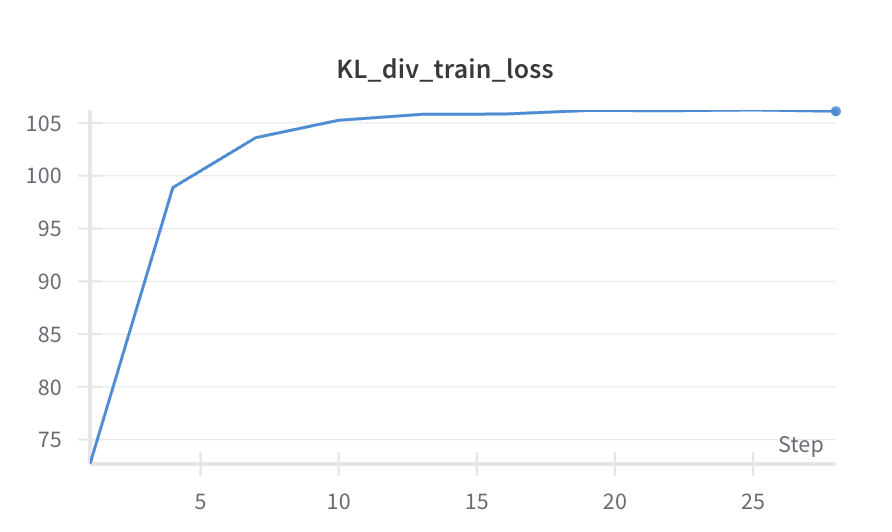

**Figure 32.** Evolution of the training set KL divergence with a constant $\beta = 1$ during 10 epochs. Its logarithmic shape indicates that learning is not ocurring, and that the latent space reconstructions are not meaningful.

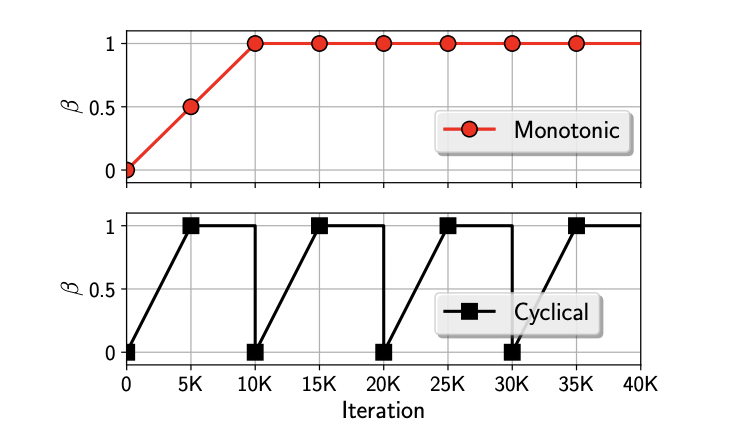

**Figure 33.** Comparison of two $\beta$ annealing schedules, the monotonically increasing (top) and the cyclical schedules (bottom), as depicted in Figure 2 in [[9]](https://arxiv.org/pdf/1903.10145). Their introduction allowed the model to converge and learn meaningful representations.


Several architectures were also here evaluated before attaining the best final model. A brief description and a link to the wandb report is here provided. Note that in each report, the code to implement each of the models is also provided.

1. **Separately encoding images and observations** [[link]](https://wandb.ai/gplazaarriola-university-college-london-ucl-/cw2_v2/reports/VAE_Concatenate--VmlldzoxMDc0MzQ1OA?accessToken=lra6kj84iu7izxcgilcfaxeunurgbek2q21pepa06bhwzw06h8vmbtr998a0tp3v): two different encoders, one for the images and one for the Cartesian observations, produced a 32D latent space which was concatenated (64D) and passed through a common decoder for reconstruction. Neither the images' validation reconstruction loss (overfitting) nor the KL divergence converged.

2. **Summing the images and observations latent representations** [[link]](https://wandb.ai/gplazaarriola-university-college-london-ucl-/cw2_v2/reports/VAE-Fusion--VmlldzoxMDc0MzUwOQ?accessToken=k2imilauyzqul3u4ci788qqxgbipq6f2wyjl8jdko2rw864pzd8qq348k9jsa1o0): similar to the end-to-end architecture, the processed images and observations were summed and passed through a final linear layer that produced the latent mean and log-variance (64D). Here, a very large observation reconstruction loss was observed, as well as a non-converging KL divergence.

3. **Increased convolutional complexity with cyclical annealing** (only images input to the model) [[link]](https://api.wandb.ai/links/gplazaarriola-university-college-london-ucl-/9gu8hvm7): The decoder had the following architecture: 2x224x224 --> 64x224x224 (2times) --> 128x112x112 (3times) --> 256x56x56 (4 times) --> 256x14x14 --> Max Pool --> Dense (4096) --> Dense (1024); and a symmetrical decoder counterpart. A much larger image reconstruction loss was found, and therefore the model was discarded. Increasing either the encoder or decoder complexity was also tried unsuccesfully.

4. **Decreased convolutional complexity with cyclical annealing** (only images) [[link]](https://wandb.ai/gplazaarriola-university-college-london-ucl-/cw2_v2/reports/iVAE-Simple-32D--VmlldzoxMDc0MzY0Nw?accessToken=7nxttgpw5u7czz22vdeb6vc8hyto2bz4zemodl9o50ftl2kz14qq53ia6hqh7pq8): CNN only up to 16 channels (with a symmetrcial decoder) and a 32D latent space. Stable and converging KL with a very unstable image validation reconstruction.

Several latent space dimensions, weight decay, learning rate scheduling and other hyper-parameter configurations ($\beta$, cycle length, latent dimensionality) were also evaluated but not shown for brevity.

_The final model and losses can be loaded from the `iVAE_cyclic_64D` folder. Please, set `run_new_eval` to `True` to re-run the experiments._

In [28]:
def image_transform_vae():
    #Function to transform images in the CLVR Jaco Dataset
    #Inputs: mean and std of the images
    #Outputs: transformation object:
        #A. Add channel dimension
        #B. Transpose dimensions to have (C, H, W)
        #C. Normalize to [0,1]
    return transforms.Compose([
        lambda x : np.expand_dims(x, 2),
        lambda x: np.transpose(x, (2, 0, 1)),
        lambda x: torch.tensor(x)/255.0,
        ])

global_transforms_vae = {
    #Add channel dimension, normalize
    "front_cam_ob": image_transform_vae(),
    "mount_cam_ob": image_transform_vae(),
    
    #No transformation for actions
    "actions": lambda x: torch.tensor(x),  
}

def collate_fn_images(input_list:List[DatasetOutput])->DatasetOutput:
    images = []
    pos = []
    _grp = []
    for val in input_list:
        images.append(
            torch.concat(
                [val.input["front_cam_ob"], val.input["mount_cam_ob"]],
                dim=0
            )[None,:])
        
        pos.append(val.output["actions"][0:3][None,:])
        _grp.append(val.output["actions"][-1:][None])
    _grp = torch.concat(_grp, dim=0)
    grp = torch.zeros(_grp.shape[0],3)
    grp[torch.arange(len(grp)), _grp.squeeze().int()] = 1

    return DatasetOutput(
        input = {
            "images":torch.concat(images,dim=0),
            },
        output = {
            "pos":torch.concat(pos, dim=0),
            "grp":grp
            }
    )


from typing import Dict, Optional

class JointCNNDecoder(BaseModel):

    def __init__(
        self,
        cnn:CNN,
        dense:MLP,
        reshape_size:Optional[List[int]]=[32, 28, 28]
        ) -> None:
        """Torch module for jointly decoding a single latent space into two images
        using a fully connected MLP and CNN.

        Args:
            cnn (CNN): CNN decoder
            dense (MLP): Fully connected decoder
        """
        super().__init__()
        self._cnn = cnn
        self._dense = dense
        self._reshape_size = reshape_size

    def reset(self, gain:float=1.0):
        self._cnn.reset(gain=gain)
        self._dense.reset(gain=gain)
    
    def forward(
        self,
        x:torch.Tensor,
        )->Dict[str,torch.Tensor]:
        _x = self._dense(x)
        _x = _x.view(-1, *self._reshape_size)
        _x = self._cnn(_x)
        return _x


class TrackerBalancedLossVAE:

    def __init__(
        self,
        loss_lkp:Dict,
        mo:Optional[WandBMetricOrchestrator]=None,
        name:Optional[str] = "",
        return_metric_value_dict:bool = False
        ):
        """Class for handling MultiLoss outputs

        Args:
            loss_lkp (Dict[str:torch.nn.modules.loss]): Dictionary containing 
            the required losses and lookup values. The lookup values should
            match those passed to the call method in act and pred parameters
        """
        self.loss_lkp = loss_lkp
        self.mo = mo
        self.__step = 1
        self.name = name
        self.return_metric_value_dict = return_metric_value_dict

    def __call__(
        self, 
        pred:Dict[str, torch.Tensor],
        act:Dict[str, torch.Tensor]
        ) -> torch.Tensor:
        """Evaluates the input values against the loss functions specified in
        the init.

        Args:
            act (Dict[str:torch.Tensor]): Dictionary of the
            form {"name_of_loss": actual_values}
            The keys should match the keys provided in the loss_lkp parameter,
            specified in the init
            pred (Dict[str:torch.Tensor]): Dictionary of the
            form {"name_of_loss": predicted_values}
            The keys should match the keys provided in the loss_lkp parameter,
            specified in the init

        Returns:
            Dict[str:Any]: Dictionary of evaluated results. The keys will match
            those provided in the multi_loss parameter
        """
        loss = 0
        _metric_value_dict = {}
        for key in self.loss_lkp.keys():
            if key == "KL_div":
                _loss = self.loss_lkp[key](pred[key])
            
            elif key == "images":
                try:
                    act_key = act[key].reshape(-1, 2*224*224)
                    _loss = self.loss_lkp[key](pred[key], act_key)
                
                except:
                    _loss = self.loss_lkp[key](pred[key], act[key])
            
            elif key == "obs":
                _loss = self.loss_lkp[key](pred[key], act[key])
                
            _metric_value_dict[f"{key}_{self.name}_loss"] = {
                "label":f"step_{self.__step}",
                "value":_loss
            }
            loss += _loss
        
        #if self.mo is not None:
            #self.mo.update_metrics(metric_value_dict=_metric_value_dict)
        
        out_loss = loss
        self.__step += 1
        if self.return_metric_value_dict:
            return out_loss, _metric_value_dict
        
        else:
            return out_loss

class KL_divergence:
    
    def __init__(self, 
                beta: float = 1.0,
                batch_size: int = 128,
                ) -> None:
        self.beta = beta   
        self.batch_size = batch_size 
    
    def __call__(self, z):
        mu = z[0]
        logvar = z[1]
        beta_KL = -self.beta * 0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
        return beta_KL
    

def beta_cycle_linear(n_iters, iter, start=0.0, stop=1.0,  n_cycle=4, ratio=0.5):
    n_iters, iter, n_cycle = int(n_iters), int(iter), int(n_cycle)
    L = np.ones(n_iters) * stop
    period = n_iters/n_cycle
    step = (stop-start)/(period*ratio)

    for c in range(n_cycle):
        v, i = start, 0
        while v <= stop and (int(i+c*period) < n_iters):
            L[int(i+c*period)] = v
            v += step
            i += 1
    if L[iter] < 0.0001:
        return 0.0001
    else:
        return L[iter]

In [29]:
# Convolutional VAE implementation here
from torch.nn import functional as F

cnn_encoder_config = ConvolutionLayersConfig(
   # 2x224x224 --> 8x112x112 --> 16x56x56 --> 32x28x28 
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=8,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.BatchNorm2d(8),
        nn.LeakyReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=8,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.BatchNorm2d(16),
        nn.LeakyReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.BatchNorm2d(32),
        nn.LeakyReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
        ]
    )

_cnn_output_dim = cnn_encoder_config.get_output_dims() #28x28
_cnn_output_channels = cnn_encoder_config.get_output_channels() #32
_mlp_input_dim = int(
            (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1] #28x28x32
            )

image_encoder = JointCNNEncoder(
   #Takes in the encoded images (28x28x32) and outputs a 128D vector
    cnn=CNN(cnn_encoder_config),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[256],
        output_dim=128,
        batch_norms=[True],
        actvton=nn.LeakyReLU(),
        fnl_act=nn.LeakyReLU(),
        )
)

cnn_decoder_config = ConvolutionLayersConfig(
    # Input: Latent feature map from encoder (32x28x28)
    input_dim=28,   
    input_channels=32,
    layers=[
        nn.ConvTranspose2d(
            in_channels=32,
            out_channels=16,
            kernel_size=(3, 3),
            stride=2,
            padding=1,
            output_padding=1
        ),
        nn.BatchNorm2d(16),
        nn.LeakyReLU(),

        # 16x56x56 --> 8x112x112
        nn.ConvTranspose2d(
            in_channels=16,
            out_channels=8,
            kernel_size=(3, 3),
            stride=2,
            padding=1,
            output_padding=1
        ),
        nn.BatchNorm2d(8),
        nn.LeakyReLU(),

        # 8x112x112 --> 2x224x224
        nn.ConvTranspose2d(
            in_channels=8,
            out_channels=2,
            kernel_size=(3, 3),
            stride=2,
            padding=1,
            output_padding=1
        )]
)

image_decoder = JointCNNDecoder(
    cnn=CNN(cnn_decoder_config),
    dense=MLP(
        input_dim=128,
        hidden_dims=[256],
        output_dim=32*28*28,
        batch_norms=[True],
        actvton=nn.LeakyReLU(),
        fnl_act=nn.LeakyReLU(),
        )
)

class VAE_Images(BaseModel):
    #Encodes the images only
    def __init__(self, 
                latent_dim:int,
                image_encoder:JointCNNEncoder,
                image_decoder:JointCNNDecoder
                ) -> None:
        
        super(VAE_Images, self).__init__()

        self.latent_dim = latent_dim

        #Encoder
        self.image_encoder = image_encoder

        self.linear_mu = nn.Linear(128, latent_dim)
        self.linear_logvar = nn.Linear(128, latent_dim)
        self.linear_up = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU()
        )

        #Decoder
        self.image_decoder = image_decoder

    def encode(self, images):
        #Encode the images and observations separately
        img_enc = self.image_encoder(images)
        mu = self.linear_mu(img_enc)
        logvar = self.linear_logvar(img_enc)
        return mu, logvar

    def reparametrize(self, mu, logvar):
        z = mu + torch.exp(0.5 * logvar) * torch.randn_like(mu)
        return z

    def decode(self, z):
        img_dec = self.image_decoder(self.linear_up(z))
        return img_dec
    
    def forward(self, images):
        mu, logvar = self.encode(images)
        z = self.reparametrize(mu, logvar)
        img_dec = self.decode(z)
        return {
            "images": img_dec,
            "KL_div": [mu, logvar]
        }
    
    def reset(self,
            image_encoder_kwargs,
            image_decoder_kwargs
            ):
        self.image_encoder.reset(**image_encoder_kwargs)
        self.image_decoder.reset(**image_decoder_kwargs)

In [30]:
def prepare_data_for_training_VAE(model, exp_kwargs, img_recon_criterion, obs_recon_criterion, KL_div, 
                                indep_vars = ["front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob", "ee_cartesian_vel_ob", "joint_pos_ob"], 
                                dep_vars = ["actions"]):

    torch.manual_seed(1)
    try:
        model.reset({},{},{},{})
    except:
        model.reset({},{})

    if project_options.debug:
        exp_kwargs["batch_size"] = 4

    if exp_kwargs["half_precision"]:
        train_dataset = NpDictDataset(
            array_dict=train_nps,
            transform_lkp = global_transforms_vae,
            dep_vars = dep_vars,
            indep_vars =indep_vars,
            target_offset=exp_kwargs["target_offset"]
            )

        val_dataset = NpDictDataset(
            array_dict=val_nps,
            transform_lkp = global_transforms_vae,
            dep_vars = dep_vars,
            indep_vars = indep_vars,
            target_offset=exp_kwargs["target_offset"]
            )
    else:
        train_dataset = NpDictDataset(
            array_dict={k:train_nps[k].astype(np.float32) for k in train_nps},
            transform_lkp = global_transforms_vae,
            dep_vars = dep_vars,
            indep_vars = indep_vars,
            target_offset=exp_kwargs["target_offset"]
            )

        val_dataset = NpDictDataset(
            array_dict={k:val_nps[k].astype(np.float32) for k in val_nps},
            transform_lkp = global_transforms_vae,
            dep_vars = dep_vars,
            indep_vars = indep_vars,
            target_offset=exp_kwargs["target_offset"]
            )

    print(len(train_dataset))
    out = train_dataset[0]

    if len(indep_vars) == 2:
        return_obs = False

    else:
        return_obs = True

    if return_obs:
        train_dataloader = DataLoader(
            train_dataset,
            batch_size=exp_kwargs["batch_size"],
            shuffle=True,
            collate_fn=collate_func,
            generator=torch.Generator().manual_seed(0)
        )
        val_dataloader = DataLoader(
            val_dataset,
            batch_size=exp_kwargs["batch_size"],
            shuffle=False,
            collate_fn=collate_func,
            generator=torch.Generator().manual_seed(0)
        )
    
    else:
        train_dataloader = DataLoader(
            train_dataset,
            batch_size=exp_kwargs["batch_size"],
            shuffle=True,
            collate_fn=collate_fn_images,
            generator=torch.Generator().manual_seed(0)
        )
        val_dataloader = DataLoader(
            val_dataset,
            batch_size=exp_kwargs["batch_size"],
            shuffle=False,
            collate_fn=collate_fn_images,
            generator=torch.Generator().manual_seed(0)
        )

    first_batch = next(train_dataloader.__iter__())

    input_dim = first_batch.input["images"].shape
    print(input_dim)
    if return_obs:
        obs_dim = first_batch.input["obs"].shape
        print(obs_dim)
    pos_dim = first_batch.output["pos"].shape
    print(pos_dim)
    grp_dim = first_batch.output["grp"].shape
    print(grp_dim)

    exp_kwargs["model_def"] = model.__repr__()


    if exp_kwargs["half_precision"]:
        model = model.half()
    optimizer = torch.optim.Adam(
        model.parameters(), lr=exp_kwargs["learning_rate"],
        eps=1e-04, weight_decay=exp_kwargs["weight_decay"]
        )
    
    if exp_kwargs["scheduler"]: 
        scheduler = torch.optim.lr_scheduler.MultiStepLR(
            optimizer, milestones=exp_kwargs["milestones"], gamma=exp_kwargs["gamma"]
            )

    else:
        scheduler = None

    if return_obs:
        __criterion = TrackerBalancedLossVAE(
            loss_lkp={
                "images":copy.deepcopy(img_recon_criterion),
                "obs":copy.deepcopy(obs_recon_criterion),
                "KL_div":copy.deepcopy(KL_div)
            })
    
    else:
        __criterion = TrackerBalancedLossVAE(
            loss_lkp={
                "images":copy.deepcopy(img_recon_criterion),
                "KL_div":copy.deepcopy(KL_div)
            })


    if not MAC: #device is cuda
        if exp_kwargs["half_precision"]:
            with torch.no_grad():
                if torch.cuda.is_available():
                    model = model.cuda()
                    with torch.autocast(device_type="cuda"):
                        if return_obs:
                            res = model(
                                images=first_batch.input["images"].cuda(),
                                obs=first_batch.input["obs"].cuda())
                        else:
                            res = model(
                                images=first_batch.input["images"].cuda())
                            
                        first_batch.output["pos"] = first_batch.output["pos"].cuda()
                        first_batch.output["grp"] = first_batch.output["grp"].cuda()
                else:
                    with torch.autocast(device_type="cpu"):
                        if return_obs:
                            res = model(
                                images=first_batch.input["images"],
                                obs=first_batch.input["obs"])
                        else:
                            res = model(
                                images=first_batch.input["images"])
    
        else:
            with torch.no_grad():
                if torch.cuda.is_available():
                    model = model.cuda()
                    if return_obs:
                        res = model(
                            images=first_batch.input["images"].cuda(),
                            obs=first_batch.input["obs"].cuda())
                    else:
                        res = model(
                            images=first_batch.input["images"].cuda())
        
                    first_batch.output["pos"] = first_batch.output["pos"].cuda()
                    first_batch.output["grp"] = first_batch.output["grp"].cuda()
                else:
                    if return_obs:
                        res = model(
                            images=first_batch.input["images"],
                            obs=first_batch.input["obs"])
                    else:
                        res = model(
                            images=first_batch.input["images"])
            
        print(__criterion(res,first_batch.output))

    else: #device is mps, then instead of  torch.cuda.is_available() we use torch.backends.mps.is_available() and then device = torch.device("mps")
        if exp_kwargs["half_precision"]:
            with torch.no_grad():
                if torch.backends.mps.is_available():
                    model = model.to("mps")
                    with torch.autocast(device_type="mps"):
                        if return_obs:
                            res = model(
                                images=first_batch.input["images"].to("mps"),
                                obs=first_batch.input["obs"].to("mps")
                                )
                        else:
                            res = model(
                                images=first_batch.input["images"].to("mps")
                                )
                        
                        first_batch.input["images"] = first_batch.input["images"].to("mps")
                        first_batch.input["obs"] = first_batch.input["obs"].to("mps")
                else:
                    with torch.autocast(device_type="cpu"):
                        if return_obs:
                            res = model(
                                images=first_batch.input["images"],
                                obs=first_batch.input["obs"]
                                )
                        else:
                            res = model(
                                images=first_batch.input["images"]
                                )
                        
        else:
            with torch.no_grad():
                if torch.backends.mps.is_available():
                    model = model.to("mps")
                    if return_obs:
                        res = model(
                            images=first_batch.input["images"].to("mps"),
                            obs=first_batch.input["obs"].to("mps")
                            )
                        first_batch.input["obs"] = first_batch.input["obs"].to("mps")
                    
                    else:
                        res = model(
                            images=first_batch.input["images"].to("mps")
                            )  
                    first_batch.input["images"] = first_batch.input["images"].to("mps")

                else:
                    if return_obs:
                        res = model(
                            images=first_batch.input["images"],
                            obs=first_batch.input["obs"]
                            )
                    else:
                        res = model(
                            images=first_batch.input["images"]
                            )
                        
        print(__criterion(res,first_batch.input))
    
    mo = WandBMetricOrchestrator()

    if return_obs:
        train_criterion = TrackerBalancedLossVAE(
            loss_lkp={
                "images":copy.deepcopy(img_recon_criterion),
                "obs":copy.deepcopy(obs_recon_criterion),
                "KL_div":copy.deepcopy(KL_div)

            },
            name="train",
            mo=mo,
            return_metric_value_dict=True
            )

        val_criterion = TrackerBalancedLossVAE(
            loss_lkp={
                "images":copy.deepcopy(img_recon_criterion),
                "obs":copy.deepcopy(obs_recon_criterion),
                "KL_div":copy.deepcopy(KL_div)
            },
            name="val",
            mo=mo,
            return_metric_value_dict=True
            )
        
        metric_value_dict_train = {
        "images_train_loss": [],
        "obs_train_loss": [],
        "KL_div_train_loss": []
    }

        metric_value_dict_val = {
            "images_val_loss": [],
            "obs_val_loss": [],
            "KL_div_val_loss": []
        }
    
    else:
        train_criterion = TrackerBalancedLossVAE(
            loss_lkp={
                "images":copy.deepcopy(img_recon_criterion),
                "KL_div":copy.deepcopy(KL_div)
            },
            name="train",
            mo=mo,
            return_metric_value_dict=True
            )

        val_criterion = TrackerBalancedLossVAE(
            loss_lkp={
                "images":copy.deepcopy(img_recon_criterion),
                "KL_div":copy.deepcopy(KL_div)
            },
            name="val",
            mo=mo,
            return_metric_value_dict=True
            )
        
        metric_value_dict_train = {
            "images_train_loss": [],
            "KL_div_train_loss": []
        }   
        metric_value_dict_val = {
            "images_val_loss": [],
            "KL_div_val_loss": []
        }   

    sl_trainer = TorchTrainingLoop(
        model=model, gpu=True, optimizer=optimizer, criterion=train_criterion,
        val_criterion=val_criterion, epochs=exp_kwargs["epochs"], logger=logger, scheduler=None,
        mo=WandBMetricOrchestrator(), half_precision=exp_kwargs["half_precision"],
        mac = MAC, preds_save_type=None,
        return_metric_value_dict=True, metric_value_dict_train=metric_value_dict_train, metric_value_dict_val=metric_value_dict_val,
        annealing_beta_procedure=exp_kwargs["annealing_beta_procedure"], n_cycle=exp_kwargs["n_cycle"]
        )
    
    return train_dataloader, val_dataloader, model, optimizer, __criterion, sl_trainer, train_criterion, val_criterion, mo


In [31]:
def plot_losses_VAE(train_loss_dict, val_loss_dict, first_epoch=0):
    #There are either 3 or 4 losses: images, KL_div, total and sometimes obs
    num_columns = len(train_loss_dict.keys())   
    num_rows = 1
    fig, ax = plt.subplots(num_rows, num_columns, figsize=(15, 5))

    for i, key in enumerate(train_loss_dict.keys()):
        ax[i].plot(train_loss_dict[key][first_epoch:], label="train")
        
        if "KL" in key:
            title = "KL Divergence Loss"

        elif "images" in key:
            title = "Images Reconstruction Loss"
        
        elif "obs" in key:
            title = "Observations Reconstruction Loss"
        
        elif "total" in key:
            title = "Total Loss"

        ax[i].set_title(title)
    
    for i, key in enumerate(val_loss_dict.keys()):
        ax[i].plot(val_loss_dict[key][first_epoch:], label="val")
        ax[i].legend()
        ax[i].grid()
    
    plt.show()

In [32]:
import pickle
def VAE_evaluation(model, train_dataloader, val_dataloader, exp_kwargs, run_new_eval, folder, train_loss_dict={}, val_loss_dict={}, wandb_run_dir=None, display_results=True, img_recon_criterion=nn.BCELoss(), obs_recon_criterion=nn.MSELoss(), KL_div=KL_divergence(), first_epoch = 0, return_obs= True, n_epochs=20):

    #1. Create folder of model if necessary
    new_folder = os.path.join("trained_models/", folder)
    if os.path.exists(new_folder):
        pass
    else:
        os.mkdir(new_folder)

    #2. Plot loss evolution
    file_train_dict = f"train_loss_dict_vae_{folder}.pkl"
    file_val_dict = f"val_loss_dict_vae_{folder}.pkl"
    
    if run_new_eval:
        plot_losses_VAE(train_loss_dict, val_loss_dict, first_epoch=first_epoch)
        with open(os.path.join(new_folder, file_train_dict), "wb") as f:
            pickle.dump(train_loss_dict, f)
        with open(os.path.join(new_folder, file_val_dict), "wb") as f:
            pickle.dump(val_loss_dict, f)

    else:
        #Load the losses from the previous run
        with open(os.path.join(new_folder, file_train_dict), "rb") as f:
            train_loss_dict = pickle.load(f)
        with open(os.path.join(new_folder, file_val_dict), "rb") as f:
            val_loss_dict = pickle.load(f) 
        plot_losses_VAE(train_loss_dict, val_loss_dict, first_epoch=first_epoch)
    

    #3. Save/load model
    model_file = f"best_epoch_vae_{folder}.pt"
    if run_new_eval:
        best_epoch = n_epochs
        loc = os.path.join(wandb_run_dir, "agent_checkpoints")
        state_dict = torch.load(os.path.join(loc, f"mdl_chkpnt_epoch_{best_epoch}.pt"),weights_only=True)['model_state_dict']
        if project_options.debug:
            model_file = f"best_epoch_vae_{folder}_debug.pt"
            torch.save(state_dict, os.path.join(new_folder, model_file))
        else:
            torch.save(state_dict, os.path.join(new_folder, model_file))
        model.load_state_dict(state_dict)

    else:
        if project_options.debug:
            if MAC:
                model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_vae_{folder}_debug.pt"), weights_only=True))
            else:
                model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_vae_{folder}.pt"), map_location=torch.device("cpu"), weights_only=True))
        else:
            if MAC:
                model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_vae_{folder}.pt"), weights_only=True))
            else:
                model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_vae_{folder}.pt"), map_location=torch.device("cpu"), weights_only=True))

    #Evaluate the model on the training and validation sets
    if return_obs:
        train_criterion_eval = TrackerBalancedLossVAE(
            loss_lkp={
                "images":copy.deepcopy(img_recon_criterion),
                "obs":copy.deepcopy(obs_recon_criterion),
                "KL_div":copy.deepcopy(KL_div)
            },
            name="train",
            mo=None,
            return_metric_value_dict=True
            )

        val_criterion_eval = TrackerBalancedLossVAE(
            loss_lkp={
                "images":copy.deepcopy(img_recon_criterion),
                "obs":copy.deepcopy(obs_recon_criterion),
                "KL_div":copy.deepcopy(KL_div)
            },
            name="val",
            mo=None,
            return_metric_value_dict=True   
            )

        metric_value_dict_train = {
            "images_train_loss": [],
            "obs_train_loss": [],
            "KL_div_train_loss": []
        }   

        metric_value_dict_val = {
            "images_val_loss": [],
            "obs_val_loss": [],
            "KL_div_val_loss": []
        }

    else:
        train_criterion_eval = TrackerBalancedLossVAE(
            loss_lkp={
                "images":copy.deepcopy(img_recon_criterion),
                "KL_div":copy.deepcopy(KL_div)
            },
            name="train",
            mo=None,
            return_metric_value_dict=True
            )

        val_criterion_eval = TrackerBalancedLossVAE(
            loss_lkp={
                "images":copy.deepcopy(img_recon_criterion),
                "KL_div":copy.deepcopy(KL_div)
            },
            name="val",
            mo=None,
            return_metric_value_dict=True
            )

        metric_value_dict_train = {
            "images_train_loss": [],
            "KL_div_train_loss": []
        }   

        metric_value_dict_val = {
            "images_val_loss": [],
            "KL_div_val_loss": []
        }

    print("-----------------Evaluating on training set-----------------")
    evaluate_model_fn_train = ValidateSingleEpoch(half_precision=exp_kwargs["half_precision"], cache_preds=True, cache_inputs=True, return_metric_value_dict=True, metric_value_dict= metric_value_dict_train)
    evaluate_model_fn_val = ValidateSingleEpoch(half_precision=exp_kwargs["half_precision"], cache_preds=True, cache_inputs=True, return_metric_value_dict=True, metric_value_dict= metric_value_dict_val)
    train_loss, metric_value_dict_train, train_preds, train_true, train_inputs = evaluate_model_fn_train(model=model, data_loader=train_dataloader, gpu=True, mac=MAC, criterion=train_criterion_eval)
    print("-----------------Evaluating on validation set-----------------")
    val_loss, metric_value_dict_val, val_preds, val_true, val_inputs = evaluate_model_fn_val(model=model, data_loader=val_dataloader, gpu=True, mac=MAC, criterion=val_criterion_eval)
    

    if display_results:
        pass
        
    return train_preds, train_true, val_preds, val_true, train_inputs, val_inputs, model

In [33]:
exp_kwargs_VAE = {
    "batch_size": 128,
    "latent_dim": 64,
    "beta": 0.8,
    "learning_rate": 0.001,
    "half_precision": False,
    "target_offset": 0,
    "epochs": 20,
    "scheduler": False,
    "weight_decay": 0,
    "annealing_beta_procedure": "cycle_linear",
    "n_cycle": 2
}

iVAE = VAE_Images(latent_dim=exp_kwargs_VAE["latent_dim"], image_encoder=image_encoder, image_decoder=image_decoder).to("mps")

img_recon_criterion = nn.BCEWithLogitsLoss(reduction='sum')
obs_recon_criterion = None
KL_div = KL_divergence(exp_kwargs_VAE["beta"], batch_size=exp_kwargs_VAE["batch_size"])

train_dataloader, val_dataloader, model, optimizer, __criterion, sl_trainer, train_criterion, val_criterion, mo = prepare_data_for_training_VAE(model= iVAE, exp_kwargs=exp_kwargs_VAE, img_recon_criterion=img_recon_criterion, obs_recon_criterion=obs_recon_criterion, KL_div=KL_div, indep_vars=["front_cam_ob","mount_cam_ob"], dep_vars=["actions"])

run_new_eval = False

wandb_name="iVAE_cyclic_64D_trial"
wandb_grp="VAE"

if project_options.debug:
    wandb_name = f"{wandb_name}_DEBUG"

if run_new_eval:
    orig = datetime.datetime.now()
    mo, epoch, train_loss_dict, val_loss_dict, wandb_run_dir, betas = sl_trainer.training_loop(
        train_loader=train_dataloader,
        val_loader=val_dataloader,
        wandb_proj=WANDB_PROJECT,
        wandb_grp=wandb_grp,
        wandb_config=exp_kwargs_VAE,
        wandb_name=wandb_name,
        reset_kwargs={
            "image_encoder_kwargs": {},
           # "obs_encoder_kwargs": {},
           # "obs_decoder_kwargs": {},
            "image_decoder_kwargs": {},
        },
        )
    post_train = datetime.datetime.now()

25469
torch.Size([128, 2, 224, 224])
torch.Size([128, 3])
torch.Size([128, 3])
tensor(9331109., device='mps:0')


### Question 2.b Model convergence (12 marks)

##### Task
- Provide empirical evidence (in the form of appropriate training/validation metrics) supporting **why** the model is appropriately trained;
- Interpret why the metrics demonstrate that the model has converged. If your model has **not** converged, interpret why the metrics suggest so.

The key metrics to analyze model convergence are:

1. **Training and validation total loss**: informs about learning stability.
2. **Training and validation reconstruction loss**: indicates under-/over-fitting.
3. **Training KL divergence**: its smooth convergence indicates meaningful representations being learned.
4. **Gradients**: inform about learning stability.

Given that the value of the reconstruction loss is difficult to interpret, 6 exemplary reconstructions of `front_cam_ob` and `mount_cam_ob` images are shown for the training and validation sets. This will further inform about model convergence and the quality of the information encoded in the latent space.

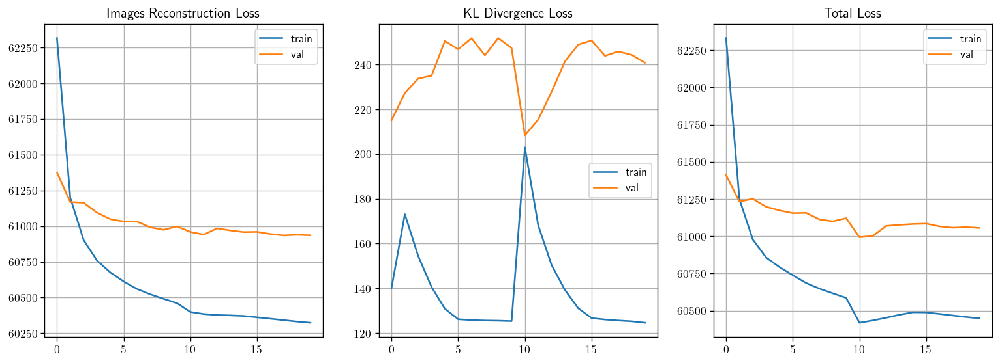

-----------------Evaluating on training set-----------------
-----------------Evaluating on validation set-----------------


In [34]:
train_preds, train_true, val_preds, val_true, train_inputs, val_inputs, trained_model = VAE_evaluation(
    iVAE, train_dataloader, val_dataloader, exp_kwargs_VAE, run_new_eval=False, folder="iVAE_cyclic_64D", train_loss_dict={}, val_loss_dict={}, wandb_run_dir=None, display_results=True, img_recon_criterion=img_recon_criterion, obs_recon_criterion=obs_recon_criterion, KL_div=KL_div, first_epoch = 0, return_obs =False, n_epochs=exp_kwargs_VAE["epochs"])

**Figure 34.** (Left) Training (blue) and validation (orange) image reconstruction loss evolution. (Middle) Training (blue) and validation (orange) KL divergence. (Right) Training (blue) and validation (orange) total loss.

1. **Training and validation total losses**: Both curves show stable dynamics during the learning process, characterized by a steep decrease in the first 2 epochs (lr = 0.01), and a smoother evolution during the rest of training. A considerable decrease is also observed in the 10-epoch mark, where $\beta$ is re-set to 0 in the cyclical annealing schedule. These "warm restarts" leverage the meaningful learned latent codes to improve reconstruction performance [[9]](https://arxiv.org/pdf/1903.10145).

2. **Training and validation reconstruction losses**: Both curves smoothly decrease during the training process. The decrease in the validation's set reconstruction loss is nevertheless less notable as that of the training set, and remains mostly stable during the last 10 epochs. Given that it doesn't "explode" with respect to the training's set loss, overfitting is discarded. Moreover, given that it also doesn't follow the latter closely, underfitting is not occuring either.

3. **Training KL divergence**: the introduction of cyclical annealing allowed the KL divergence to converge and to not collapse (i.e., go to 0). This is because it first tries to imitate the posterior distribution (increase in KL), and then learns to encode meaningful information in the latent space. Note that the shown KL divergence is the "raw" one, i.e. it is not multiplied by the different values of $\beta$ imposed during training.

4. **Gradients**: exploding or vanishing gradients indicate unstable learning. After analysing all gradients [[link_to_wandb_report]](https://wandb.ai/gplazaarriola-university-college-london-ucl-/cw2_v2/reports/iVAE-Gradients--VmlldzoxMDc0NDA3MA?accessToken=qezll3l1wntmwdwcanimul5nxftw54a9djl1o7lvyzragvqlbqa359rbal820h2l), it was found that none suffered from these conditions, although there are discrepancies in the orders of magnitude (from $10^{-4} to $10^1$), being the [-5, 5] the most common.

These 4 key metrics indicate that the model is stably learning meaningful latent representations, and therefore converges. Let us finally analyse the reconstruction quality of the model. First, we'll look at 6 images in the training set.

-----------------True Images-----------------


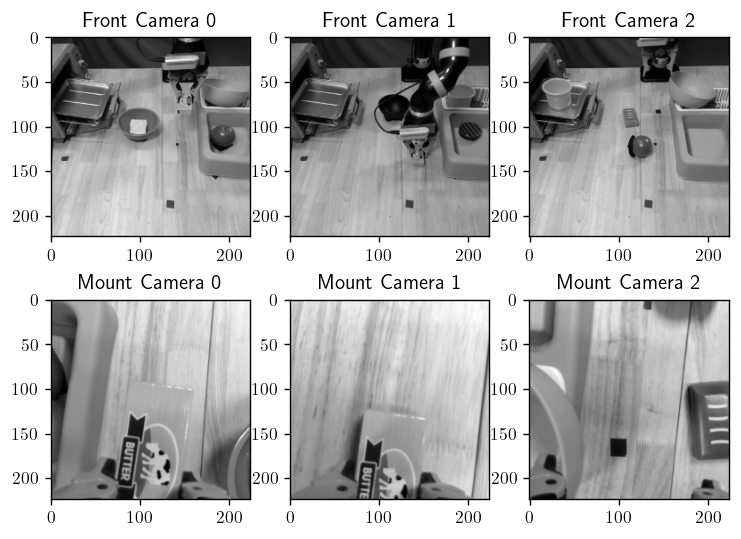

-----------------Reconstructed Images-----------------


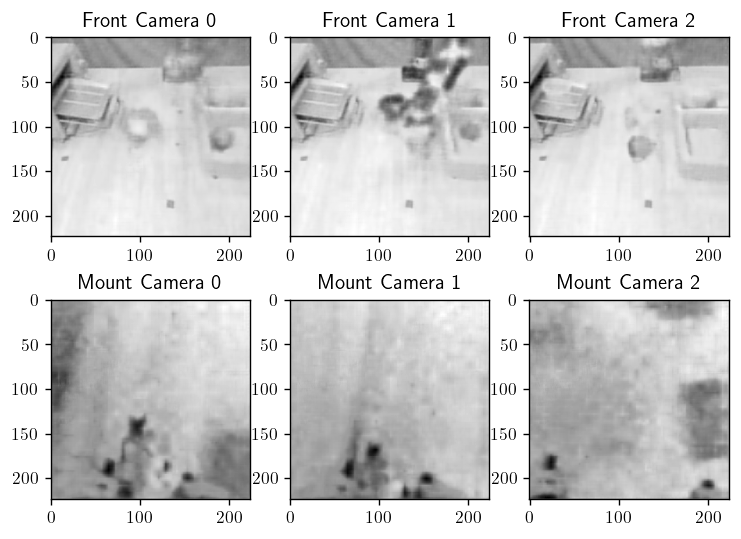

-----------------True Images-----------------


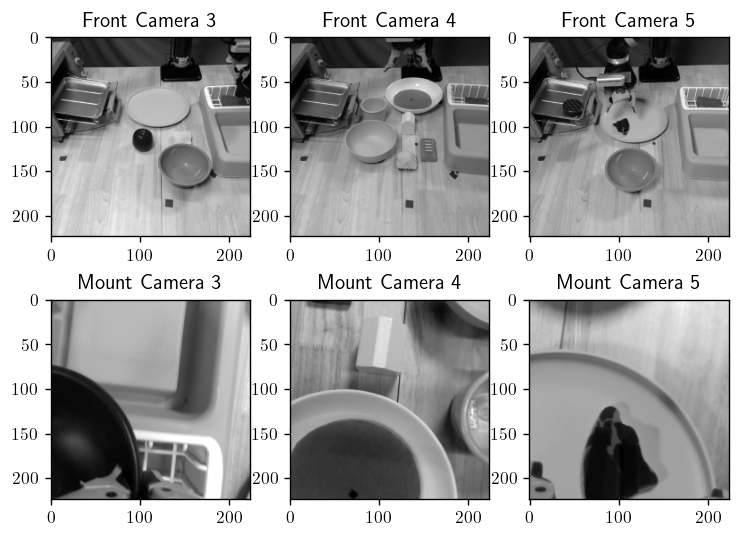

-----------------Reconstructed Images-----------------


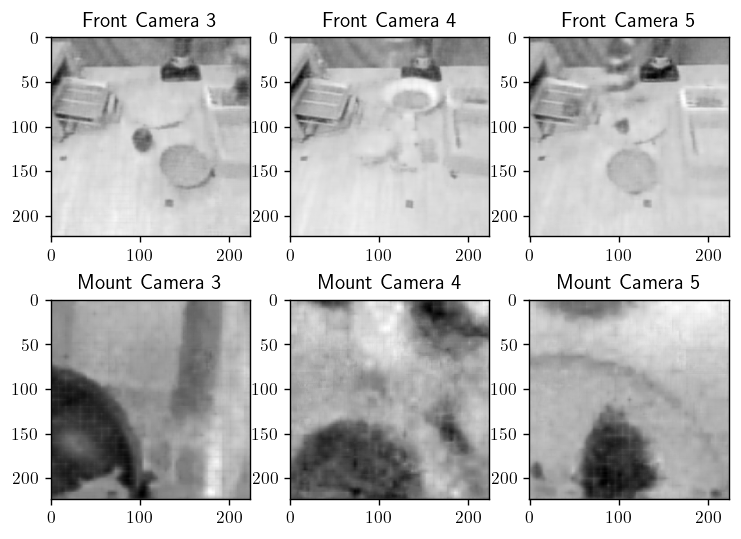

In [105]:
#print the results
true_images = train_inputs["images"].reshape(1280, 2, 224, 224)
reconstructed_images = train_preds["images"].reshape(1280, 2, 224, 224)

#Show the first 6 true images

for j in range(0, 6, 3):

    print("-----------------True Images-----------------")
    fig, ax = plt.subplots(2, 3, figsize=(7, 5))
    for i in range(3):
        ax[0, i].imshow(true_images[j + i][0], cmap= "gray")
        title_front = "Front Camera " + str(j + i)
        title_mount = "Mount Camera " + str(j+i)
        ax[0, i].set_title(title_front)
        ax[1, i].imshow(true_images[j + i][1], cmap= "gray")
        ax[1, i].set_title(title_mount)

    plt.show()

    #Show the first 6 reconstructed images
    print("-----------------Reconstructed Images-----------------")
    fig, ax = plt.subplots(2, 3, figsize=(7, 5))
    for i in range(3):
        ax[0, i].imshow(reconstructed_images[j + i][0], cmap= "gray")
        title_front = "Front Camera " + str(j+i)
        title_mount = "Mount Camera " + str(j+i)
        ax[0, i].set_title(title_front)
        ax[1, i].imshow(reconstructed_images[j + i][1], cmap= "gray")
        ax[1, i].set_title(title_mount)

    plt.show()

**Figure 35.** Six exemplary `front_cam_ob` (top row) and `mount_cam_ob` (bottom row) images in the training set and their respective reconstructions. For better visualization, these have been divided in batches of 3. The first two separate figures have the first three true (top) and reconstructed (bottom) samples. The last two figures include the third to sixth samples.

Visual inspection of the training `front_cam_ob` images shows the following:

- The gripper is correctly positioned in the reconstruction, although its structure (image 0) and the end object (image 1) being grabbed is sometimes blurred.
- The immobile objects (right and left shelves, gripper base) are well reconstructed unless a complicated object is placed in front/on top (e.g., the gripper arm).
- Most relevant objects (bowls, fruits, plates) are present in the reconstruction. Their visualization quality depends on the amount of objects to be reconstructed (see image 4).

Regarding the `mount_cam_ob` images:

- The gripper is correctly reconstructed in terms of its parts and its position in the image. 
- Other objects are blurry but correctly positioned in the image. For instance, the butter details (images 0-1) are barely identified. Image 4 presents 4 objects of which only the shape limits can be seen.

Therefore, the encoded latent space allows the relevant objects to be correclty positioned and delimited, although image quality is largely decreased. Moreover, the presence of many objects together causes the reconstructions to be poorer. If we look at the validation set reconstructions:

-----------------True Images-----------------


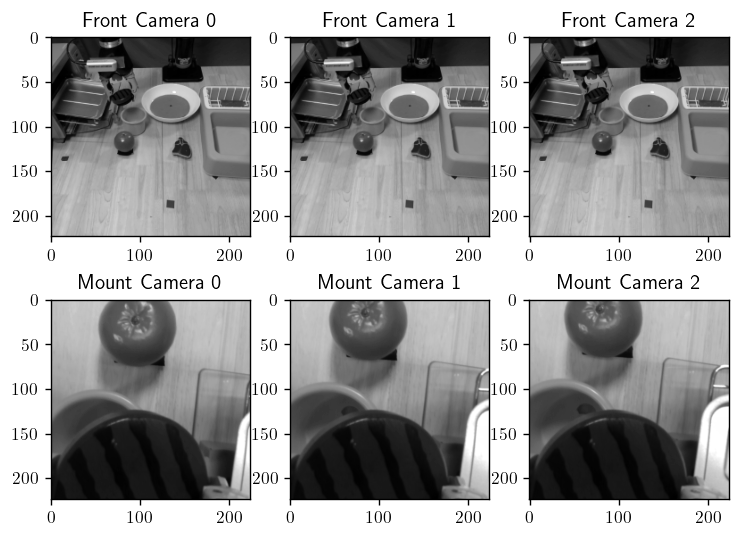

-----------------Reconstructed Images-----------------


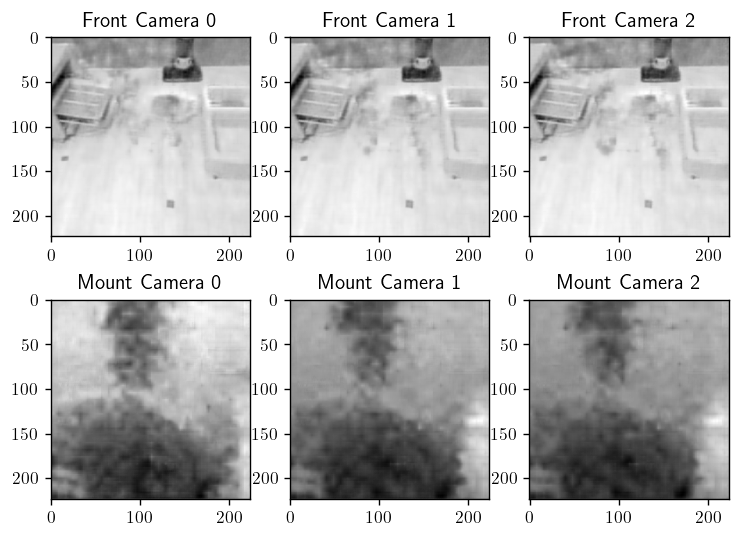

-----------------True Images-----------------


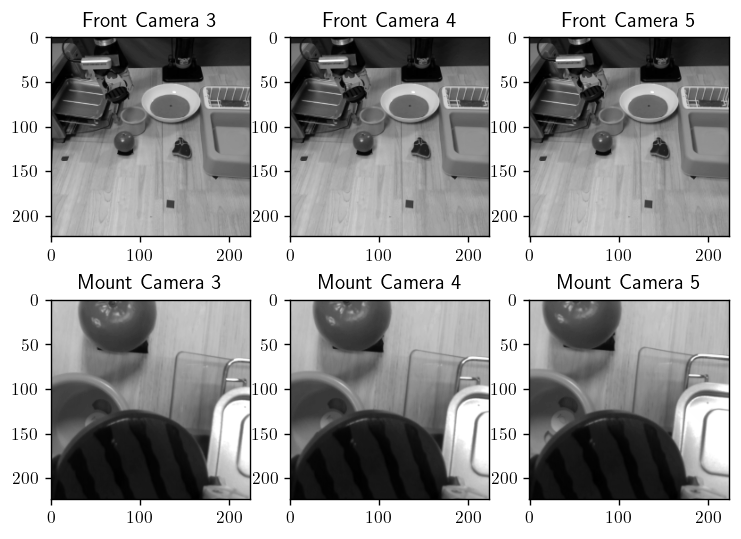

-----------------Reconstructed Images-----------------


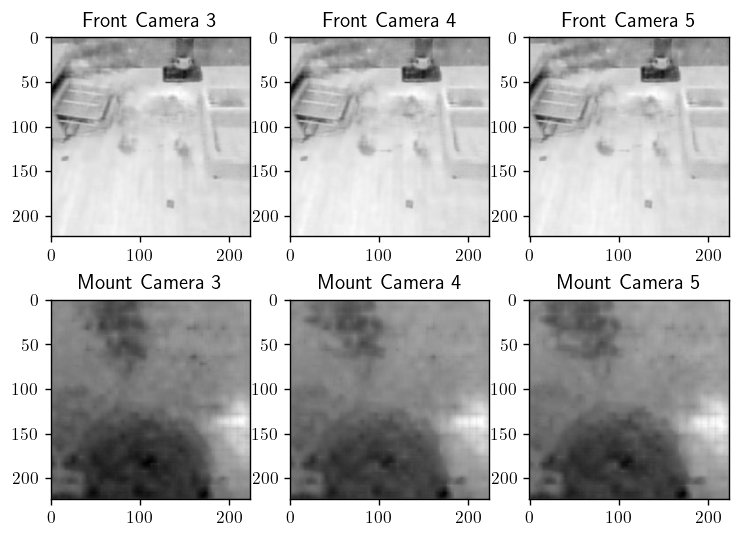

In [108]:
#Same for the validation set
true_images = val_inputs["images"].reshape(1280, 2, 224, 224)
reconstructed_images = val_preds["images"].reshape(1280, 2, 224, 224)

#Show the first 6 true and reconstructed images
for j in range(0, 6, 3):

    print("-----------------True Images-----------------")
    fig, ax = plt.subplots(2, 3, figsize=(7, 5))
    for i in range(3):
        ax[0, i].imshow(true_images[350 + j + i][0], cmap= "gray")
        title_front = "Front Camera " + str(j + i)
        title_mount = "Mount Camera " + str(j+i)
        ax[0, i].set_title(title_front)
        ax[1, i].imshow(true_images[350 + j + i][1], cmap= "gray")
        ax[1, i].set_title(title_mount)

    plt.show()


    print("-----------------Reconstructed Images-----------------")
    fig, ax = plt.subplots(2, 3, figsize=(7, 5))
    for i in range(3):
        ax[0, i].imshow(reconstructed_images[350 + j + i][0], cmap= "gray")
        title_front = "Front Camera " + str(j+i)
        title_mount = "Mount Camera " + str(j+i)
        ax[0, i].set_title(title_front)
        ax[1, i].imshow(reconstructed_images[350 + j + i][1], cmap= "gray")
        ax[1, i].set_title(title_mount)

    plt.show()

**Figure 36.** Six exemplary `front_cam_ob` (top row) and `mount_cam_ob` (bottom row) images in the validation set and their respective reconstructions. For better visualization, these have been divided in batches of 3. The first two separate figures have the first three true (top) and reconstructed (bottom) samples. The last two figures include the third to sixth samples. The 350-356 samples were chosen due to the very slight movement between each, which allowed to determine the quality of the reconstruction.

From the observed samples it is clear that the quality of the reconstructions is worse, although the same applies, the encoded latent space allows the relevant objects to be correclty positioned and delimited. Moreover, given that the validation set is not shuffled, we can observe in the `mount_cam_ob` images here shown that the reconstructions "correctly" position the relatively moving apple between consecutive frames. 

Therefore, all the analysed metrics and reconstructions indicate the model converges to meaningful latent representations.

### Question 2.c Latent space analysis (6 marks)

##### Task
- Using reasonable analysis, conclude whether the representation learnt by the self-supervised method will be beneficial for the downstream supervised task. **Empirical evidence** should be provided **however**, references to the performance of the self-superised method with a supervised head on the downstream task will be awarded __0 marks__. 

To analyze if the learned latent space will be beneficial for the downstream task, it is necessary to visualize it and to evaluate if there are clusters associated to either the gripper action or the Cartesian deltas. Given its large dimensionality, a 2D t-SNE reduction was applied for proper visualization. The latent space is extracted by passing the input images through the trained encoder. Given the computational complexity of the concatenation operation on the training set - didn't finish in at least 15 minutes- these analyses were performed on the validation set, which also informed about the generalizability of the latent space.

In [35]:
from sklearn.manifold import TSNE   
for t, vals in enumerate(val_dataloader):
    if t == 0:
        data = vals.input["images"]
        labels_pos = vals.output["pos"]
        labels_grp = vals.output["grp"]
    else:
        data = torch.cat((data, vals.input["images"]))
        labels_pos = torch.cat((labels_pos, vals.output["pos"]))
        labels_grp = torch.cat((labels_grp, vals.output["grp"]))

print(data.shape, labels_pos.shape, labels_grp.shape)

with torch.no_grad():
    trained_model.to("cpu")
    mu, logvar = trained_model.encode(data)
    z = (model.reparametrize(mu, logvar)).cpu().detach().numpy()

z_embedded = TSNE(n_components=2).fit_transform(z)

torch.Size([2901, 2, 224, 224]) torch.Size([2901, 3]) torch.Size([2901, 3])


python(41042) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


In [36]:
images = data[:, 0].cpu().detach().numpy()  
labels = undo_one_hot_encoding(labels_grp)
print(labels.shape)

torch.Size([2901])


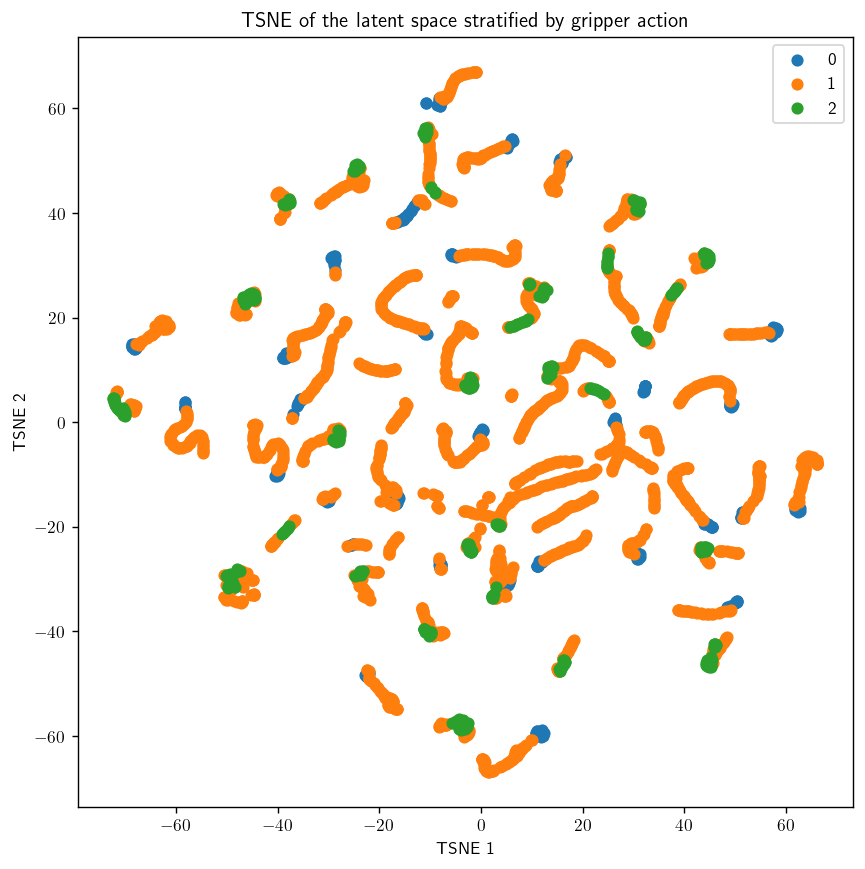

In [37]:
def plot_tsne_grp_action(z_embedded, labels):
    plt.figure(figsize=(8, 8))
    for i, label in enumerate(np.unique(labels)):
        idx = np.where(labels == label)[0]
        plt.scatter(z_embedded[idx, 0], z_embedded[idx, 1], label=label)
    plt.xlabel("TSNE 1")
    plt.ylabel("TSNE 2")
    plt.title("TSNE of the latent space stratified by gripper action")
    plt.legend()
    plt.show()

plot_tsne_grp_action(z_embedded, labels)

**Figure 37.** t-SNE reduction (2D) of the latent space colored by gripper action (0, open; 1, do not change; 2, close).

No clusters associated with the gripper action were observed. Nevertheless, there exist a large number of mini-clusters, and usually the 0/2 actions are found at the end of them. Let us also compute the intra- and inter-cluster distances (pairwise distance) in the non-reduced latent space:

In [ ]:
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import StandardScaler

def compute_distances(latent_vectors, action_labels):
    """
    Computes intra-class and inter-class distances for the latent space.
    Inputs: - latent_vectors
            - action_labels: Corresponding action labels (0, 1, 2).
    Output: Average intra-class and inter-class distances (tuple)
    """
    unique_classes = np.unique(action_labels)
    intra_distances = []
    inter_distances = []

    for cls in unique_classes:
        
        class_vectors = latent_vectors[action_labels == cls]

        #Compute pairwise distances within the class
        intra_class_dist = pairwise_distances(class_vectors).mean()
        intra_distances.append(intra_class_dist)

        #Compute between current class and others
        other_vectors = latent_vectors[action_labels != cls]
        inter_class_dist = pairwise_distances(class_vectors, other_vectors).mean()
        inter_distances.append(inter_class_dist)

    avg_intra_distance = np.mean(intra_distances)
    avg_inter_distance = np.mean(inter_distances)

    return avg_intra_distance, avg_inter_distance

#Scale latent vect
scaler = StandardScaler()
z_scaled = scaler.fit_transform(z)

intra_dist, inter_dist = compute_distances(z_scaled, labels)

print(f"Average intra-class distance: {intra_dist:.2f}")
print(f"Average inter-class distance: {inter_dist:.2f}")

Average intra-class distance: 11.11
Average inter-class distance: 11.31


As expected, the distances are very similar, although slightly the inter-class distance was slightly larger. Next, we color the t-SNE reduction according to each of the Cartesian deltas:

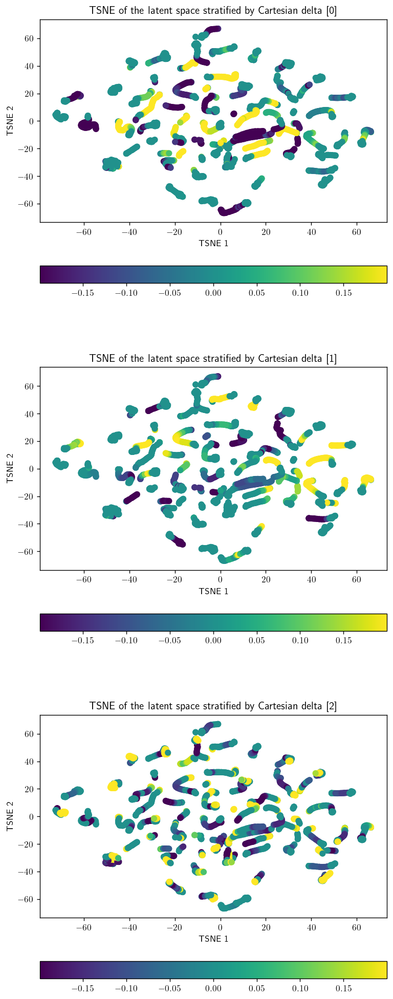

In [44]:
def plot_tsne_grp_pos(z_embedded, labels):
    #We have the x, y and z coordinates of the end effector position
    fig, ax = plt.subplots(3, 1, figsize=(7, 20))
    for i in range(3):
        scatter = ax[i].scatter(z_embedded[:, 0], z_embedded[:, 1], c=labels[:, i], cmap="viridis")
        fig.colorbar(scatter, ax=ax[i], orientation="horizontal")
        ax[i].set_xlabel("TSNE 1")
        ax[i].set_ylabel("TSNE 2")
        ax[i].set_title(f"TSNE of the latent space stratified by Cartesian delta [{i}]")

plot_tsne_grp_pos(z_embedded, labels_pos)

**Figure 38.** t-SNE reduction (2D) of the latent space colored by Cartesian deltas (top, x direction; middle, y direction; bottom, z direction).

Again, it is difficult to establish an association between the movement imposed on the gripper and the position of a sample in the latent space. Nevertheless, the existence of such large number of mini-clusters prompted the possibility that each of them corresponded to a different sequence in the validation set. Therefore, I colored the latent space by the position of each sample in the validation matrix taking advantage of the fact that the sequences come in order and are not shuffled. 

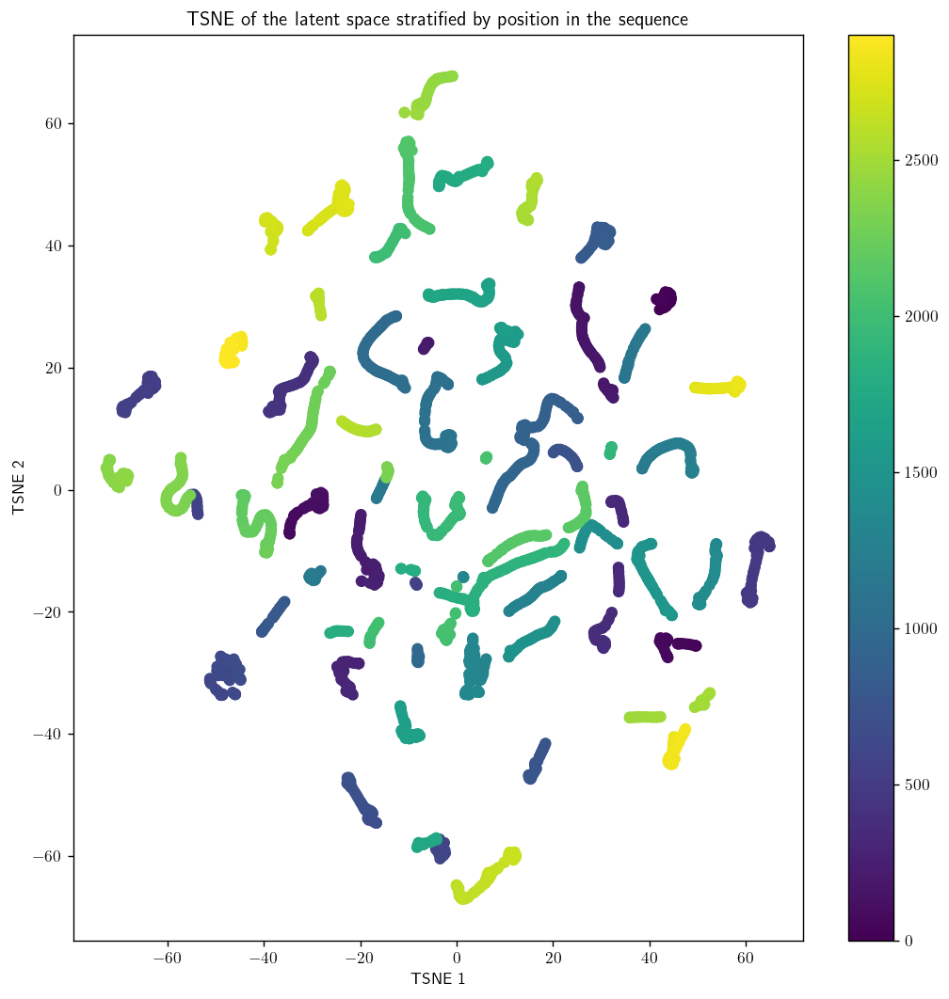

In [86]:
def plot_tsne_vector_pos(z_embedded):
    plt.figure(figsize=(10, 10))
    scatter = plt.scatter(z_embedded[:, 0], z_embedded[:, 1], c=np.arange(0, len(z_embedded)), cmap="viridis")
    plt.colorbar(scatter)
    plt.xlabel("TSNE 1")
    plt.ylabel("TSNE 2")
    plt.title("TSNE of the latent space stratified by position in the sequence")
    plt.show()

plot_tsne_vector_pos(z_embedded)

**Figure 39.** t-SNE reduction (2D) of the latent space colored by position in the validation matrix (row-wise, order of the samples).

This was further clear indication that the position of a sample in the latent space encoded the presence of objects and their position in space in a sequence. Therefore, the first 20 sequences were analysed manually to obtain their vector positions (see code). The t-SNE reduction of these sequences colored by the number of the sequence is shown in Figure 35. 

_NOTE_: The `display_sequences()` function can be used to visualize any video sequence desired, but is commented as it cannot be shown on a pdf. The interested reader is invited to use it if considered necessary.

In [139]:
#Display in a video a sequence of images
from matplotlib import animation
# 0-33, 33-73, 73-125 (white bowl from left), 125-194 (steak from middle), 194-267 (w. bowl from middle to right -drop-)
# 267-317 (w. bowl w. apple from right to middle), 267-383 (apple to right bandeja -drop-), 383-447 (w. bowl from mid to up -drop-)
# 447-509 (ball from mid to bowl up -drop-), 509-561 (butter to bandeja -drop-), 561-580 (move cup),
# 580-605 (grab cup),  605-640 grab milk, 640-675 (grab milk), 675-725 (move bowl brom right up to right down),
# 725-782 (pick up middle bowl), 782-851 (pick up middle bowl, opposite movement of gripper), 
# 851-990 (grab brick from middle and leave it on left box), 990-1049 (white bowl from left box and drop in middle),


#Create vector that has 723 positions, and the value is the sequence number
sequence_videos = np.zeros(1121)
dict_seq = {
    "0-33": 0,
    "33-73": 1,
    "73-125": 2,
    "125-194": 3,
    "194-267": 4,
    "267-317": 5,
    "317-383": 6,
    "383-447": 7,
    "447-509": 8,
    "509-561": 9,
    "561-580": 10,
    "580-605": 11,
    "605-640": 12,
    "640-675": 13,
    "675-725": 14,
    "725-782": 15,
    "782-851": 16,
    "851-990": 17,
    "990-1049": 18,
    "1049-1121": 19
}

for key in dict_seq:
    start, end = key.split("-")
    start = int(start)
    end = int(end)
    sequence_videos[start:end] = dict_seq[key]
    

def display_sequence(images, labels, fps=10):
    fig = plt.figure()
    ims = []
    for i, (img, label) in enumerate(zip(images, labels)):
        im = plt.imshow(img, animated=True)
        im.axes.annotate(f"Action: {label}", (10, 10), color="white", fontsize=12)
        ims.append([im])
    ani = animation.ArtistAnimation(fig, ims, interval=1000 // fps, blit=True)
    plt.close()
    return ani


#ani = display_sequence(images[1049:1121], labels[675:800], fps=25)
#ani.save("sequence.gif", writer="pillow", fps=25)

#Display the gif
#from IPython.display import Image
#Image("sequence.gif")

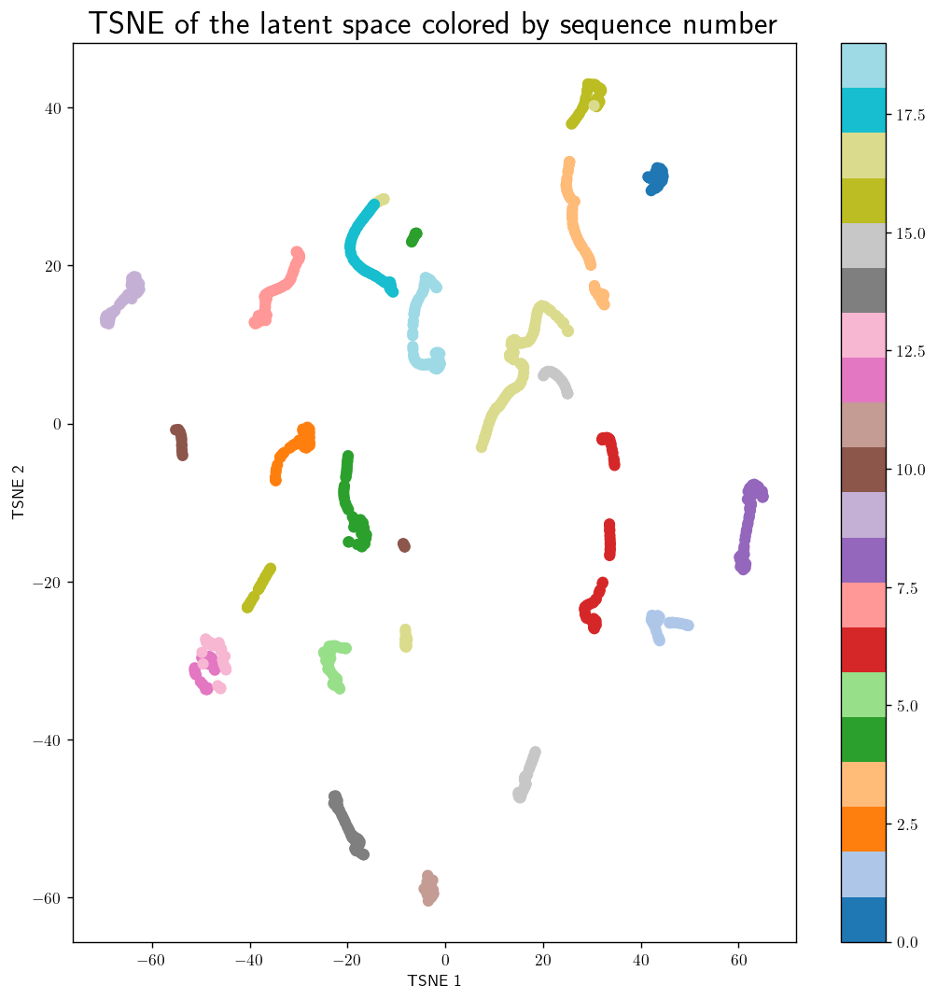

In [140]:
#Function that takes in a latent space, compresses it through PCA and is colored by the frame in the sequence
from sklearn.decomposition import PCA

def display_latent_space_trajectory(z_embedded, sequence_videos):

    fig = plt.figure(figsize=(10, 10))
    scatter = plt.scatter(z_embedded[:, 0], z_embedded[:, 1], c=sequence_videos, cmap='tab20')
    plt.colorbar(scatter)
    plt.xlabel("TSNE 1")
    plt.ylabel("TSNE 2")
    plt.title("TSNE of the latent space colored by sequence number", fontsize=20)
    plt.show()

display_latent_space_trajectory(z_embedded[:1121], sequence_videos=sequence_videos)

**Figure 40.** t-SNE reduction of the first 15 video sequences in the validation set, colored by sequence number.

Indeed, the mini-clusters were shown to be corresponding to each of the video sequences in the validation set. Moreover, close clusters tend to have similar characteristics. For instance, clusters 13 and 14 (dark and light pink) correspond both to a grabbing milk sequence. Clusters 2 (dark orange) and 4 (dark green) correspond to moving a white bowl. In clusters 18 (light blue) and 19 (dark blue), an object is either picked or dropped in the left box. A final question was to analyze if the position inside each mini-cluster corresponded to the position of the frame in the sequence, evaluated for the first video sequence in Figure 36.

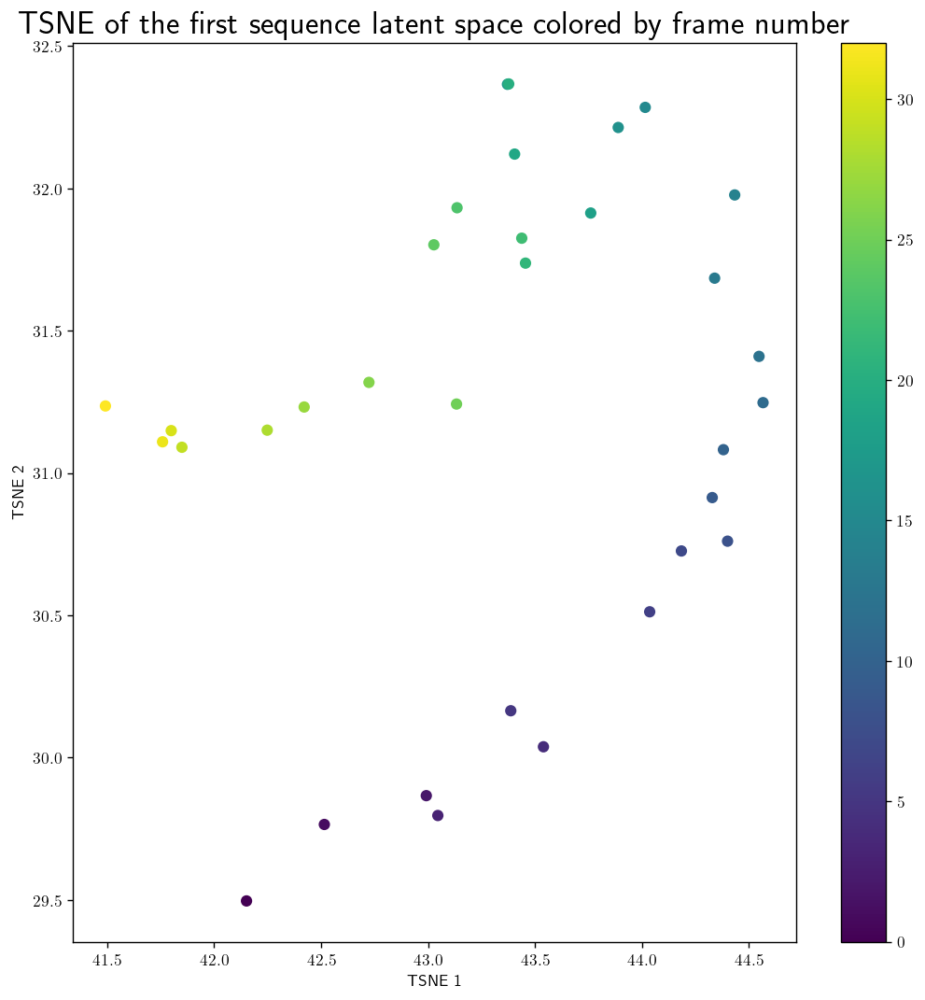

In [87]:
fig = plt.figure(figsize=(10, 10))
scatter = plt.scatter(z_embedded[:33, 0], z_embedded[:33, 1], c=np.arange(0, 33), cmap='viridis')
plt.colorbar(scatter)
plt.xlabel("TSNE 1")
plt.ylabel("TSNE 2")
plt.title("TSNE of the first sequence latent space colored by frame number", fontsize=20)
plt.show()

**Figure 41.** t-SNE reduction of the first video sequence colored by frame number.

Although the shape of the cluster is not linear, a directionality according to frame number was clearly observed. These two major findings indicate that the encoder is not only projecting images to a space the position in which is related to the presence of certain objects (video sequence clusters), but also to their relative position along a sequence of frames. Such a powerful encoding is the base of the quality of the reconstructions and further validates the above-mentioned model convergence.

While this powerful encoding could result very helpful in an object recognition downstream task, is it useful in our case? The latent space does not explicitly encode the actions, but there are two reasons to believe it will be helpful. First, looking at Figure 32 and displaying the video sequences, it was found that each was related to either a picking up (grp = 2) or dropping (grp = 0) action, accompanied by frames of gripper positioning (before picking up) or movement with the object (before dropping), during which grp = 1. Therefore, the separation of the sequences in the latent space can help the model understand which correspond to which main action. Secondly, the drop/pick-up actions are usually found at the end of the video sequence. Given that the latent space also imposes a frame directionality inside each video sequence (Figure 36), the model can also learn this characteristic from the encoded representations. This is also applicable to the Cartesian deltas, given that the imposed movement is typically zero the moment an object is picked-up or dropped (see Figure 3). 

## Question 3 Full model training
This question requires you to first develop a supervised head which utilises the latent space from your self-supervised method. You are then required to assess the models performance as well as the model you developed in question 1.c.i on the test set, report the performance and conclude whether self-supervised learning is appropriate for this task.

### Question 3.a Combining self-supervised model with the downstream task (5 marks)

##### Task
- Develop a model which combines the self-supervised pretraining with a model for performing the downstream task by freezing the self-supervised model and fine-tuning a head for prediction and implement it in the code block below. Markers should be able to retrain your model by running the cell below. You may however, reference previously defined objects (e.g., loaded data and use previously defined functions). The supervised head should at least include any inputs that you did not feed into the self-supervised model. For example, assume you decide to perform self-supervised learning only using front_cam_ob images. You must also include mount_cam_ob, ee_cartesian_pos_ob, ee_cartesian_vel_ob and joint_pos_ob observations in your model.

For the downstream task, two different dense layers were designed to take in the encoded images and the Cartesian observations to predict the gripper actions and movements, respectively. This separate prediction yielded better results than a joint one like in the end-to-end fashion. Both dense layers had a similar expand-to-compress architecture. The Cartesian deltas predictior was less complex, with hidden layers of size $[64, 128, 64]$ without batch normalization layers or dropouts, which were found to negatively affect performance. The action predictor, on the other hand, was more complex ($[128, 256, 128]$ hidden layer sizes), and included batch normalization and dropout ($p = 0.1$) layers. A learning rate scheduler starting from 0.01 and decreasing by a factor of 10 at the 4 and 15 epochs was imposed. This is implemented in the `VAE_SupervisedHead` class.

The images were normalized before being passed through the trained encoder, while the Cartesian observations were standardized. The VAE parameters are frozen (`requires_grad = False`) in the `prepare_data_for_training_VAE_SH` function. The code blocks below allor for model training and evaluation in the training and validation sets.

_The model and losses can be loaded from the `VAE_SH_cyclic_64D_Sched` folder. Please, set `run_new_eval` to `True` to re-run the experiments._

In [109]:
def retrieve_VAE(model, folder):

    new_folder = os.path.join("trained_models/", folder)
    if os.path.exists(new_folder):
        pass
    else:
        os.mkdir(new_folder)

    if project_options.debug:
        if MAC:
            model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_vae_{folder}_debug.pt"), weights_only=True))
        else:
            model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_vae_{folder}.pt"), map_location=torch.device("cpu"), weights_only=True))

    else:
        if MAC:
            model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_vae_{folder}.pt"), weights_only=True))
        else:
            model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_vae_{folder}.pt"), map_location=torch.device("cpu"), weights_only=True))

    return model

global_transforms_vae_sh = {
    #Add channel dimension, normalize and standardize
    "front_cam_ob": image_transform_vae(),
    "mount_cam_ob": image_transform_vae(),
    
    #No transformation for actions
    "actions": lambda x: torch.tensor(x), 
    
    #Standardize across every dimension
    "ee_cartesian_pos_ob": lambda x: torch.tensor((x - mean_cartesian_pos_ob) / std_cartesian_pos_ob),
    "ee_cartesian_vel_ob": lambda x: torch.tensor((x - mean_cartesian_vel_ob) / std_cartesian_vel_ob),
    "joint_pos_ob": lambda x: torch.tensor((x - mean_joint_pos_ob) / std_joint_pos_ob)  
}

#Define supervised head
sup_head_pos = MLP(
   #Takes in the sum of the encoded images and observations and outputs a 3D vector
    input_dim = 64 + 15,
    hidden_dims = [64, 128, 64],
    output_dim = 3,
    actvton=nn.LeakyReLU(),
    fnl_act=nn.LeakyReLU(),
)

sup_head_grp = MLP(
    #Takes in the sum of the encoded images and observations and outputs a 3D vector
    input_dim = 64 + 15,
    hidden_dims = [128, 256, 128],
    output_dim = 3,
    batch_norms=[True, True, True],
    actvton=nn.LeakyReLU(),
    fnl_act=nn.LeakyReLU(),
    dropouts=[0.1, 0.1, 0.1]
)
    

#Define the model
class VAE_SupervisedHead(BaseModel):
    def __init__(self, vae, sup_head_pos, sup_head_grp):
        super(VAE_SupervisedHead, self).__init__()
        self.vae = vae
        self.sup_head_pos = sup_head_pos
        self.sup_head_grp = sup_head_grp

    def forward(self, images, obs):
        mu, logvar = self.vae.encode(images)
        z = self.vae.reparametrize(mu, logvar)
        z = torch.cat((z, obs), dim=1)
        pos = self.sup_head_pos(z)
        grp = self.sup_head_grp(z)
        return {
            "pos": pos,
            "grp":grp
            }
        

    def reset(self, vae_kwargs, sup_head_kwargs):
        self.vae.image_decoder.reset(**vae_kwargs)
        self.vae.image_encoder.reset(**vae_kwargs)
        self.sup_head_pos.reset(**sup_head_kwargs)
        self.sup_head_grp.reset(**sup_head_kwargs)


In [110]:
def prepare_data_for_training_VAE_SH(model, exp_kwargs, grp_criterion, remove_dimensions=[], test=False, test_nps=None):

    torch.manual_seed(1)
    model.reset({},{})

    for param in model.vae.parameters():
        param.requires_grad = False
    
    for param in model.sup_head_pos.parameters():
        param.requires_grad = True

    for param in model.sup_head_grp.parameters():
        param.requires_grad = True

    if project_options.debug:
        exp_kwargs["batch_size"] = 4

    #Remove unwanted features from the train_dataset and val_dataset if any are specified
    #An example could be to remove ee_cartesian_pos_ob_3. Then, we would need to access the ee_cartesian_pos_ob key and remove the 3rd dimension
    train_nps_copy = copy.deepcopy(train_nps)  
    val_nps_copy = copy.deepcopy(val_nps)
    if test:
        test_nps_copy = copy.deepcopy(test_nps)
    global_transforms_copy = copy.deepcopy(global_transforms_vae_sh)
    

    if exp_kwargs["half_precision"]:
        train_dataset = NpDictDataset(
            array_dict=train_nps_copy,
            transform_lkp = global_transforms_copy,
            dep_vars = ["actions"],
            indep_vars = [
                "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                "ee_cartesian_vel_ob", "joint_pos_ob"
                ],
            target_offset=exp_kwargs["target_offset"]
            )

        val_dataset = NpDictDataset(
            array_dict=val_nps_copy,
            transform_lkp = global_transforms_copy,
            dep_vars = ["actions"],
            indep_vars = [
                "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                "ee_cartesian_vel_ob", "joint_pos_ob"
                ],
            target_offset=exp_kwargs["target_offset"]
            )
        if test:
            test_dataset = NpDictDataset(
                array_dict=test_nps_copy,
                transform_lkp = global_transforms_copy,
                dep_vars = ["actions"],
                indep_vars = [
                    "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                    "ee_cartesian_vel_ob", "joint_pos_ob"
                    ],
                target_offset=exp_kwargs["target_offset"]
                )
    else:
        train_dataset = NpDictDataset(
            array_dict={k:train_nps_copy[k].astype(np.float32) for k in train_nps},
            transform_lkp = global_transforms_copy,
            dep_vars = ["actions"],
            indep_vars = [
                "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                "ee_cartesian_vel_ob", "joint_pos_ob"
                ],
            target_offset=exp_kwargs["target_offset"]
            )

        val_dataset = NpDictDataset(
            array_dict={k:val_nps_copy[k].astype(np.float32) for k in val_nps},
            transform_lkp = global_transforms_copy,
            dep_vars = ["actions"],
            indep_vars = [
                "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                "ee_cartesian_vel_ob", "joint_pos_ob"
                ],
            target_offset=exp_kwargs["target_offset"]
            )
        
        if test:
            test_dataset = NpDictDataset(
                array_dict={k:test_nps_copy[k].astype(np.float32) for k in test_nps},
                transform_lkp = global_transforms_copy,
                dep_vars = ["actions"],
                indep_vars = [
                    "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
                    "ee_cartesian_vel_ob", "joint_pos_ob"
                    ],
                target_offset=exp_kwargs["target_offset"]
                )

    print(len(train_dataset))
    out = train_dataset[0]

    train_dataloader = DataLoader(
        train_dataset,
        batch_size=exp_kwargs["batch_size"],
        shuffle=True,
        collate_fn=collate_func,
        generator=torch.Generator().manual_seed(0)
    )
    val_dataloader = DataLoader(
        val_dataset,
        batch_size=exp_kwargs["batch_size"],
        shuffle=False,
        collate_fn=collate_func,
        generator=torch.Generator().manual_seed(0)
    )
    if test:
        test_dataloader = DataLoader(
            test_dataset,
            batch_size=exp_kwargs["batch_size"],
            shuffle=False,
            collate_fn=collate_func,
            generator=torch.Generator().manual_seed(0)
        )

    first_batch = next(train_dataloader.__iter__())

    input_dim = first_batch.input["images"].shape
    print(input_dim)
    input_dim = first_batch.input["obs"].shape
    print(input_dim)
    pos_dim = first_batch.output["pos"].shape
    print(pos_dim)
    grp_dim = first_batch.output["grp"].shape
    print(grp_dim)

    exp_kwargs["model_def"] = model.__repr__()


    if exp_kwargs["half_precision"]:
        model = model.half()
    
    optimizer = torch.optim.Adam(
        model.parameters(), lr=exp_kwargs["learning_rate"],
        eps=1e-04, weight_decay=exp_kwargs["weight_decay"]
        )
    
    if exp_kwargs["scheduler"]: 
        scheduler = torch.optim.lr_scheduler.MultiStepLR(
            optimizer, milestones=exp_kwargs["milestones"], gamma=exp_kwargs["gamma"]
            )

    else:
        scheduler = None

    __criterion = TrackerBalancedLoss(
        loss_lkp={
            "pos":pos_criterion,
            "grp": grp_criterion
        }
        )

    if not MAC: #device is cuda
        if exp_kwargs["half_precision"]:
            with torch.no_grad():
                if torch.cuda.is_available():
                    model = model.cuda()
                    with torch.autocast(device_type="cuda"):
                        res = model(
                            images=first_batch.input["images"].cuda(),
                            obs=first_batch.input["obs"].cuda()
                            )
                        first_batch.output["pos"] = first_batch.output["pos"].cuda()
                        first_batch.output["grp"] = first_batch.output["grp"].cuda()
                else:
                    with torch.autocast(device_type="cpu"):
                        res = model(
                            images=first_batch.input["images"],
                            obs=first_batch.input["obs"]
                            )
        else:
            with torch.no_grad():
                if torch.cuda.is_available():
                    model = model.cuda()
                    res = model(
                        images=first_batch.input["images"].cuda(),
                        obs=first_batch.input["obs"].cuda()
                        )
                    first_batch.output["pos"] = first_batch.output["pos"].cuda()
                    first_batch.output["grp"] = first_batch.output["grp"].cuda()
                else:
                    res = model(
                        images=first_batch.input["images"],
                        obs=first_batch.input["obs"]
                        )
        print(__criterion(res,first_batch.output))

    else: #device is mps, then instead of  torch.cuda.is_available() we use torch.backends.mps.is_available() and then device = torch.device("mps")
        if exp_kwargs["half_precision"]:
            with torch.no_grad():
                if torch.backends.mps.is_available():
                    model = model.to("mps")
                    with torch.autocast(device_type="mps"):
                        res = model(
                            images=first_batch.input["images"].to("mps"),
                            obs=first_batch.input["obs"].to("mps")
                            )
                        first_batch.output["pos"] = first_batch.output["pos"].to("mps")
                        first_batch.output["grp"] = first_batch.output["grp"].to("mps")
                else:
                    with torch.autocast(device_type="cpu"):
                        res = model(
                            images=first_batch.input["images"],
                            obs=first_batch.input["obs"]
                            )
                        
        else:
            with torch.no_grad():
                if torch.backends.mps.is_available():
                    model = model.to("mps")
                    res = model(
                        images=first_batch.input["images"].to("mps"),
                        obs=first_batch.input["obs"].to("mps")
                        )
                    first_batch.output["pos"] = first_batch.output["pos"].to("mps")
                    first_batch.output["grp"] = first_batch.output["grp"].to("mps")
                else:
                    res = model(
                        images=first_batch.input["images"],
                        obs=first_batch.input["obs"]
                        )
        print(__criterion(res,first_batch.output))
    
    mo = WandBMetricOrchestrator()

    train_criterion = TrackerBalancedLoss(
        loss_lkp={
            "pos":copy.deepcopy(pos_criterion),
            "grp":copy.deepcopy(grp_criterion)
        },
        name="train",
        mo=mo
        )

    val_criterion = TrackerBalancedLoss(
        loss_lkp={
            "pos":copy.deepcopy(pos_criterion),
            "grp":copy.deepcopy(grp_criterion)
        },
        name="val",
        mo=mo
        )
    
    if test:
        test_criterion = TrackerBalancedLoss(
            loss_lkp={
                "pos":copy.deepcopy(pos_criterion),
                "grp":copy.deepcopy(grp_criterion)
            },
            name="test",
            mo=mo
            )

    sl_trainer = TorchTrainingLoop(
        model=model, gpu=True, optimizer=optimizer, criterion=train_criterion,
        val_criterion=val_criterion, epochs=exp_kwargs["epochs"], logger=logger, scheduler=scheduler,
        mo=WandBMetricOrchestrator(), half_precision=exp_kwargs["half_precision"],
        mac = MAC,
        preds_save_type=None
    )
    if test:
        return train_dataloader, val_dataloader, test_dataloader, model, optimizer, __criterion, sl_trainer, train_criterion, val_criterion, test_criterion, mo
    
    else:
        return train_dataloader, val_dataloader, model, optimizer, __criterion, sl_trainer, train_criterion, val_criterion, mo


In [111]:
#Hyper-parameters
exp_kwargs_VAE_SH = {
    "batch_size": 128,
    "learning_rate": 0.01,
    "half_precision": False,
    "target_offset": 0,
    "epochs": 20,
    "scheduler": True,
    "milestones": [4, 15],
    "gamma": 0.1,
    "weight_decay": 0
}   

#Load the VAE model
iVAE = VAE_Images(latent_dim=64, image_encoder=image_encoder, image_decoder=image_decoder).to("mps")
vae = retrieve_VAE(iVAE, "iVAE_cyclic_64D")
VAE_SH = VAE_SupervisedHead(vae, sup_head_pos=sup_head_pos, sup_head_grp=sup_head_grp)

#Define losses 
pos_criterion = nn.MSELoss(reduction='mean')
grp_criterion = nn.CrossEntropyLoss(reduction="mean")

#Prepare the data for training
train_dataloader, val_dataloader, model, optimizer, __criterion, sl_trainer, train_criterion, val_criterion, mo = prepare_data_for_training_VAE_SH(
    model=VAE_SH, exp_kwargs=exp_kwargs_VAE_SH, grp_criterion=grp_criterion)

#Train the model
run_new_eval = False
wandb_name="VAE_SH_cyclic_64D_DO0.1_LRSched"
wandb_grp="VAE_SH"

if run_new_eval:
    orig = datetime.datetime.now()
    mo, train_losses, val_losses, wandb_run_dir = sl_trainer.training_loop(
        train_loader=train_dataloader,
        val_loader=val_dataloader,
        wandb_proj=WANDB_PROJECT,
        wandb_grp=wandb_grp,
        wandb_config=exp_kwargs_VAE_SH,
        wandb_name=wandb_name,
        reset_kwargs={
            "vae_kwargs": {},
            "sup_head_kwargs": {},
        }
        )
    post_train = datetime.datetime.now()


25469
torch.Size([128, 2, 224, 224])
torch.Size([128, 15])
torch.Size([128, 3])
torch.Size([128, 3])
tensor(4.4767, device='mps:0')


Best epoch: 13, Best val loss: 0.32293397188186646


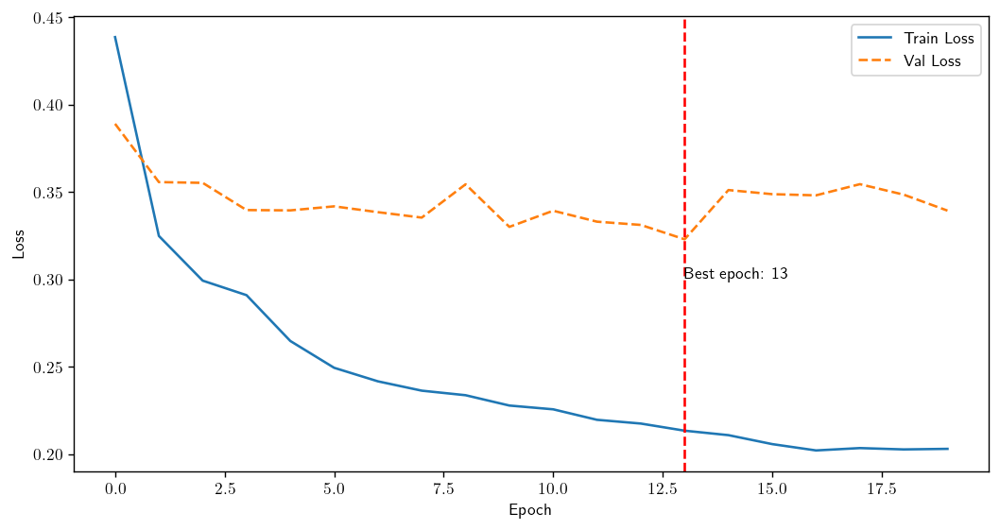

------------ COORDINATE DELTAS ------------


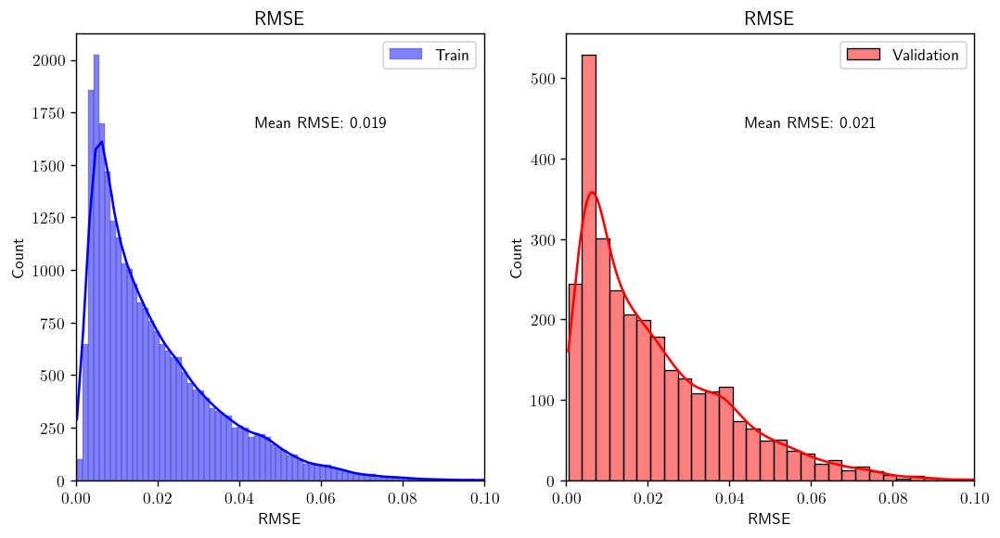

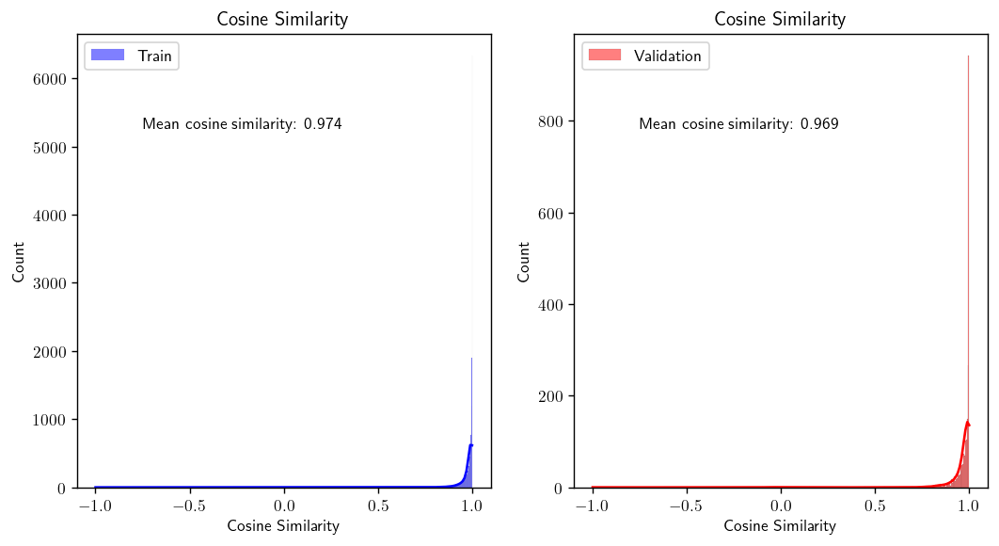

------------ GRIPPER ACTIONS ------------
Classification report for Train set: 
                  precision    recall  f1-score   support

      0 (Close)       0.87      0.71      0.78      3061
1 (Do not move)       0.96      0.98      0.97     19147
       2 (Open)       0.79      0.83      0.81      3261

       accuracy                           0.93     25469
      macro avg       0.87      0.84      0.85     25469
   weighted avg       0.93      0.93      0.93     25469

Classification report for Validation set: 
                  precision    recall  f1-score   support

      0 (Close)       0.66      0.65      0.66       373
1 (Do not move)       0.96      0.98      0.97      2161
       2 (Open)       0.64      0.57      0.61       367

       accuracy                           0.89      2901
      macro avg       0.76      0.74      0.75      2901
   weighted avg       0.88      0.89      0.89      2901



python(40416) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40417) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40418) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40419) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40420) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40421) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40422) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40423) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40424) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


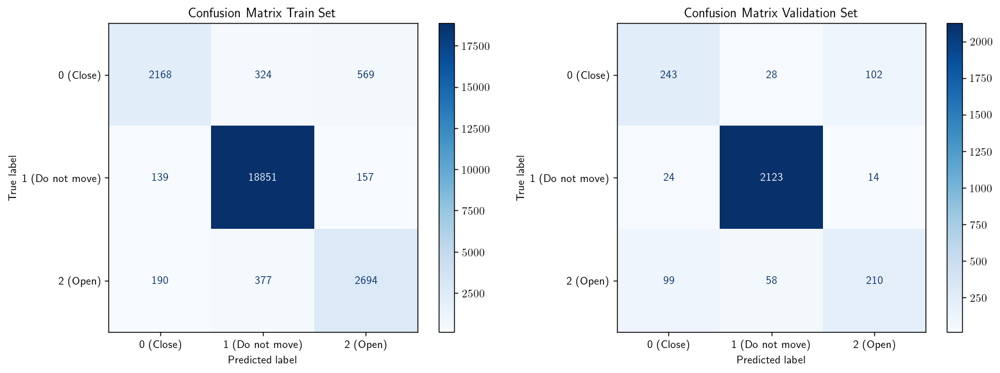

In [115]:
train_preds, train_true, val_preds, val_true, train_inputs, val_inputs, rmse_vec_train, rmse_vec_val, cos_vec_train, cos_vec_val, train_true_grp, train_pred_grp, val_true_grp, val_pred_grp = model_evaluation(
    VAE_SH, train_dataloader, val_dataloader, exp_kwargs_VAE_SH, run_new_eval=False, folder="VAE_SH_cyclic_64D_Sched", train_losses=[], val_losses=[], wandb_run_dir=None, display_results=True, pos_criterion=pos_criterion, grp_criterion=grp_criterion, first_epoch = 0, xlim_rmse=[0, 0.1])

**Figure 42.** Prediction performance metrics for the self-supervised plus supervised head model. (Top) Evolution of the training and validation total losses. (Top middle) Root mean squared error (RMSE) for the training (left) and validation (right) sets, with their respective means. (Bottom middle) Cosine similarity for the training (left) and validation (right) sets, with their respective means. (Bottom) Classification reports and confusion matrices for the training (left) and validation (right) sets.

The model achieved a remarkably good accuracy in the Cartesian deltas prediction, with mean RMSEs of 0.019 and 0.021 in the training and validation sets, respectively; and mean cosine similarities of 0.974 and 0.969 in each respective set. Compared to the final fine-tuned end-to-end model, this was an improvement of 0.03-0.043 in mean RMSE -for comparison, the improvement between the baseline end-to-end was only 0.02-; and of more than 0.15 in the cosine similarity. Therefore, the predicted movements are accurate in absolute value and in the imposed direction. Regarding the gripper action prediction, the validation set average F1 (0.89) was better than that of the fine-tuned end-to-end model (0.88), as well as in the class 2 F1 (0.61 vs. 0.57). On the other hand, the performance in the training set was slightly decreased (0.93).

The accuracy metrics in the training and validation sets indicate that the self-supervised method was of great help in the movement prediction, but only margnially helpful in the gripper action prediction. Given both models were chosen given their performance in the validation set, a final comparison in the test set is necessary. 

### Question 3.b Assessing the suitability of self-supervised learning 
For the final two questions, you are required to assess the performance of the self-supervised + supervised head model and the end-to-end model that you have trained. Additionally, you are required to holistically evaluate whether self-supervised learning has been beneficial for this task.

#### Question 3.b.i Assessing the suitability of self-supervised learning (4 marks) 

##### Task
- In the code block below, evaluate the performance of the model you trained in question 3.a and the model you trained in question 1.c.i, using the test set. Additionally use the same metrics to train and evaluate the model that you used for question 1.c.i. Markers should be able to run the cell such that both models are run on the appropriate dataset. You may however, reference previously defined objects (e.g., loaded data and use previously defined functions).

In [116]:
def model_test(model, folder, test_dataloader, display_results=True):

    #Load model
    new_folder = os.path.join("trained_models/", folder)
    if MAC:
        model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_e2e_{folder}.pt"), weights_only=True))
    else:
        model.load_state_dict(torch.load(os.path.join(new_folder, f"best_epoch_e2e_{folder}.pt"), map_location=torch.device("cpu"), weights_only=True))

    #Evaluate the model on the test set
    test_criterion_eval = TrackerBalancedLoss(
        loss_lkp={
            "pos":copy.deepcopy(pos_criterion),
            "grp":copy.deepcopy(grp_criterion)
        },
        name="test",
        mo=None
        )

    evaluate_model_fn = ValidateSingleEpoch(half_precision=exp_kwargs["half_precision"], cache_preds=True, cache_inputs=True)
    test_loss, test_preds, test_true, test_inputs = evaluate_model_fn(model=model, data_loader=test_dataloader, gpu=True, mac=MAC, criterion=test_criterion_eval)
    
    if display_results:
        
        #Display the RMSE and cosine similarity for the coordinate deltas
        print('------------ COORDINATE DELTAS ------------')
        rmse_test, mean_rmse_test = rmse(test_preds['pos'], test_true['pos'])

        #Plot
        plt.figure(figsize=(5, 5))
        sns.histplot(rmse_test, kde=True, color='gold', edgecolor = 'orange', label='Test')
        plt.title('RMSE Test Set')
        plt.xlabel('RMSE')
        plt.ylabel('Frequency')
        plt.legend()
        plt.text(0.1, 400, f"Mean RMSE: {mean_rmse_test:.3f}", horizontalalignment='center', verticalalignment='center', fontsize = 10)
        plt.xlim(0, 0.2)
        plt.show()

        cos_test, mean_cos_test = cos_sim(test_preds['pos'], test_true['pos'])

        #Plot
        plt.figure(figsize=(5, 5))
        sns.histplot(cos_test, kde=True, color='gold', edgecolor = 'orange', label='Test')
        plt.title('Cosine Similarity Test Set')
        plt.xlabel('Cosine Similarity')
        plt.legend()
        plt.text(0.4, 500, f"Mean cosine similarity: {mean_cos_test:.3f}", horizontalalignment='center', verticalalignment='center', fontsize = 10)
        plt.xlim(0, 1)
        plt.show()

        #Display the classification report for the gripper actions
        print('------------ GRIPPER ACTIONS ------------')
        test_true_grp = undo_one_hot_encoding(test_true['grp'])
        test_pred_grp = compute_predicted_class(test_preds['grp'])
    
        fig, ax = plt.subplots(1, 1, figsize=(5, 5))   
        display_sklearn_reports(test_true_grp, test_pred_grp, 'Test', fig=fig, ax=ax)
        
    return test_preds, test_true, test_inputs, rmse_test, cos_test, test_true_grp, test_pred_grp
    


100%|██████████| 5/5 [00:00<00:00,  8.57it/s]


------- EVALUATING E2E MODEL -------
------------ COORDINATE DELTAS ------------


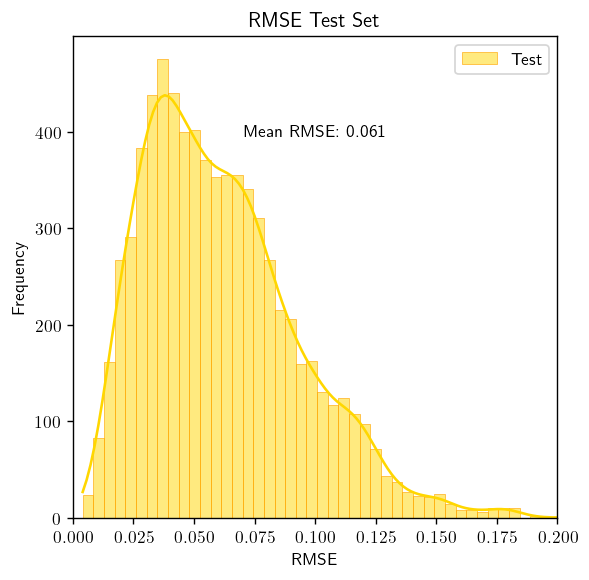

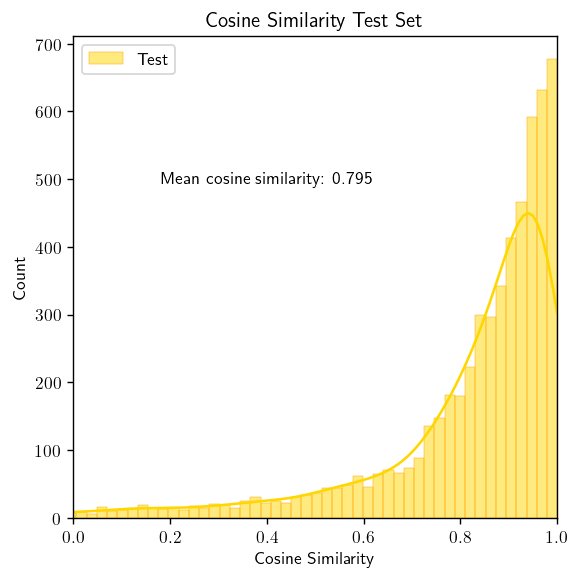

------------ GRIPPER ACTIONS ------------
Classification report for Test set: 
                  precision    recall  f1-score   support

      0 (Close)       0.67      0.63      0.65       943
1 (Do not move)       0.94      0.97      0.96      5516
       2 (Open)       0.64      0.55      0.59       893

       accuracy                           0.88      7352
      macro avg       0.75      0.72      0.74      7352
   weighted avg       0.87      0.88      0.88      7352



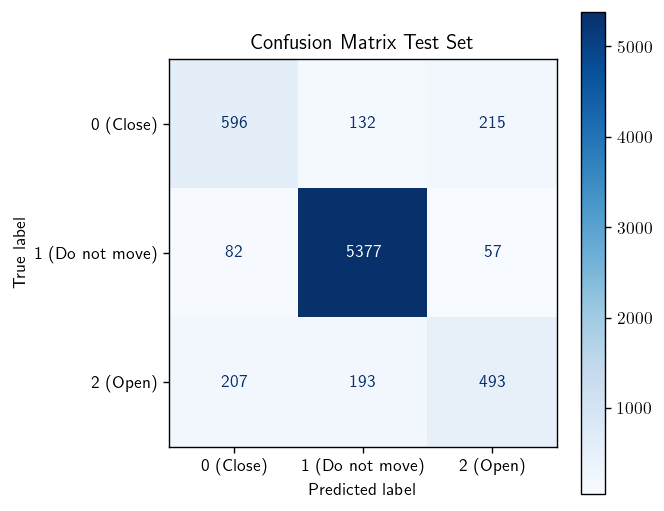

In [117]:
#1. Prepare data for test evaluation
test_nps = load_all_files(test_dh.loc,"test_[0-9]+.h5",keys=_keys)
test_nps_copy = copy.deepcopy(test_nps)

#1.A. Supervised model
global_transforms_copy = copy.deepcopy(global_transforms)
test_dataset_E2E = NpDictDataset(
    array_dict={k:test_nps_copy[k].astype(np.float32) for k in test_nps},
    transform_lkp = global_transforms_copy,
    dep_vars = ["actions"],
    indep_vars = [
        "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
        "ee_cartesian_vel_ob", "joint_pos_ob"
        ],
    target_offset=exp_kwargs["target_offset"]
    )

test_dataloader_E2E = DataLoader(
    test_dataset_E2E,
    batch_size=exp_kwargs["batch_size"],
    shuffle=False,
    collate_fn=collate_func,
    generator=torch.Generator().manual_seed(0)
        )

#1.B. Supervised Head + VAE
global_transforms_copy = copy.deepcopy(global_transforms_vae_sh)
test_dataset_SH = NpDictDataset(
        array_dict={k:test_nps_copy[k].astype(np.float32) for k in test_nps},
        transform_lkp = global_transforms_copy,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )

test_dataloader_SH = DataLoader(
    test_dataset_SH,
    batch_size=exp_kwargs["batch_size"],
    shuffle=False,
    collate_fn=collate_func,
    generator=torch.Generator().manual_seed(0)
    )

test_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="test",
    mo=mo
    )

#2. Evaluate the model
#2.1. Supervised model
print('------- EVALUATING E2E MODEL -------')
test_preds_E2E, test_true_E2E, test_inputs_E2E, rmse_test_E2E, cos_test_E2E, test_true_grp_E2E, test_pred_grp_E2E = model_test(
    model_reg, "E2E_WD_BN", test_dataloader_E2E, display_results=True)


**Figure 43.** Evaluation of the fine-tuned end-to-end model in the test set. (Top) Root mean squared error (RMSE), with its mean. (Middle) Cosine similarity with its respective mean. (Bottom) Classification report and confusion matrix.

------- EVALUATING VAE + SUPERVISED HEAD MODEL -------
------------ COORDINATE DELTAS ------------


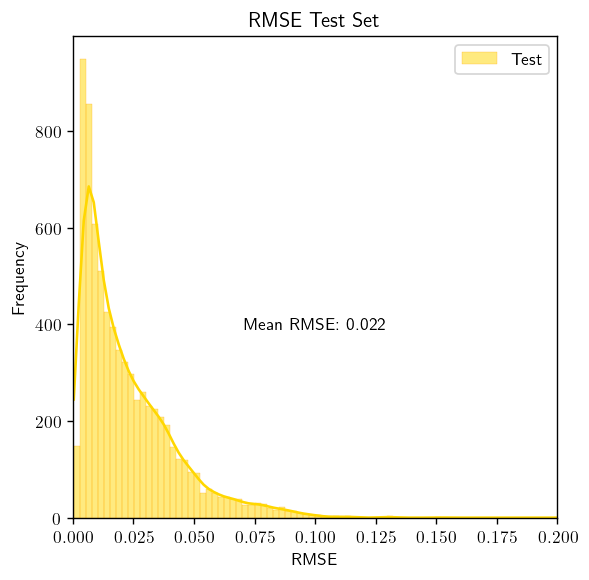

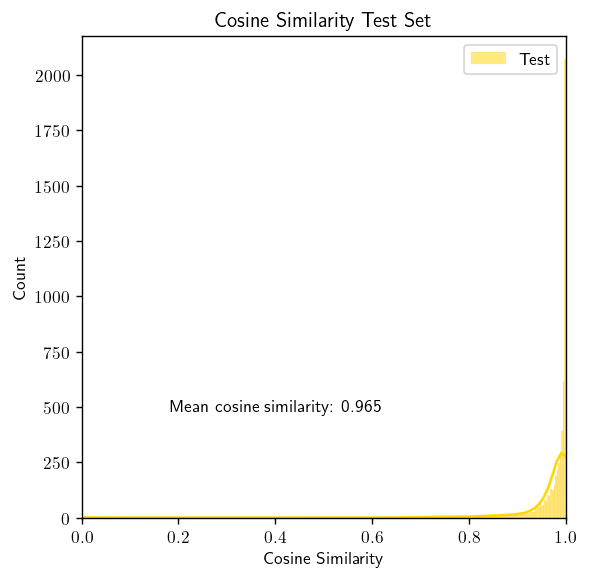

------------ GRIPPER ACTIONS ------------
Classification report for Test set: 
                  precision    recall  f1-score   support

      0 (Close)       0.72      0.62      0.67       943
1 (Do not move)       0.96      0.98      0.97      5516
       2 (Open)       0.63      0.63      0.63       893

       accuracy                           0.89      7352
      macro avg       0.77      0.74      0.76      7352
   weighted avg       0.89      0.89      0.89      7352



python(40636) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40637) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40638) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40639) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(40640) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


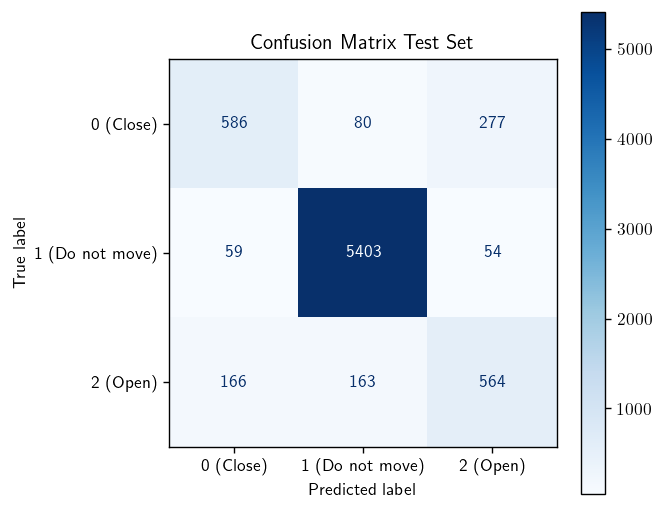

In [118]:
#2.2. Supervised Head + VAE
print('------- EVALUATING VAE + SUPERVISED HEAD MODEL -------')
test_preds_SH, test_true_SH, test_inputs_SH, rmse_test_SH, cos_test_SH, test_true_grp_SH, test_pred_grp_SH = model_test(
    VAE_SH.to("mps"), "VAE_SH_cyclic_64D_Sched", test_dataloader_SH, display_results=True)

**Figure 44.** Evaluation of the self-supervised model plus a supervised head in the test set. (Top) Root mean squared error (RMSE), with its mean. (Middle) Cosine similarity with its respective mean. (Bottom) Classification report and confusion matrix.

In the Cartesian deltas predictions, the performance of both models were very similar to that in the validation sets. For the end-to-end model, it achieved a 0.061 mean RMSE (0.064 in the validation set) and a mean cosine similarity of 0.795 (0.781 in the validation set), a slight increase in performance. On the other hand, the self-supervised based model very subtly decreased its performance, with a 0.022 mean RMSE (0.021 in the validation set) and a 0.965 mean cosine similarity (0.969 in the validation set). In terms of the gripper actions, the end-to-end model achieved an equal 0.88 F1. The self-supervised head achieved a slighlty better F1 of 0.89 (0.88 in validation set).

When compared head-to-head, the self-supervised based model outperformed the end-to-end model by a large margin (0.039 in mean RMSE, 0.184 in mean cosine similarity). In the gripper action predictions, it also outperformed the end-to-end model in weighted average F1 (0.89 vs 0.88), and in each individual F1 (0.68 vs 0.65 in action 0; 0.97 vs. 0.96 in action 1; 0.64 vs. 0.59 in action 2). Failure Mode 2 (class 1 actions misclassified as class 2) was less present in either evaluation (around 100 errors per model). Failure Mode 1 was indeed prevalent in the end-to-end model (325 total errors), but less important in its counterpart (243 errors). The most important sources of errors were nevertheless actions 0 and 2 being confused.

#### Question 3.b.ii Justification (5 marks)

##### Task
- Conclude whether the self-supervised pre-training was beneficial for the task of predicting actions. Your answer should not solely focus on final performance but rather be nuianced and balance other model development considerations for example parameter count and speed of convergence. Also, if you believe the comparison between the model trained in question 3.a.i aganst the model trained in question 2.c.i is not _fair_, discuss further experiments which you would perform to reduce the bias in your conclusions. Provide __empirical evidence__ to support your conclusions. __0 marks__ will be awarded if empirical evidence is __not__ provided.

In [154]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)


print("E2E model parameters: ", count_parameters(model_reg))
print("VAE model parameters: ", count_parameters(iVAE))

for param in VAE_SH.vae.parameters():
        param.requires_grad = False

print("VAE + Supervised Head model parameters: ", count_parameters(VAE_SH))

E2E model parameters:  6576798
VAE model parameters:  12974482
VAE + Supervised Head model parameters:  99462


The self-supervised pre-training resulted beneficial especially for predicting the movements of the gripper, and marginally for predicting each frame's gripper action (0, open; 1, do not move; 2, close). As shown by the exploration in Q2.c., the encoder provided meaningful latent representations which corresponded to different video sequences, as well as trajectories inside these "mini-clusters" corresponding to their respective frame sequences. This likely helped the attached supervised head to predict where in the sequence movement is expected, and the magnitude of such a movement. However, this did not translate into a significant increase in the gripper action prediction in the test set.

However, how did self-supervised pre-training affect computational complexity? The VAE model had double the number of parameters (13M vs. 6.5M for the end-to-end). This, however, did not result in increased computational time, with an average of 65s/epoch for the fine-tuned end-to-end model, and an average of 45s/epoch for the VAE. Nevertheless, the VAE was trained for 20 epochs to achieve good convergence, which indeed increased time of computation. Training the supervised head (100k parameters), on the other hand, was quite fast (25s/epoch for 20 epochs). Therefore, the total time of end-to-end training was around 11 minutes, and approximately 25 minutes for the VAE plus the supervised head; more than double. Moreover, the end-to-end models converged to the best solution in 5-6 epochs, while marginal loss decrease was still observed after 20 epochs in the VAE.

Of great importance is also the comparison between architectures. While images are "encoded" in both setups, the observations are concetenated directly with the latent space in the self-supervised setting, but "encoded" in the end-to-end training. Directly passing the raw Cartesian observations to the dense layer in the end-to-end model was tried to make the comparisons fairer, but accuracy was subpar in the movement prediction [[link]](https://wandb.ai/gplazaarriola-university-college-london-ucl-/cw2_v2/reports/E2E_WD_BN_DirectObs--VmlldzoxMDUwMzQzNw?accessToken=77uxfn8ltoki25hzjxs0tsrfzkp6linph5aw0o1hc4unkmsv0sa8ufed34h3ksjp). 

In conclusion, pre-training a self-supervised encoder promoted an increase in performance at the expense of doubling the training time. In my opinion, after being unable to find standards of good performance for such tasks in the literature, it seems that this increase is not enough to justify doubling the computational expense. Moreover, self-supervised methods are more beneficial when labeled data is not available, a problem here not faced. What are the performance goals? What are the computational resources of the institution, and how many can be dedicated to this task? These are key questions that must be thought through before real-world implementation by the responsible professionals to ensure a robust and resources-aware solution.